# **GitHub link :** https://github.com/zeelghori27012004/Exploratory_Data_Analysis/tree/main/project

# **Dataset link :** https://www.data.gov.in/resource/crime-against-women-during-2001-2012

# **Google Colab file link :** https://colab.research.google.com/drive/12Pv-ddGVAe-GdeqLeFcXKMJLrXSYCsD1?usp=sharing

# **Google Drive Link :** https://drive.google.com/drive/folders/16xn2esu8eWbz0kd2csHLuertiyzbVXib?usp=sharing



# 1. Understand the Problem Statement and installing libraries

## **Problem Statement:**

Analysis of Crime Trends in India (2001–2012)

The dataset contains annual crime statistics across various States and Union Territories (STAT/UT) of India for multiple crime categories (CRIME HEAD) from 2001 to 2012. This analysis aims to uncover patterns, trends, and insights that can help policymakers, law enforcement agencies, and researchers understand crime dynamics over time.

## **Objectives:**

**Exploratory Data Analysis (EDA):**

*   Provide an overview of the dataset, including data completeness, structure, and descriptive statistics.

*   Identify any potential data quality issues, such as duplicates or inconsistent formatting.

*   Visualize the overall crime trends across the years and evaluate the distribution of crimes by state and crime category.



**Time Series Analysis:**


*   Analyze how crime trends have evolved over the years at both state and national levels.
*   Identify states/UTs with consistently high or low crime rates.
*   Detect any seasonal patterns or anomalies in the crime data.
*   Compare crime trends across different crime categories to understand which types of crimes have seen significant changes.


**Key Stakeholders:**

*   Government and Policymakers: To assess the effectiveness of crime prevention policies over the years and prioritize future actions.
*   Law Enforcement Agencies: To allocate resources effectively based on crime trends in different regions and categories.
*   Researchers and Analysts: To identify social, economic, or geographic factors contributing to variations in crime rates.
*   Public: To increase awareness and transparency regarding crime rates and trends in their regions.


## **Problem Type:**
This is primarily a time series analysis problem, as it involves analyzing crime data trends over multiple years. It also includes elements of descriptive analytics to understand the distribution of crimes across states and categories.

## **Deliverables:**
Cleaned and preprocessed dataset ready for analysis.

Visualizations showing:

*   Total crimes across years.
*   State-wise distribution of crimes.
*   Trends for top and bottom-performing states/UTs in specific years.
*   Trends for specific crime categories.

Insights and observations derived from EDA and time series analysis.

In [5]:
!pip install pandas matplotlib seaborn statsmodels scikit-learn --quiet
!pip install missingno
!pip install prophet


In [6]:
# Import necessary libraries
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import zscore
from sklearn.metrics import mean_squared_error, r2_score



# 2. Load the Data

In [7]:
url = "https://raw.githubusercontent.com/zeelghori27012004/Exploratory_Data_Analysis/refs/heads/main/project/Crime_against_women_in_India.csv"
df = pd.read_csv(url)

# 3. Data Overview

In [8]:
print("\nDataset Shape:")
no_of_rows = df.shape[0]
no_of_cols = df.shape[1]
print("No of rows : " , no_of_rows)
print("No of columns : " , no_of_cols)


Dataset Shape:
No of rows :  324
No of columns :  14


In [9]:
print("First five rows of the dataset:")
print(df.head())

First five rows of the dataset:
            STATE/UT CRIME HEAD  2001  2002  2003  2004  2005  2006  2007  \
0     Andhra Pradesh       RAPE   871  1002   946  1016   935  1049  1070   
1  Arunachal Pradesh       RAPE    33    38    31    42    35    37    48   
2              Assam       RAPE   817   970  1095  1171  1238  1244  1437   
3              Bihar       RAPE   888  1040   985  1390  1147  1232  1555   
4       Chhattisgarh       RAPE   959   992   898   969   990   995   982   

   2008  2009  2010  2011  2012  
0  1257  1188  1362  1442  1341  
1    42    59    47    42    46  
2  1438  1631  1721  1700  1716  
3  1302   929   795   934   927  
4   978   976  1012  1053  1034  


In [10]:
print("\nDataset Information:")
df.info()


Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 324 entries, 0 to 323
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   STATE/UT    324 non-null    object
 1   CRIME HEAD  324 non-null    object
 2   2001        324 non-null    int64 
 3   2002        324 non-null    int64 
 4   2003        324 non-null    int64 
 5   2004        324 non-null    int64 
 6   2005        324 non-null    int64 
 7   2006        324 non-null    int64 
 8   2007        324 non-null    int64 
 9   2008        324 non-null    int64 
 10  2009        324 non-null    int64 
 11  2010        324 non-null    int64 
 12  2011        324 non-null    int64 
 13  2012        324 non-null    int64 
dtypes: int64(12), object(2)
memory usage: 35.6+ KB


In [11]:
print("\nStatistical Summary of Numerical Columns:")
print(df.describe())


Statistical Summary of Numerical Columns:
                2001          2002           2003           2004  \
count     324.000000     324.00000     324.000000     324.000000   
mean     1754.654321    1748.00000    1718.962963    1882.623457   
std      8959.988710    8901.83426    8777.118834    9655.389778   
min         0.000000       0.00000       0.000000       0.000000   
25%         3.000000       3.00000       2.000000       4.000000   
50%        64.000000      72.00000      81.500000      82.000000   
75%       771.250000     799.50000     815.500000     881.500000   
max    143795.000000  143034.00000  140601.000000  154333.000000   

                2005           2006           2007           2008  \
count     324.000000     324.000000     324.000000     324.000000   
mean     1899.703704    2005.919753    2252.716049    2383.277778   
std      9721.530392   10324.087197   11696.767729   12392.687525   
min         0.000000       0.000000       0.000000       0.000000   

# 4. Data Preparation

In [12]:
df.dtypes

,0
STATE/UT,object
CRIME HEAD,object
2001,int64
2002,int64
2003,int64
2004,int64
2005,int64
2006,int64
2007,int64
2008,int64


In [13]:
# Ensure years are numeric
for year in range(2001, 2013):
    df[str(year)] = pd.to_numeric(df[str(year)], errors='coerce')

In [14]:
value_to_remove = "TOTAL CRIMES AGAINST WOMEN"
# Remove rows where any column has the specific value
df = df[~df.isin([value_to_remove]).any(axis=1)]

value_to_remove = "All India"
# Remove rows where any column has the specific value
df = df[~df.isin([value_to_remove]).any(axis=1)]

In [15]:
df

,STATE/UT,CRIME HEAD,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,Andhra Pradesh,RAPE,871,1002,946,1016,935,1049,1070,1257,1188,1362,1442,1341
1,Arunachal Pradesh,RAPE,33,38,31,42,35,37,48,42,59,47,42,46
2,Assam,RAPE,817,970,1095,1171,1238,1244,1437,1438,1631,1721,1700,1716
3,Bihar,RAPE,888,1040,985,1390,1147,1232,1555,1302,929,795,934,927
4,Chhattisgarh,RAPE,959,992,898,969,990,995,982,978,976,1012,1053,1034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,D&N Haveli,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,0,0,0,0,0,0,0,0,0,0,0,0
283,Daman & Diu,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,0,0,0,0,0,0,0,0,0,0,0,0
284,Delhi UT,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,1,0,0,0,1,1,0,0,0,0,1,0
285,Lakshadweep,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,0,0,0,0,0,0,0,0,0,1,0,0


In [16]:
# Check for duplicates
print("\nChecking for duplicate rows:")
print(df.duplicated().sum())
df = df.drop_duplicates()


Checking for duplicate rows:
0


In [17]:
print(df['STATE/UT'].value_counts())
print(df['CRIME HEAD'].value_counts())

for col in ['STATE/UT', 'CRIME HEAD']:
    print(f"\nUnique values in {col}:")
    print(df[col].unique())

STATE/UT
Andhra Pradesh       8
Uttarakhand          8
Punjab               8
Rajasthan            8
Sikkim               8
Tamil Nadu           8
Tripura              8
Uttar Pradesh        8
West Bengal          8
Nagaland             8
A&N Islands          8
Chandigarh           8
D&N Haveli           8
Daman & Diu          8
Delhi UT             8
Lakshadweep          8
Odisha               8
Mizoram              8
Arunachal Pradesh    8
Himachal Pradesh     8
Assam                8
Bihar                8
Chhattisgarh         8
Goa                  8
Gujarat              8
Haryana              8
Jammu & Kashmir      8
Meghalaya            8
Jharkhand            8
Karnataka            8
Kerala               8
Madhya Pradesh       8
Maharashtra          8
Manipur              8
Puducherry           8
Name: count, dtype: int64
CRIME HEAD
RAPE                                                   35
KIDNAPPING & ABDUCTION                                 35
DOWRY DEATH                      

In [18]:
# Correct inconsistent formatting in 'STATE/UT' column
df['STATE/UT'] = df['STATE/UT'].str.strip().str.title()

In [19]:
#check null values
df_mis = df.isnull().sum()
df_mis_per = df.isnull().mean()*100
df_mis_table=pd.concat([df_mis,df_mis_per],axis=1)
# Rename the columns
df_mis_table.rename(columns = {0 : 'Missing Values', 1 : '% of Total Values'}, inplace=True)
df_mis_table

,Missing Values,% of Total Values
STATE/UT,0,0.0
CRIME HEAD,0,0.0
2001,0,0.0
2002,0,0.0
2003,0,0.0
2004,0,0.0
2005,0,0.0
2006,0,0.0
2007,0,0.0
2008,0,0.0


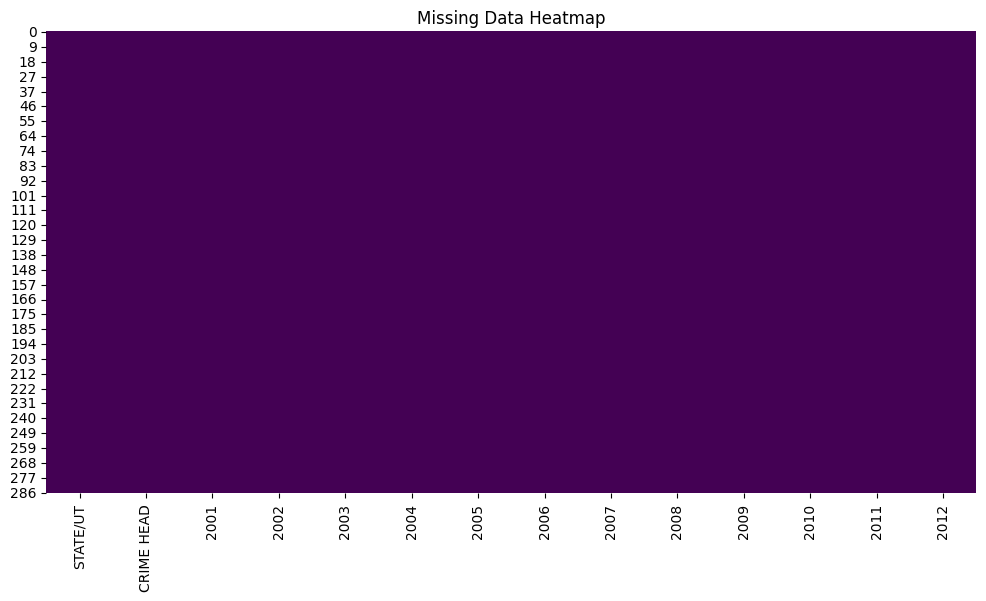

In [20]:
# Plotting missing data heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Data Heatmap")
plt.show()

# 5. Feature Engineering

### Creating and adding new columns to the dataset

In [21]:
# Calculate total crimes, growth rate (CAGR), and average yearly crimes
df_updated = df.copy()
yearly_df = df_updated.loc[:, '2001':'2012']
df_updated['Total Crimes'] = yearly_df.sum(axis=1)
df_updated['CAGR'] = ((df_updated['2012'] / df_updated['2001'])**(1/11) - 1) * 100
df_updated['Average Yearly Crime'] = yearly_df.mean(axis=1)


In [22]:
# Most common crime type per state/UT
common_crime = df.groupby('STATE/UT')['CRIME HEAD'].agg(lambda x: x.mode().iloc[0])
print(common_crime)

STATE/UT
A&N Islands          ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Andhra Pradesh       ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Arunachal Pradesh    ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Assam                ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Bihar                ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Chandigarh           ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Chhattisgarh         ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
D&N Haveli           ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Daman & Diu          ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Delhi Ut             ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Goa                  ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Gujarat              ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Haryana              ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO...
Himachal Pradesh     ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MO.

### Feature Engineering for Visualization

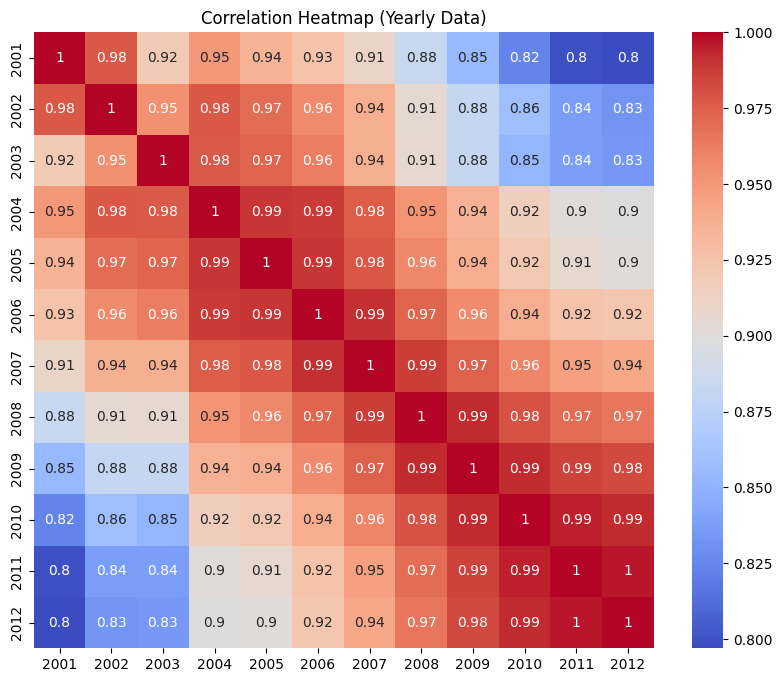

In [23]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = yearly_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap (Yearly Data)')
plt.show()

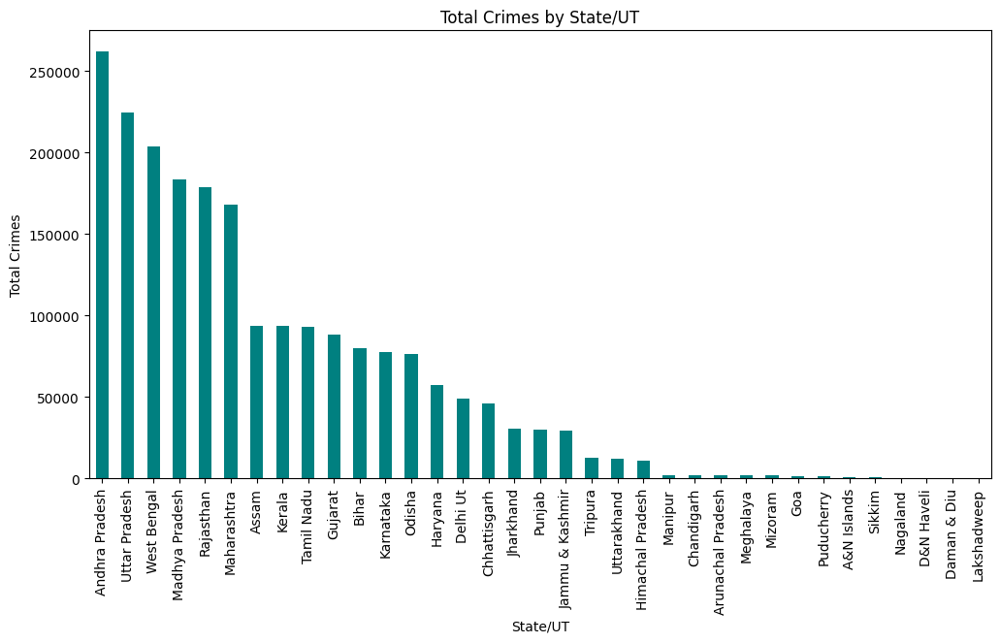

In [24]:
# Total crimes by state/UT
plt.figure(figsize=(12, 6))
total_crime_state = df_updated.groupby('STATE/UT')['Total Crimes'].sum().sort_values(ascending=False)
total_crime_state.plot(kind='bar', color='teal')
plt.title('Total Crimes by State/UT')
plt.ylabel('Total Crimes')
plt.xlabel('State/UT')
plt.xticks(rotation=90)
plt.show()

In [25]:
# Total crimes by year
df_years = df.melt(id_vars=['STATE/UT', 'CRIME HEAD'], value_vars=[str(year) for year in range(2001, 2013)],
                   var_name='Year', value_name='Crime Count')
df_years['Year'] = pd.to_datetime(df_years['Year'], format='%Y')

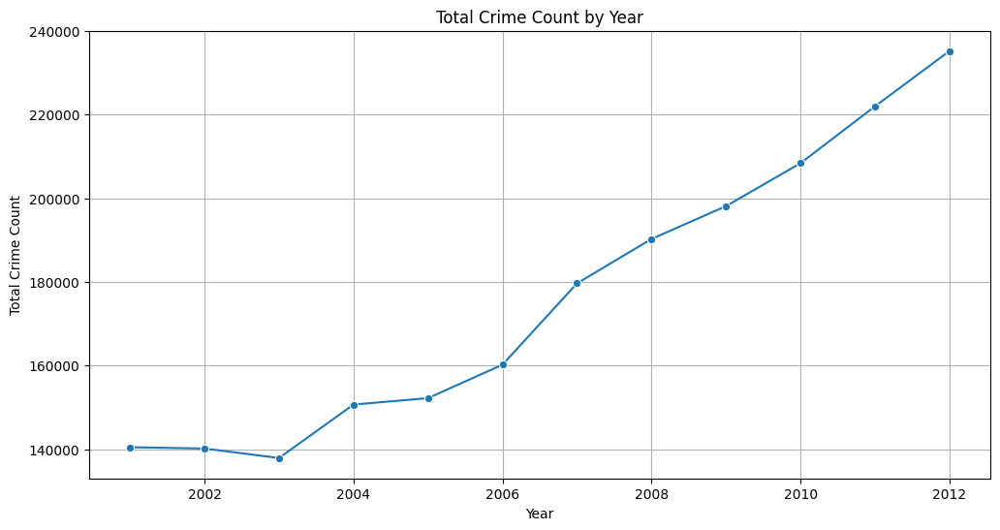

In [26]:
#Plot total crime count by year
plt.figure(figsize=(12, 6))
total_crime_by_year = df_years.groupby('Year')['Crime Count'].sum().reset_index()
sns.lineplot(data=total_crime_by_year, x='Year', y='Crime Count', marker='o')
plt.title('Total Crime Count by Year')
plt.xlabel('Year')
plt.ylabel('Total Crime Count')
plt.grid(True)
plt.show()

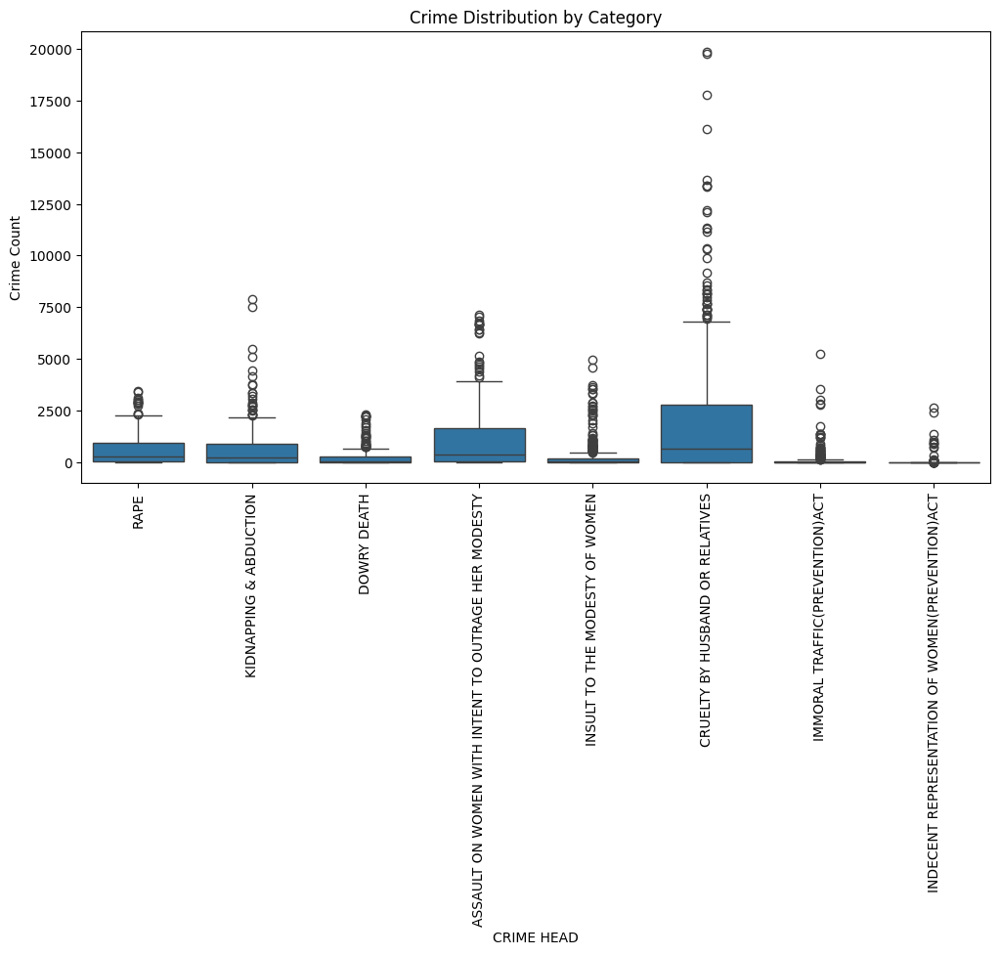

In [27]:
# Crime distribution by category
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_years, x='CRIME HEAD', y='Crime Count')
plt.xticks(rotation=90)
plt.title('Crime Distribution by Category')
plt.show()

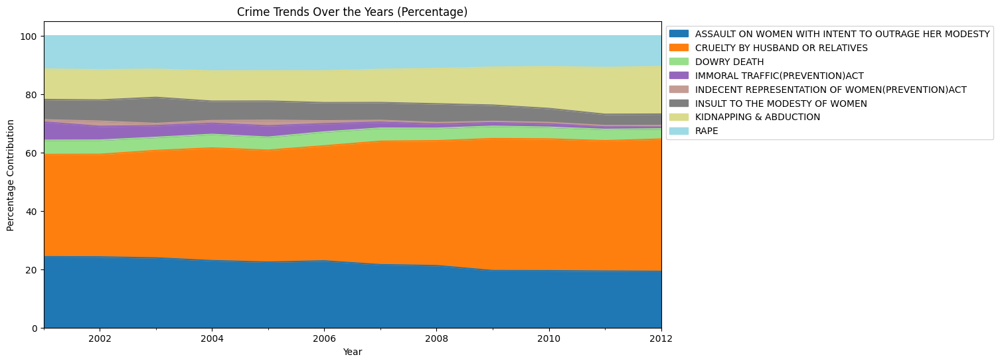

In [28]:
# Year-wise percentage contribution of each CRIME HEAD
crime_category_trends = df_years.groupby(['Year', 'CRIME HEAD'])['Crime Count'].sum().reset_index()
crime_category_pivot = crime_category_trends.pivot(index='Year', columns='CRIME HEAD', values='Crime Count')
crime_category_pivot_percentage = crime_category_pivot.div(crime_category_pivot.sum(axis=1), axis=0) * 100

crime_category_pivot_percentage.plot(kind='area', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title('Crime Trends Over the Years (Percentage)')
plt.xlabel('Year')
plt.ylabel('Percentage Contribution')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

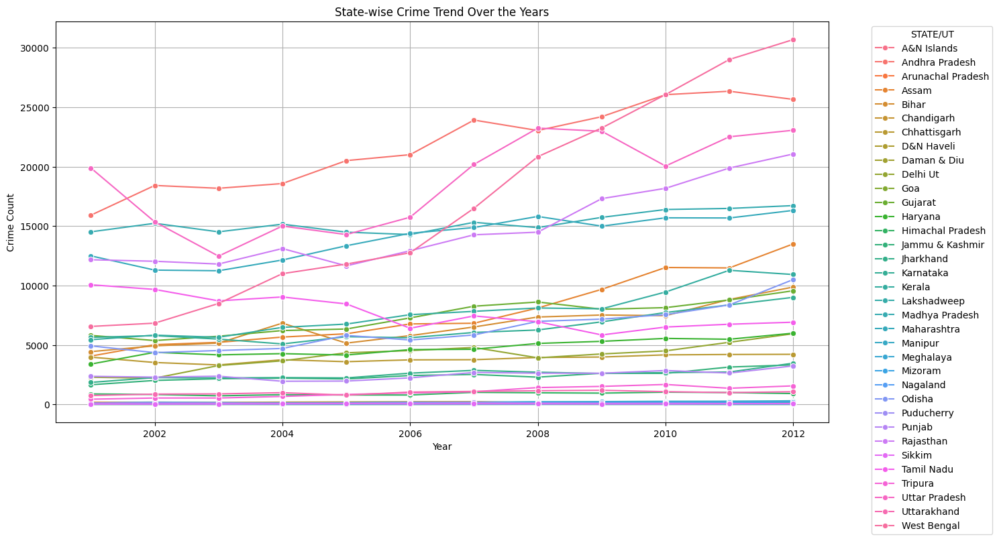

In [29]:
# Total crime count per state over the years
state_crime_trend = df_years.groupby(['Year', 'STATE/UT'])['Crime Count'].sum().reset_index()
plt.figure(figsize=(15, 8))
sns.lineplot(data=state_crime_trend, x='Year', y='Crime Count', hue='STATE/UT', marker='o')
plt.title('State-wise Crime Trend Over the Years')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(title='STATE/UT', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


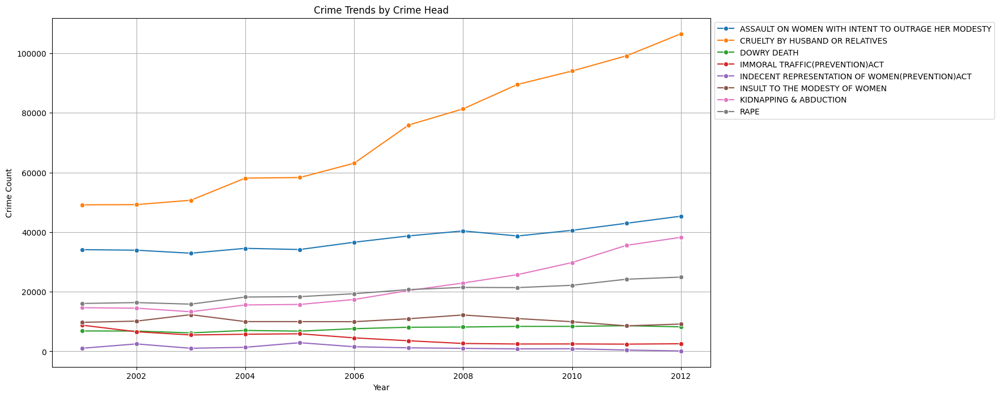

In [30]:
# Total crime count for each CRIME HEAD over the years
crime_head_trend = df_years.groupby(['Year', 'CRIME HEAD'])['Crime Count'].sum().reset_index()
plt.figure(figsize=(15, 8))
sns.lineplot(data=crime_head_trend, x='Year', y='Crime Count', hue='CRIME HEAD', marker='o')
plt.title('Crime Trends by Crime Head')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


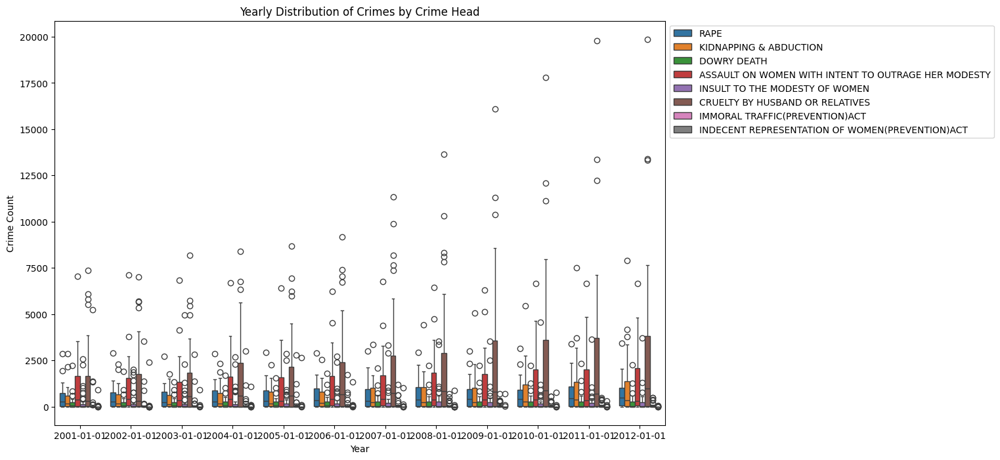

In [31]:
# CRIME HEAD distribution for each year
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_years, x='Year', y='Crime Count', hue='CRIME HEAD')
plt.title('Yearly Distribution of Crimes by Crime Head')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

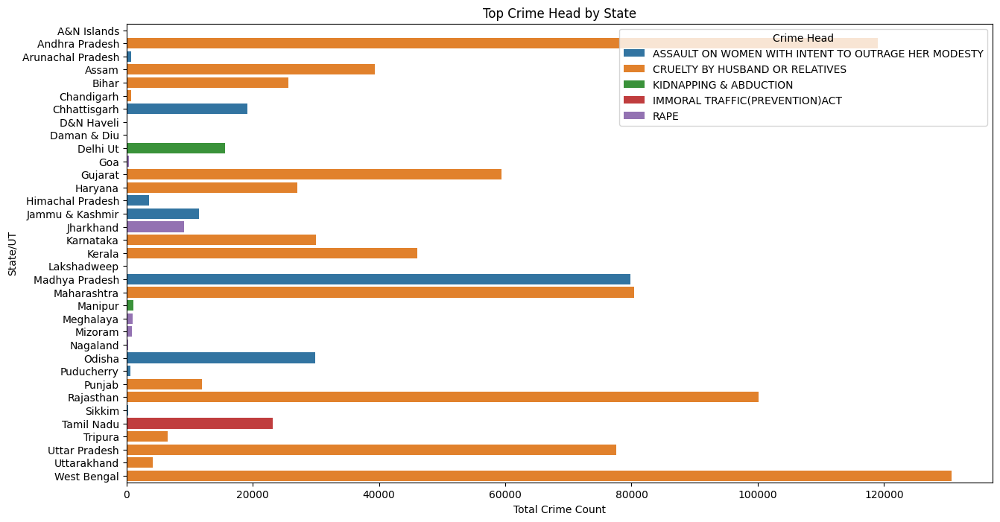

In [32]:
# Find the top CRIME HEAD for each state
top_crime_by_state = df_years.groupby(['STATE/UT', 'CRIME HEAD'])['Crime Count'].sum().reset_index()
top_crime_by_state = top_crime_by_state.loc[top_crime_by_state.groupby('STATE/UT')['Crime Count'].idxmax()]

# Plot
plt.figure(figsize=(15, 8))
sns.barplot(data=top_crime_by_state, x='Crime Count', y='STATE/UT', hue='CRIME HEAD', dodge=False)
plt.title('Top Crime Head by State')
plt.xlabel('Total Crime Count')
plt.ylabel('State/UT')
plt.legend(title='Crime Head', loc='upper right')
plt.show()


## Feature Engineering for Model Fitting

In [33]:
# Identify and treat outliers
df_no_outliers = df.copy()
for year in range(2001, 2013):
    Q1 = df[str(year)].quantile(0.25)
    Q3 = df[str(year)].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_no_outliers[str(year)] = np.clip(df[str(year)], lower_bound, upper_bound)


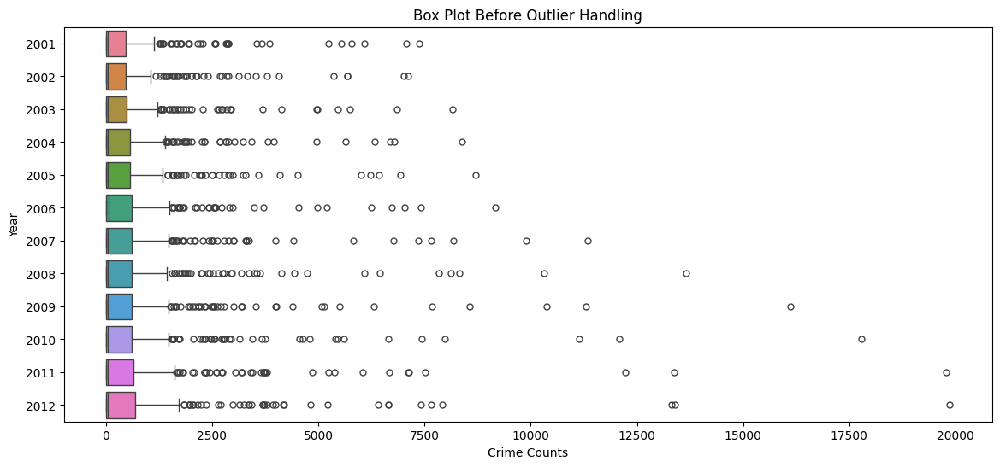

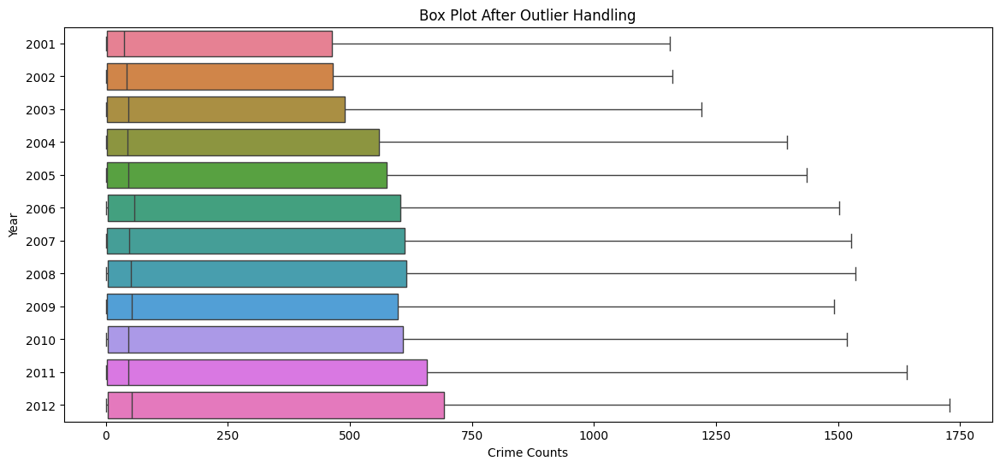

In [34]:
# Visualization: Boxplot before and after outlier treatment
plt.figure(figsize=(14, 6))
sns.boxplot(data=df.loc[:, '2001':'2012'], orient="h", fliersize=5)
plt.title("Box Plot Before Outlier Handling")
plt.xlabel("Crime Counts")
plt.ylabel("Year")
plt.show()

plt.figure(figsize=(14, 6))
sns.boxplot(data=df_no_outliers.loc[:, '2001':'2012'], orient="h", fliersize=5)
plt.title("Box Plot After Outlier Handling")
plt.xlabel("Crime Counts")
plt.ylabel("Year")
plt.show()


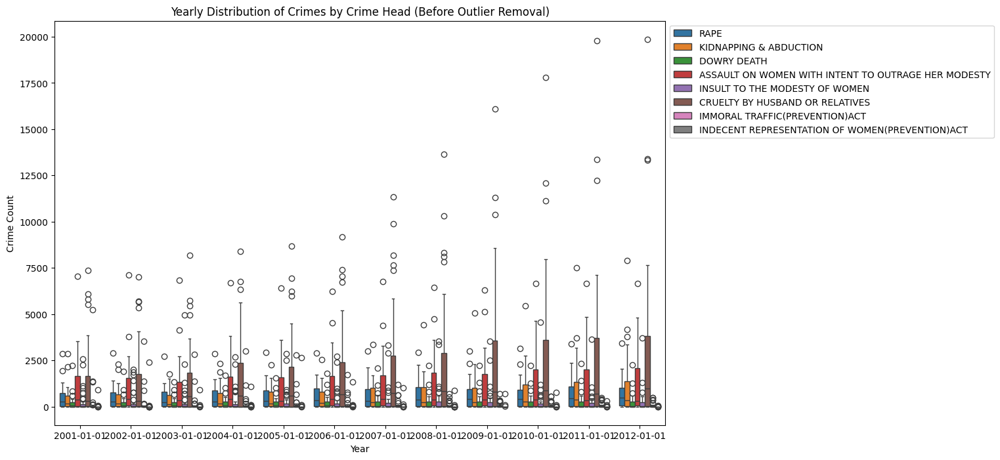

In [35]:
# Plotting the boxplot before outlier correction
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_years, x='Year', y='Crime Count', hue='CRIME HEAD')
plt.title('Yearly Distribution of Crimes by Crime Head (Before Outlier Removal)')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


In [36]:
# Calculate Q1 and Q3 for 'Crime Count' across the years
Q1 = df_years['Crime Count'].quantile(0.25)
Q3 = df_years['Crime Count'].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Detect outliers
outliers = (df_years['Crime Count'] < lower_bound) | (df_years['Crime Count'] > upper_bound)

# Print the number of outliers
print(f"Number of outliers: {outliers.sum()}")


Number of outliers: 422


In [37]:
# Capping the outliers
df_years_capped = df_years.copy()
df_years_capped['Crime Count'] = np.where(df_years_capped['Crime Count'] < lower_bound, lower_bound, df_years_capped['Crime Count'])
df_years_capped['Crime Count'] = np.where(df_years_capped['Crime Count'] > upper_bound, upper_bound, df_years_capped['Crime Count'])


In [38]:
# Removing the outliers
df_years_no_outliers = df_years[~outliers]


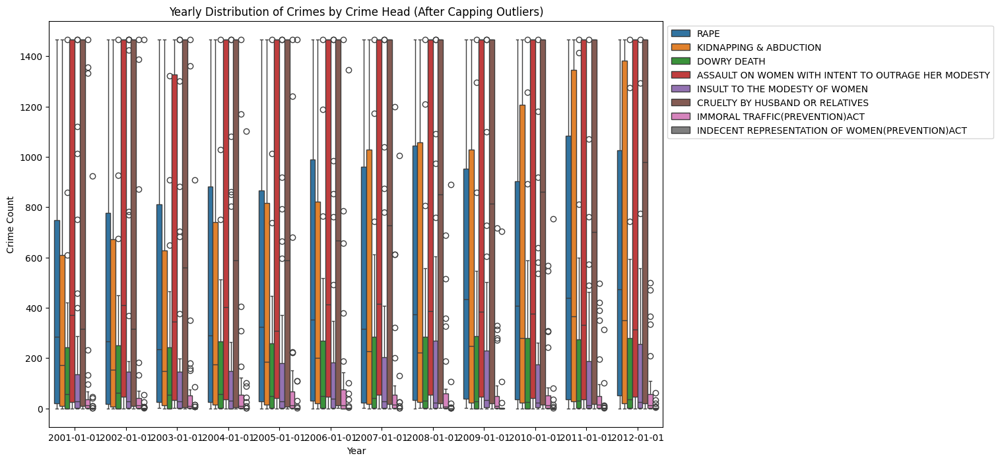

In [39]:
# Plotting the boxplot after capping outliers
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_years_capped, x='Year', y='Crime Count', hue='CRIME HEAD')
plt.title('Yearly Distribution of Crimes by Crime Head (After Capping Outliers)')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


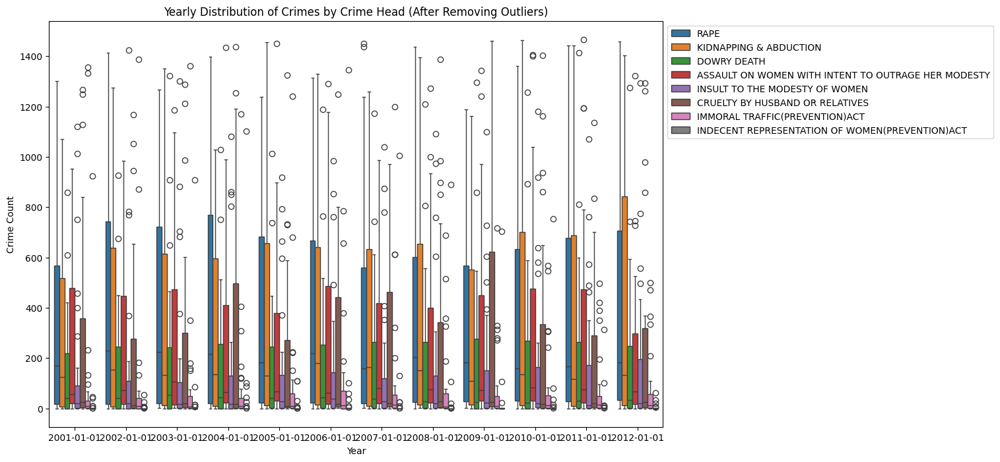

In [40]:
# Plotting the boxplot after removing outliers
plt.figure(figsize=(12, 8))
sns.boxplot(data=df_years_no_outliers, x='Year', y='Crime Count', hue='CRIME HEAD')
plt.title('Yearly Distribution of Crimes by Crime Head (After Removing Outliers)')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


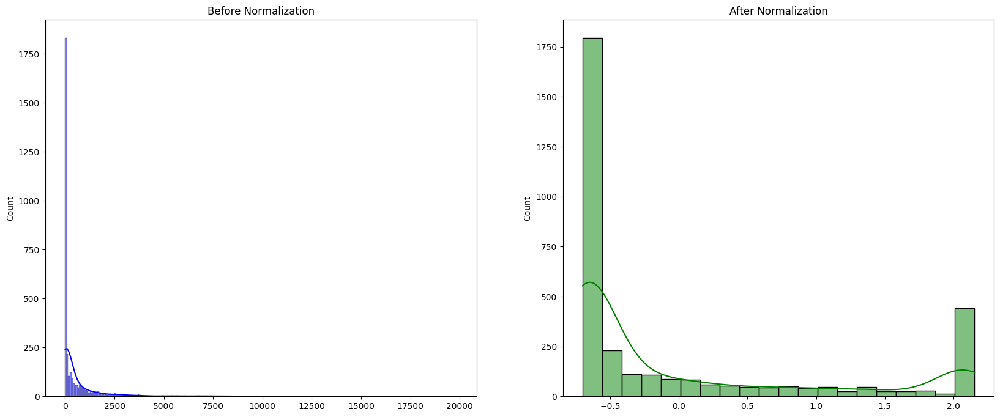

In [41]:
# Normalize data (Z-score)
crime_data_normalized = df_no_outliers.loc[:, '2001':'2012'].apply(
    lambda x: (x - x.mean()) / x.std(), axis=0)
# Compare distributions before and after normalization
plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
sns.histplot(df.loc[:, '2001':'2012'].values.flatten(), kde=True, color='blue')
plt.title('Before Normalization')

plt.subplot(1, 2, 2)
sns.histplot(crime_data_normalized.values.flatten(), kde=True, color='green')
plt.title('After Normalization')
plt.show()


# 6. Univariate Analysis

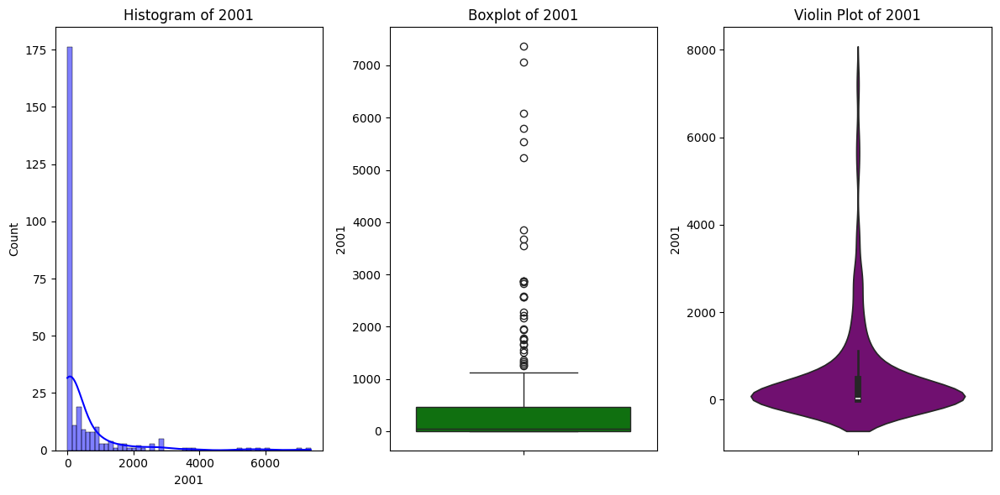

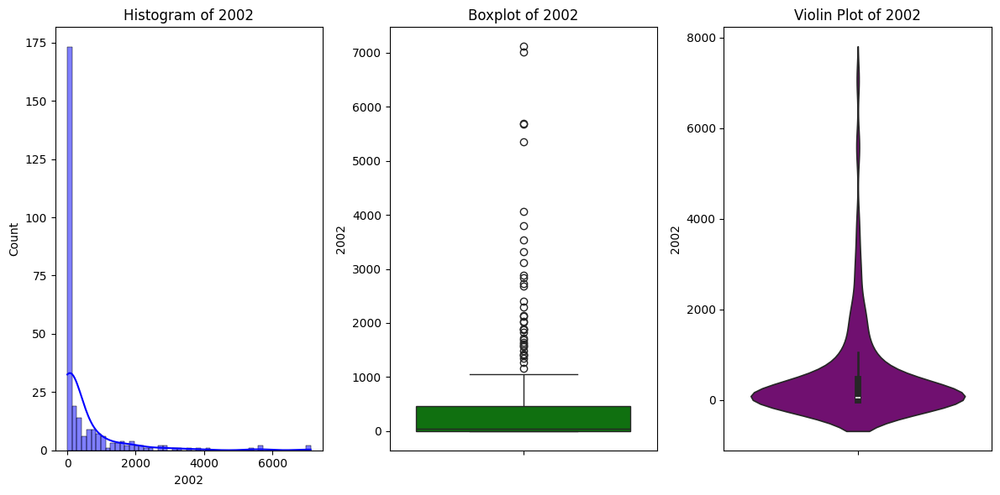

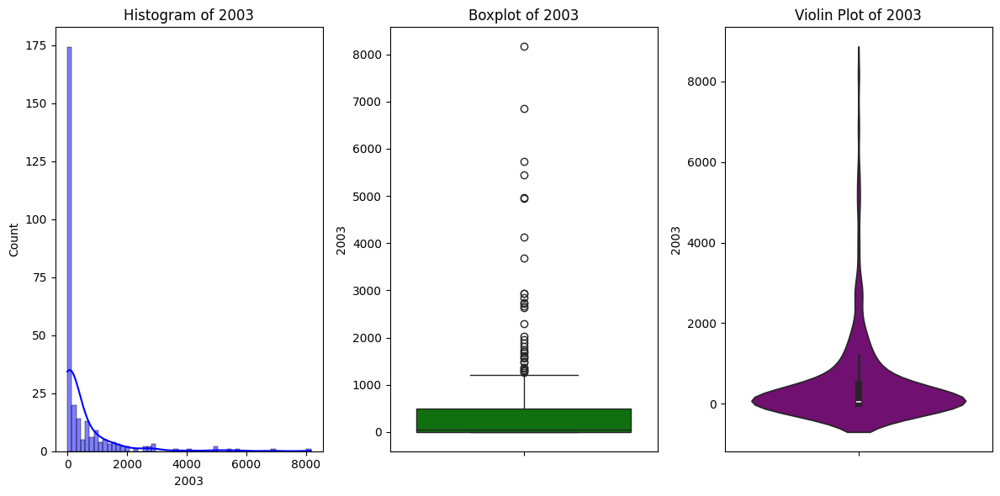

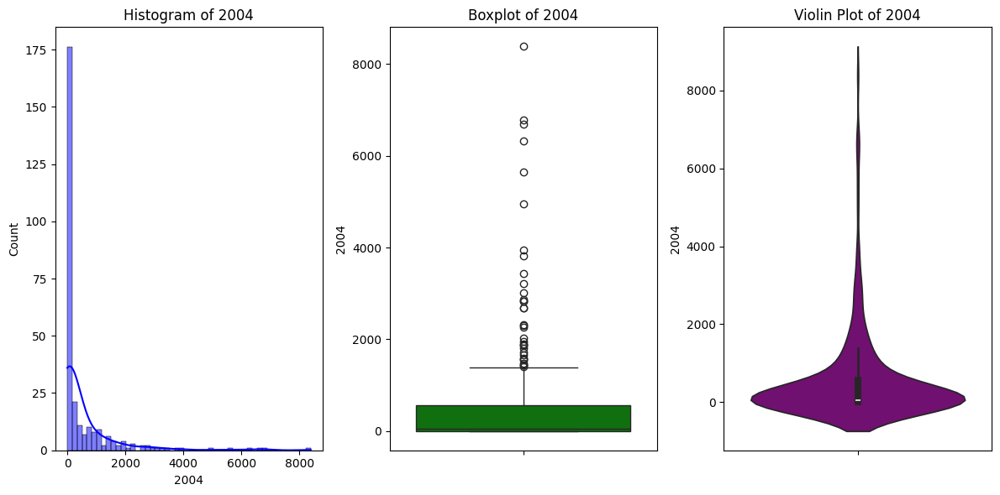

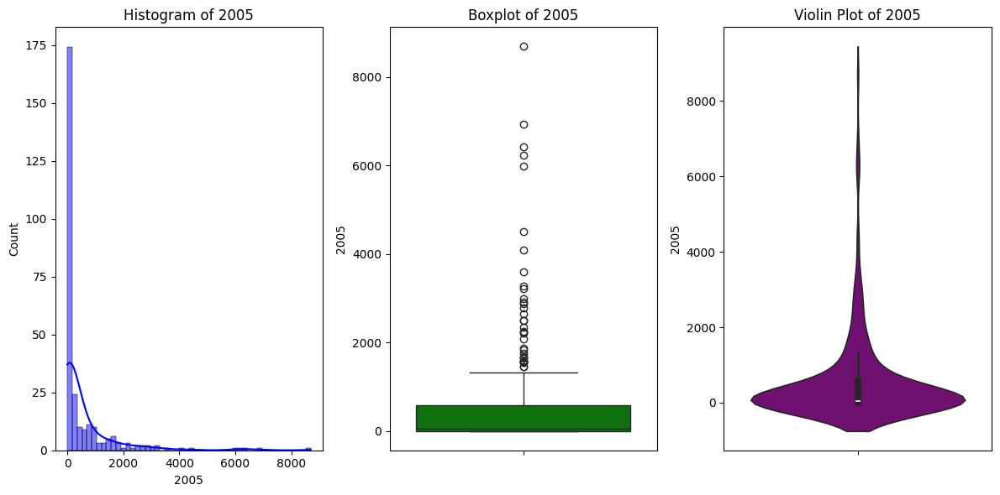

...

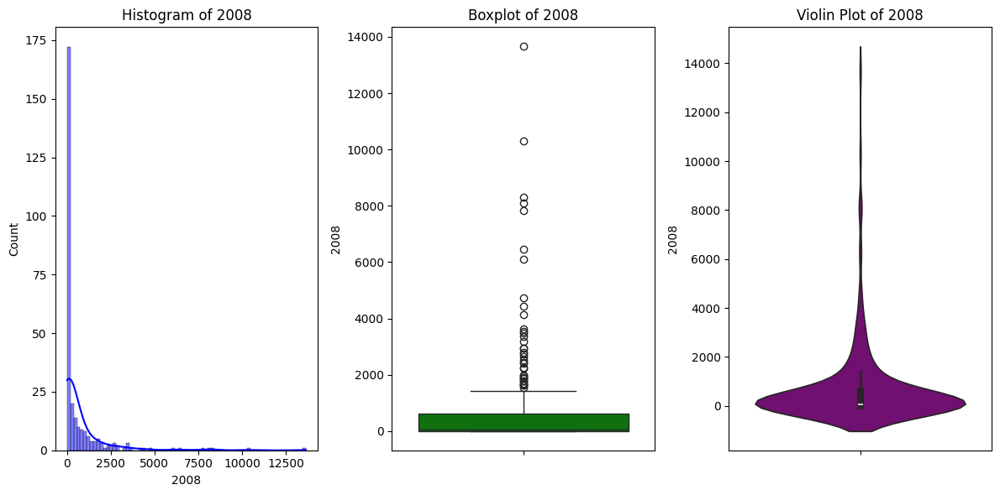

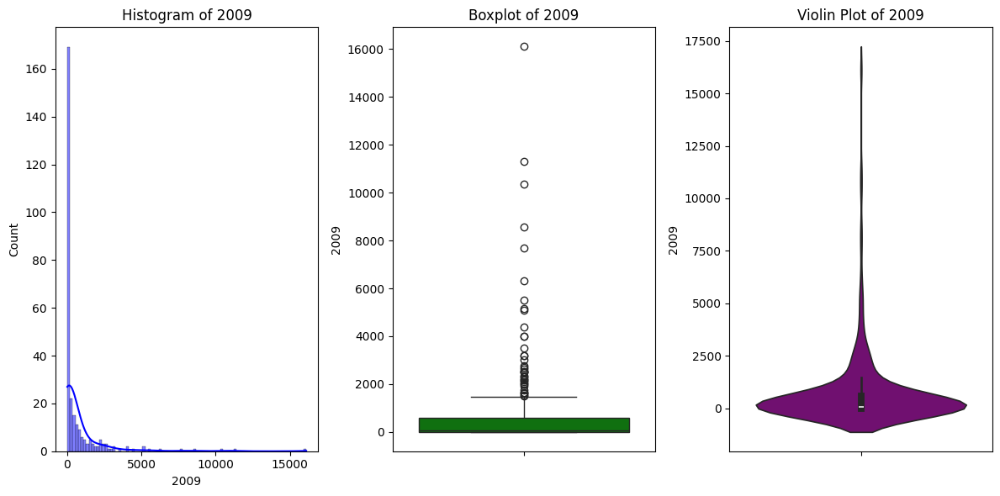

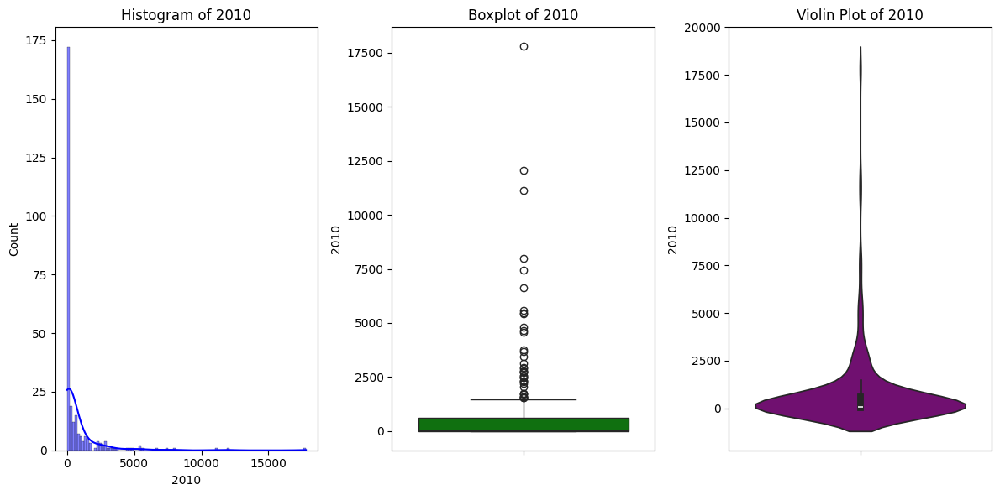

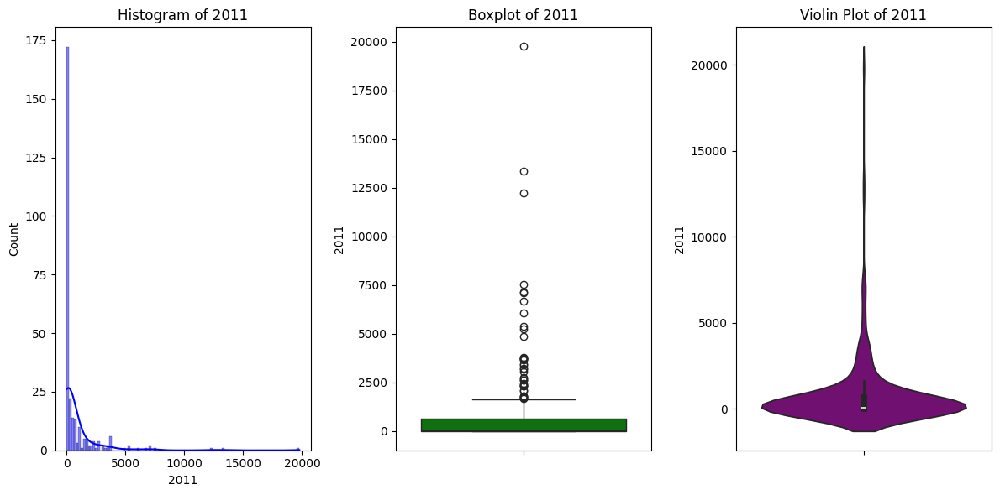

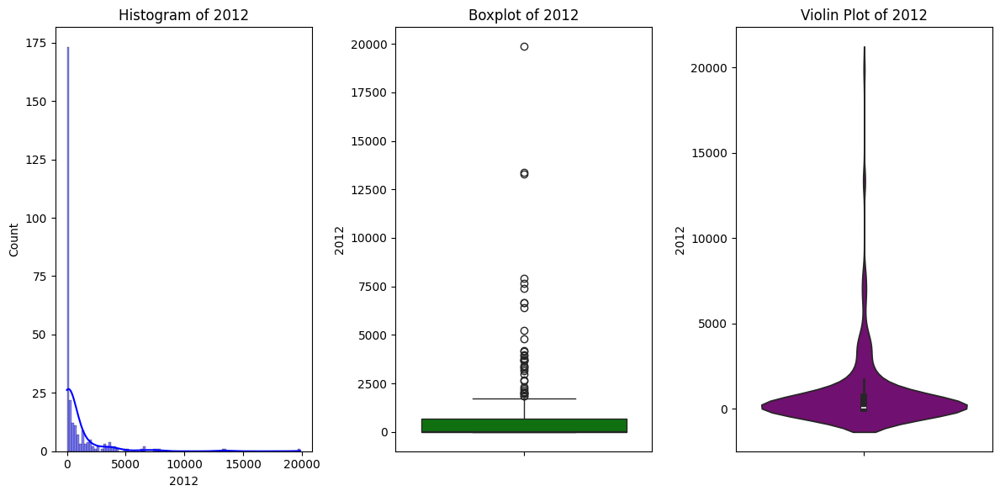

In [42]:
# Identify numerical year columns programmatically
year_columns = [col for col in df.columns if col.isdigit()]
numerical_cols = year_columns
for col in numerical_cols:
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[col], kde=True, color='blue')
    plt.title(f'Histogram of {col}')

    # Boxplot
    plt.subplot(1, 3, 2)
    sns.boxplot(y=df[col], color='green')
    plt.title(f'Boxplot of {col}')

    # Violin Plot
    plt.subplot(1, 3, 3)
    sns.violinplot(y=df[col], color='purple')
    plt.title(f'Violin Plot of {col}')

    plt.tight_layout()
    plt.show()


<ipython-input-43-2314d31761e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette='viridis')


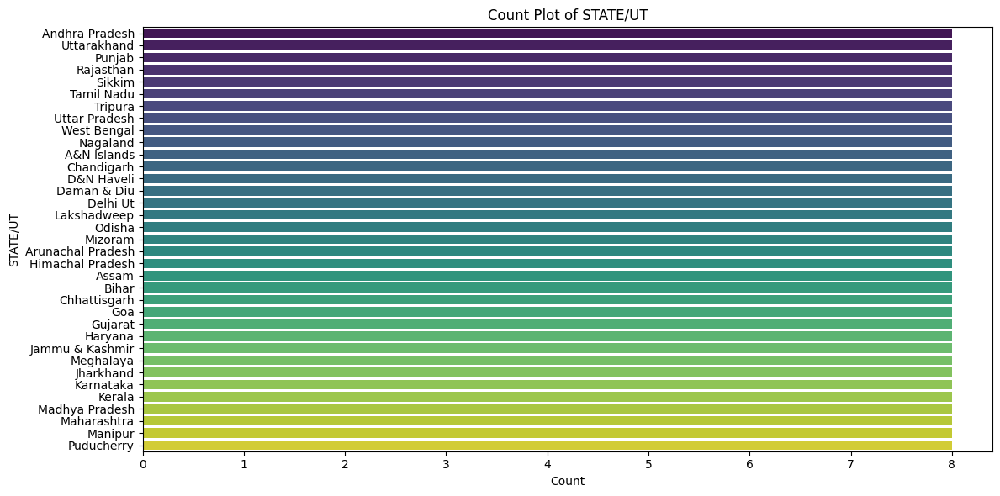

<ipython-input-43-2314d31761e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette='viridis')


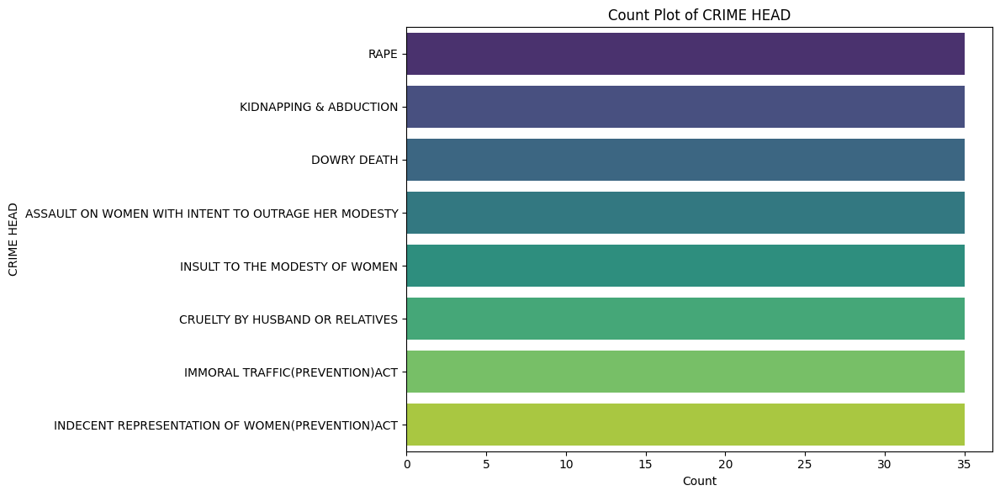

In [43]:
categorical_cols = ['STATE/UT', 'CRIME HEAD']
for col in categorical_cols:
    plt.figure(figsize=(12, 6))
    sns.countplot(y=col, data=df, order=df[col].value_counts().index, palette='viridis')
    plt.title(f'Count Plot of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()


In [44]:
# Distribution analysis by year/state/crime head
# Pivoting the data for heatmap analysis
df_melted = df.melt(id_vars=['STATE/UT', 'CRIME HEAD'], value_vars=year_columns,
                    var_name='Year', value_name='Crime Count')
pivot_state_year = df_melted.pivot_table(index='STATE/UT', columns='Year', values='Crime Count', aggfunc='sum')

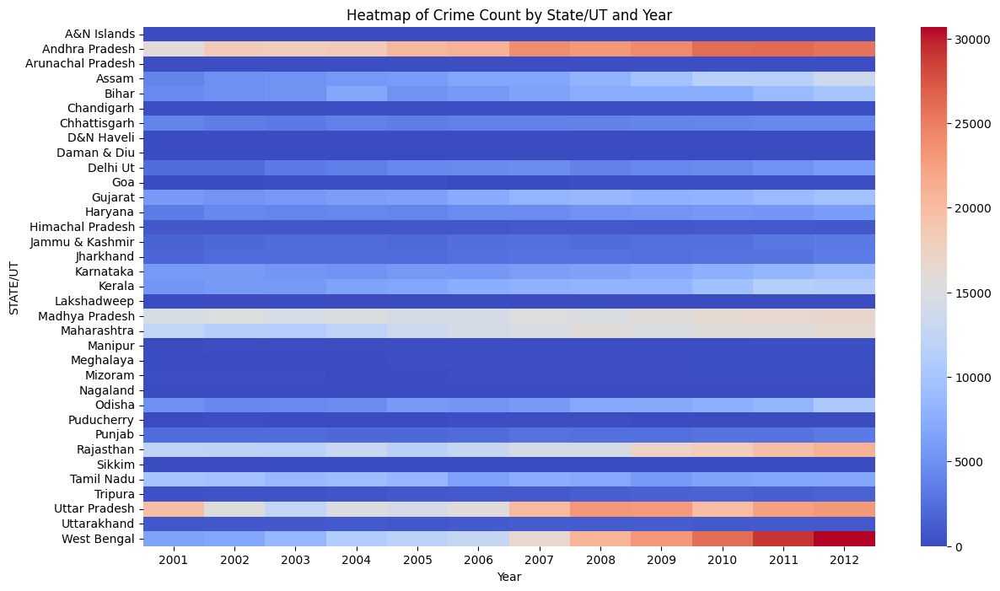

In [45]:

# Heatmap for Crime Count by State/UT and Year
plt.figure(figsize=(14, 8))
sns.heatmap(pivot_state_year, cmap='coolwarm', annot=False, cbar=True)
plt.title('Heatmap of Crime Count by State/UT and Year')
plt.show()

<ipython-input-46-7006eca9e8d5>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y='CRIME HEAD', x='Crime Count', data=crime_count_by_head, palette='viridis')


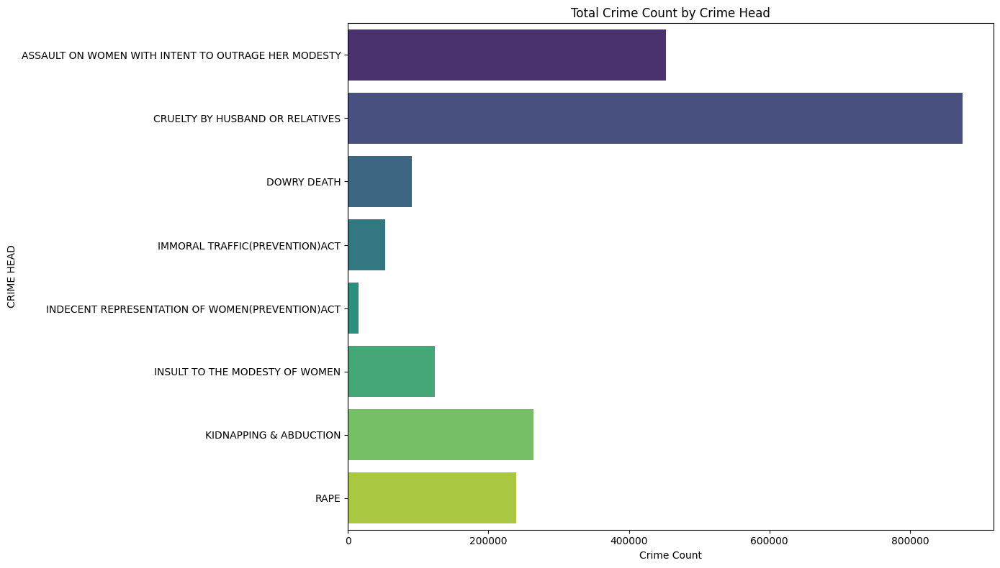

In [46]:

# Barplot for Crime Count by Crime Head
crime_count_by_head = df_melted.groupby('CRIME HEAD')['Crime Count'].sum().reset_index()
plt.figure(figsize=(14, 8))
sns.barplot(y='CRIME HEAD', x='Crime Count', data=crime_count_by_head, palette='viridis')
plt.title('Total Crime Count by Crime Head')
plt.tight_layout()
plt.show()


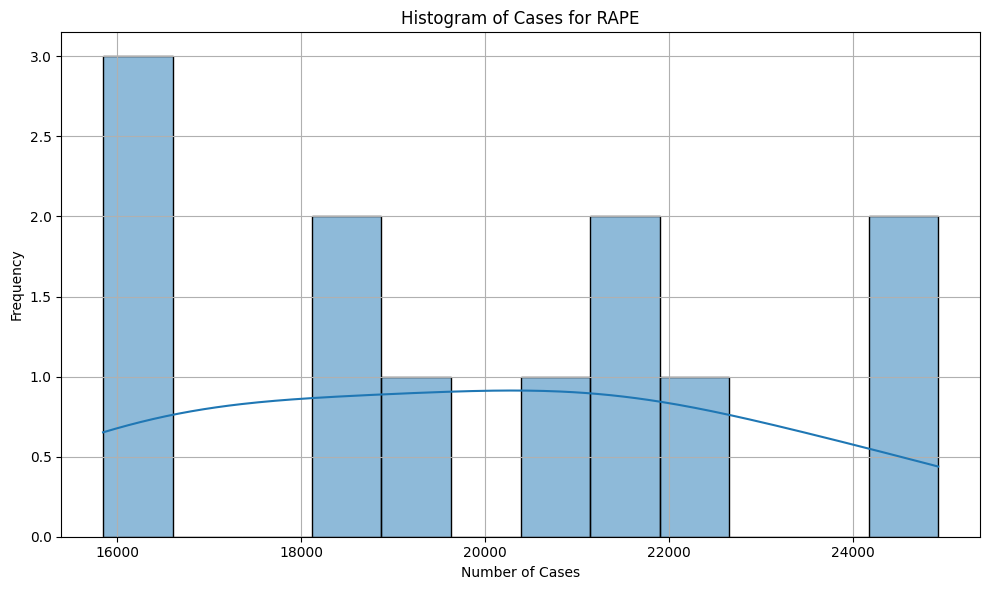

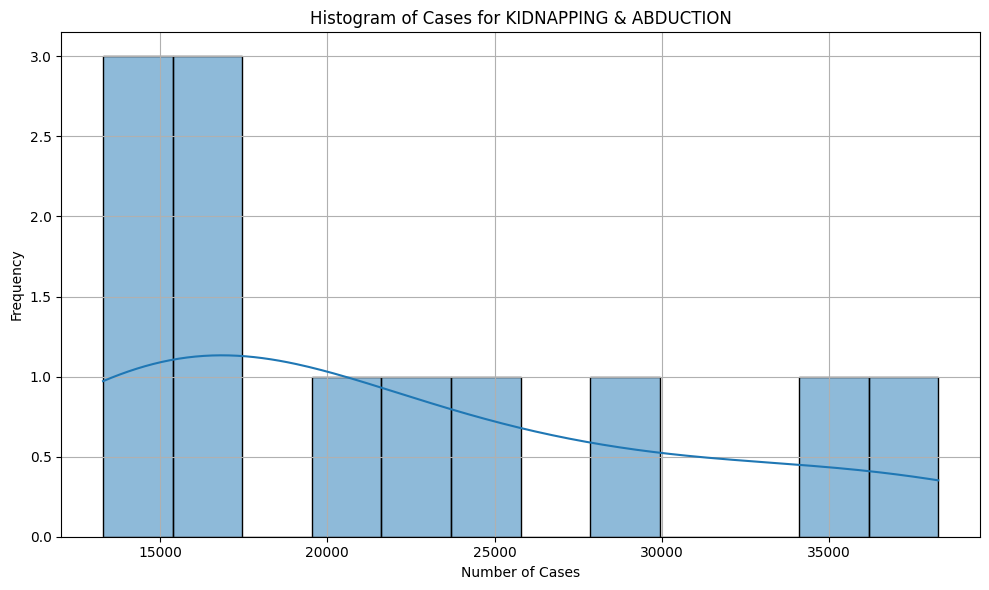

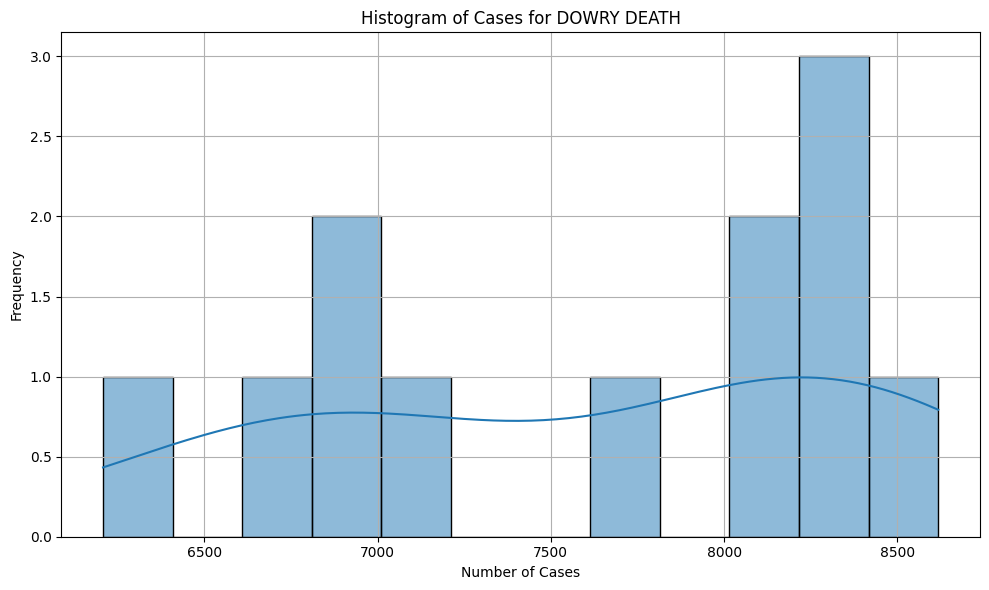

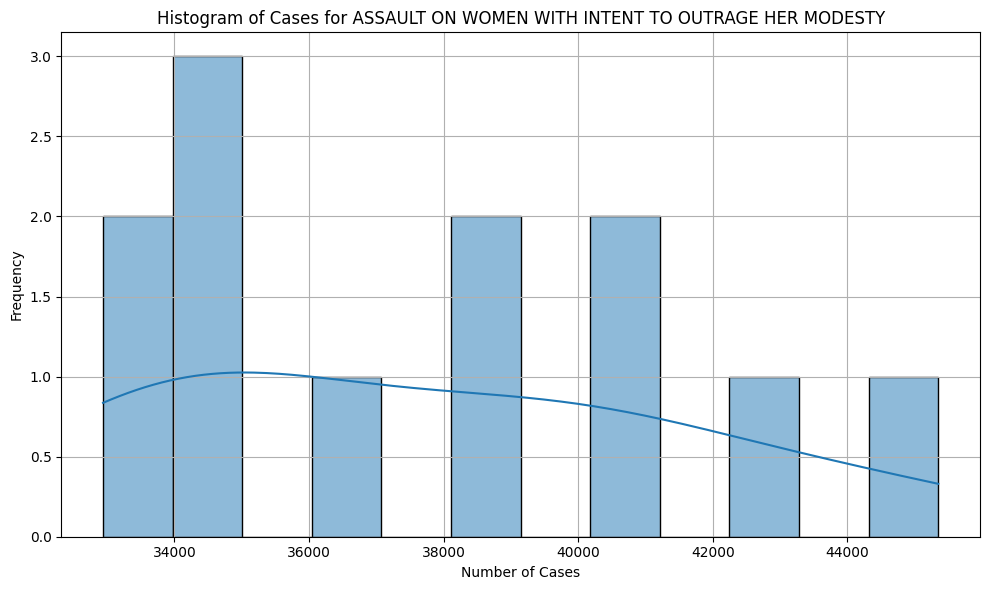

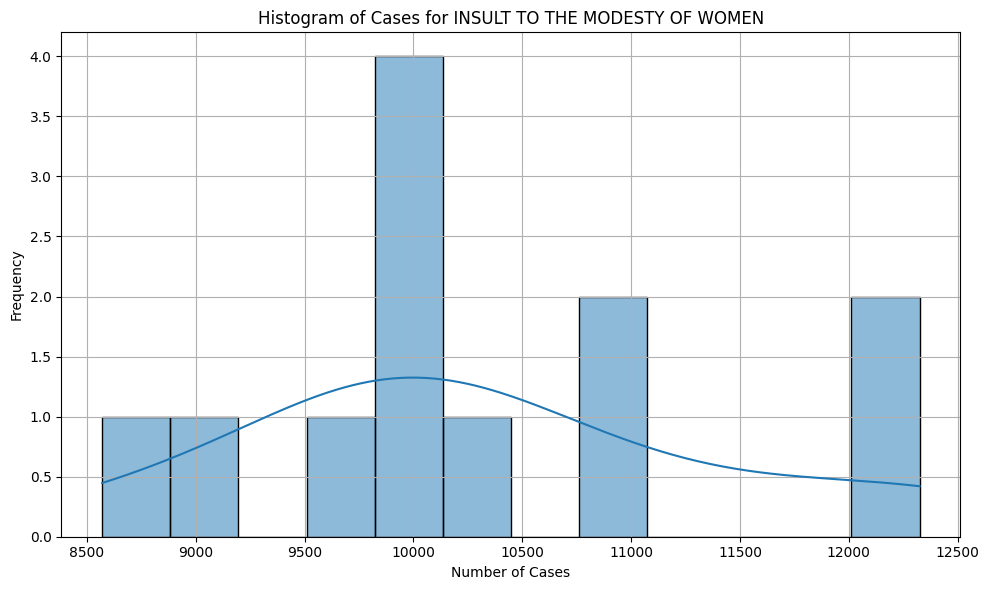

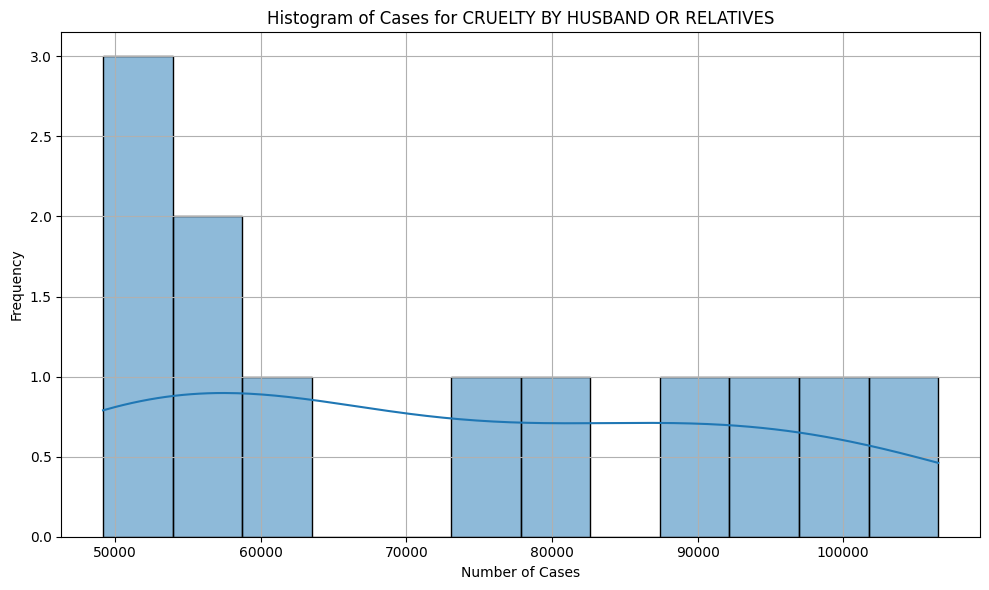

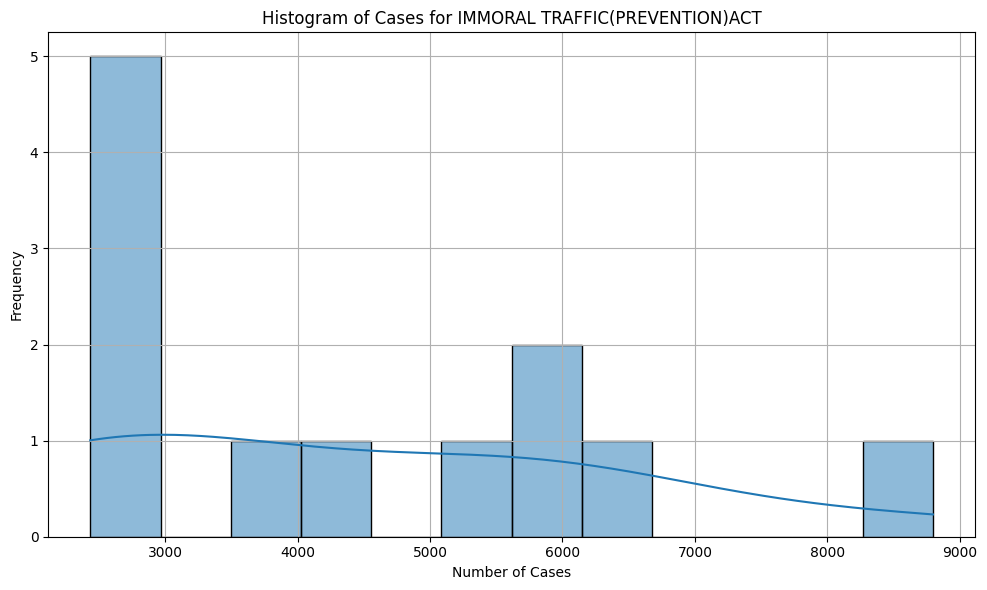

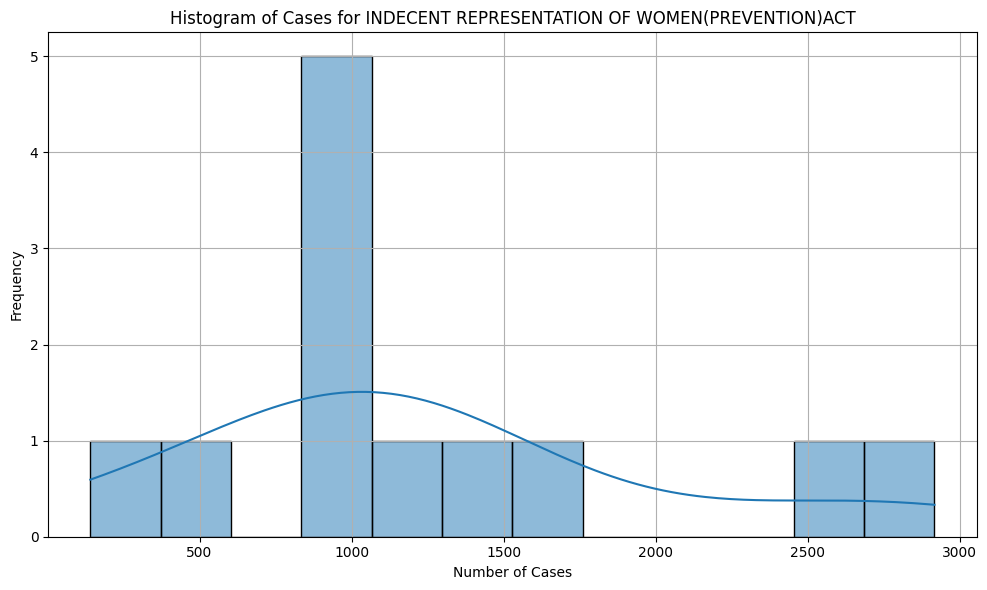

In [47]:
# Draw histograms for each crime head
crime_heads = df['CRIME HEAD'].unique()
years = [str(year) for year in range(2001, 2013)]

for crime_head in crime_heads:
    # Filter data for the current crime head
    crime_data = df[df['CRIME HEAD'] == crime_head][years].sum()

    # Create a histogram
    plt.figure(figsize=(10, 6))
    sns.histplot(crime_data, bins=12, kde=True)
    plt.title(f"Histogram of Cases for {crime_head}")
    plt.xlabel("Number of Cases")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


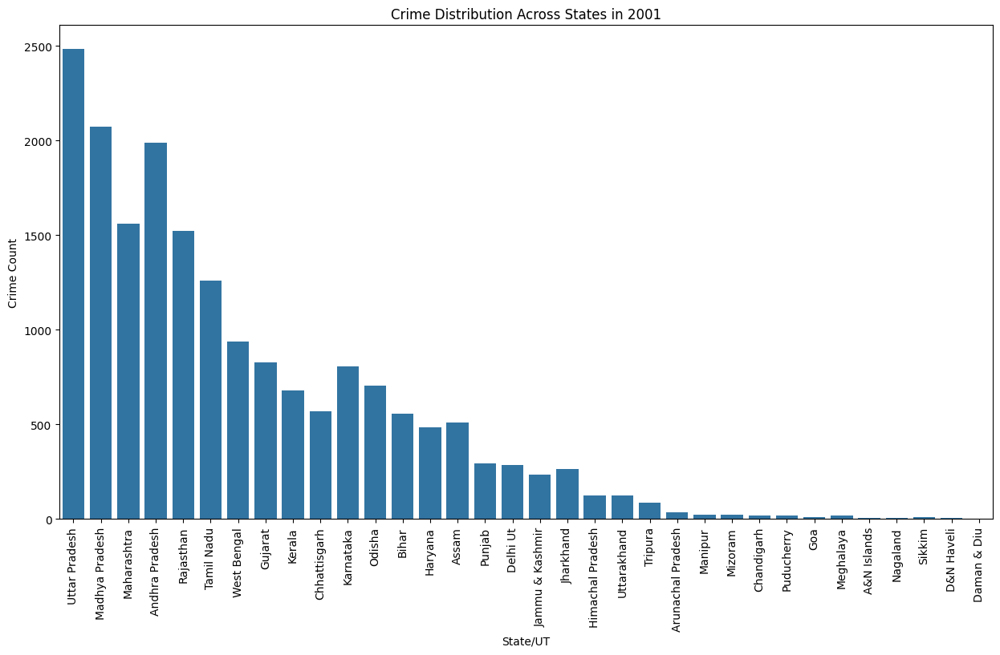

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


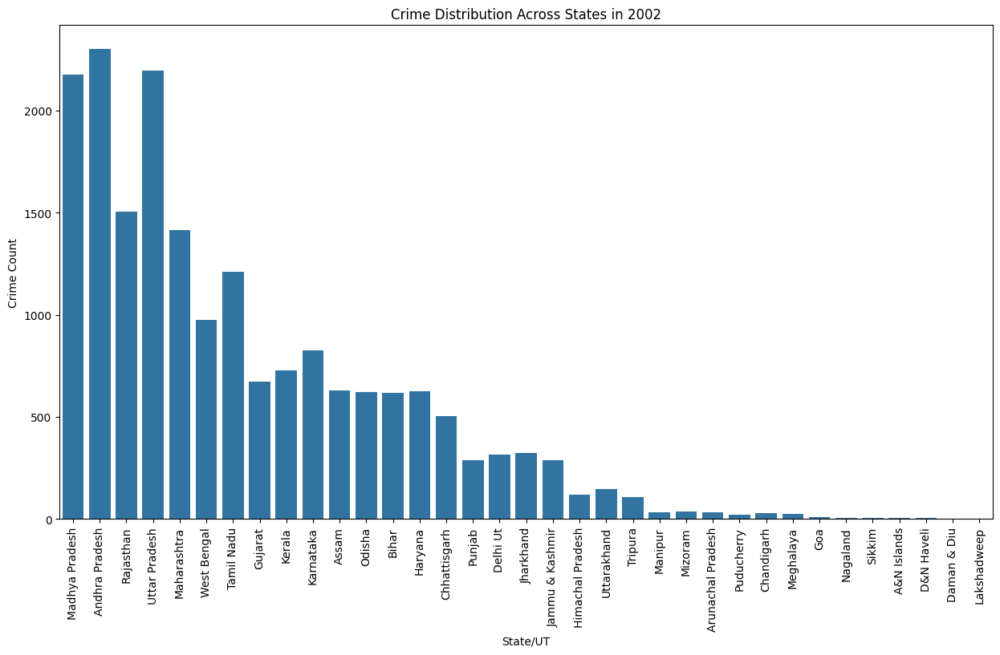

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


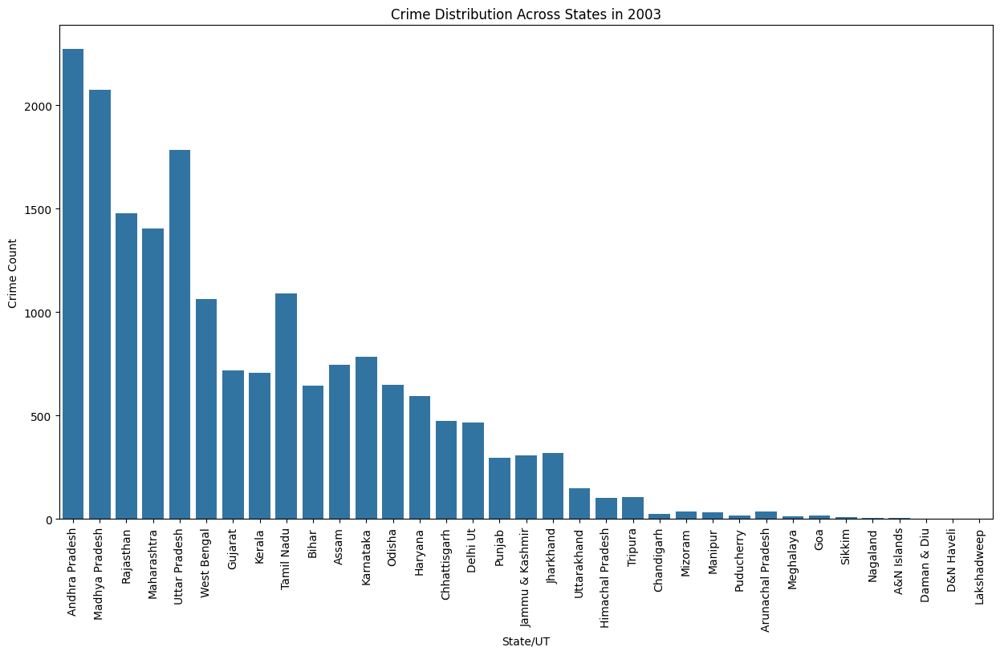

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


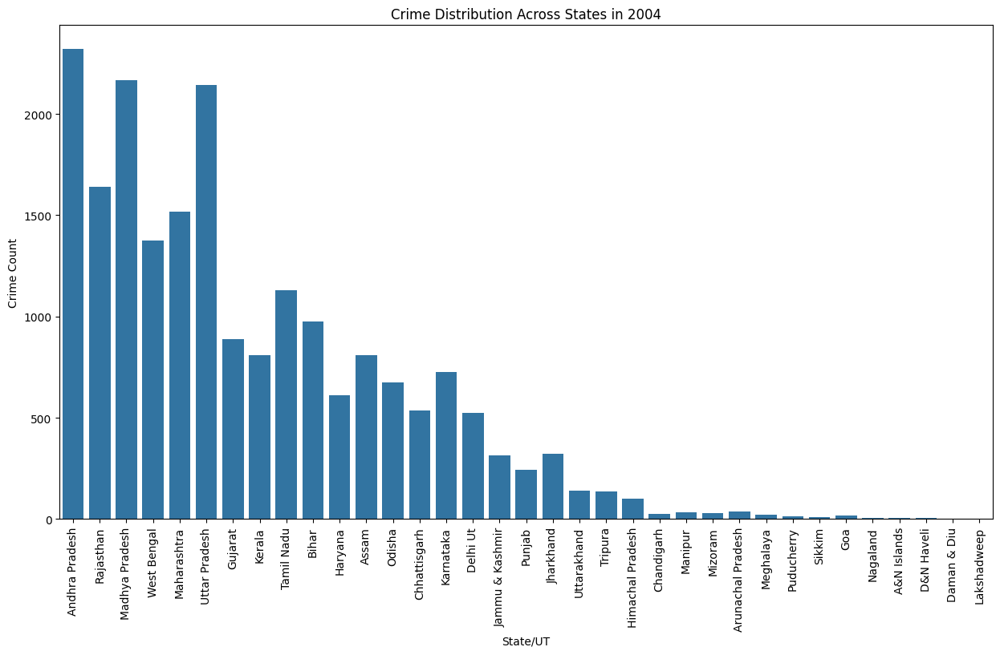

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


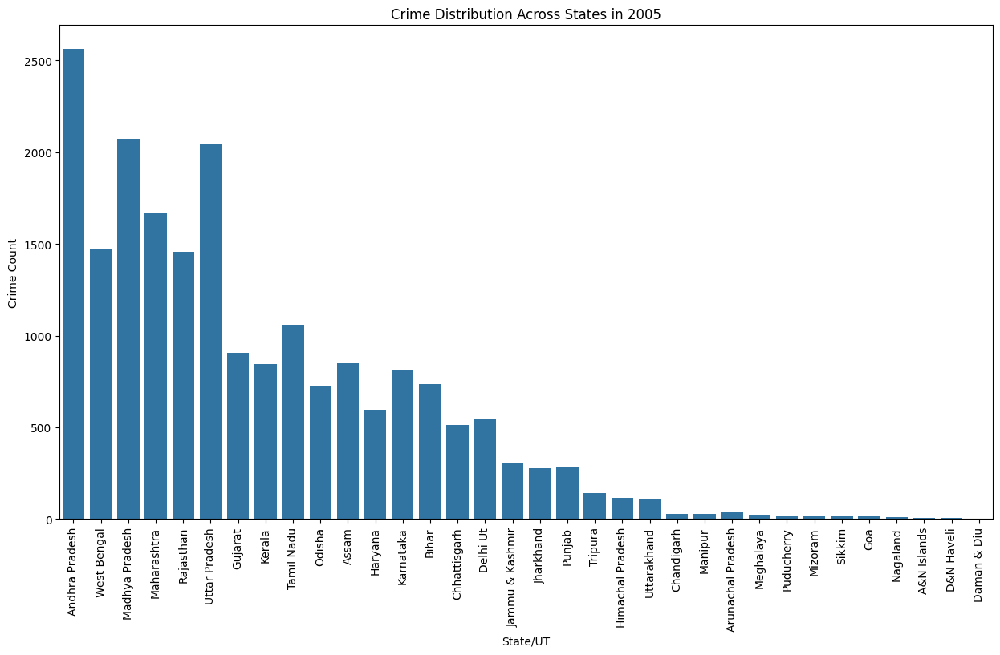

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


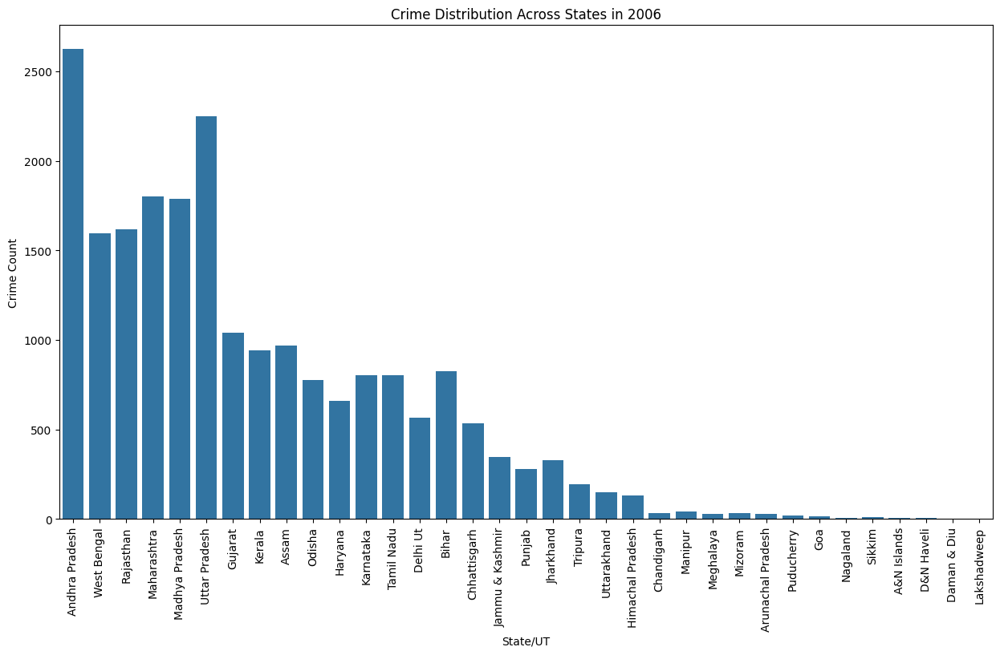

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


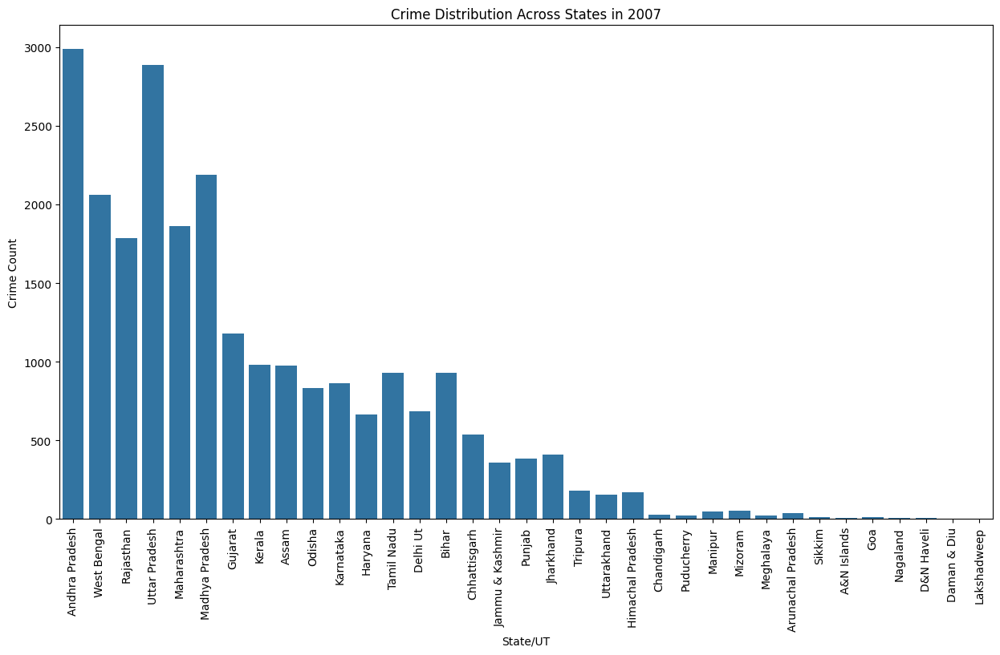

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


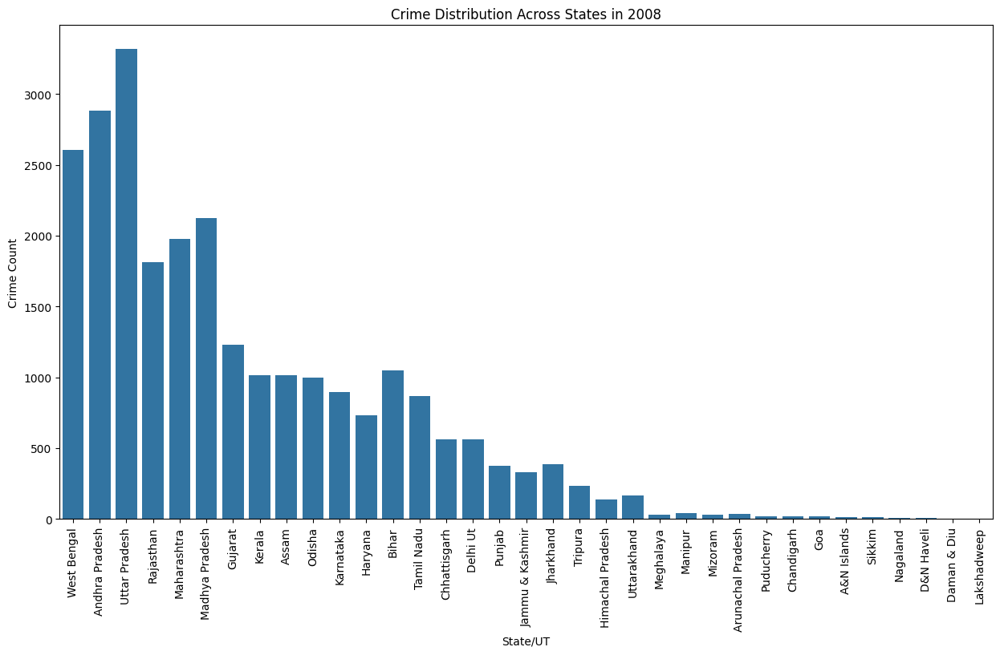

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


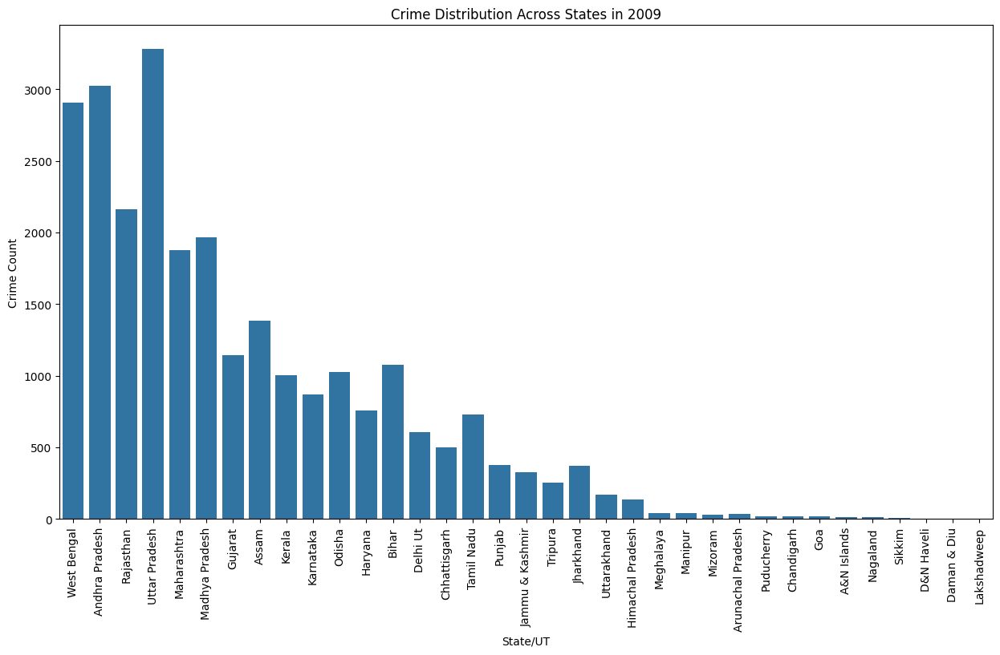

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


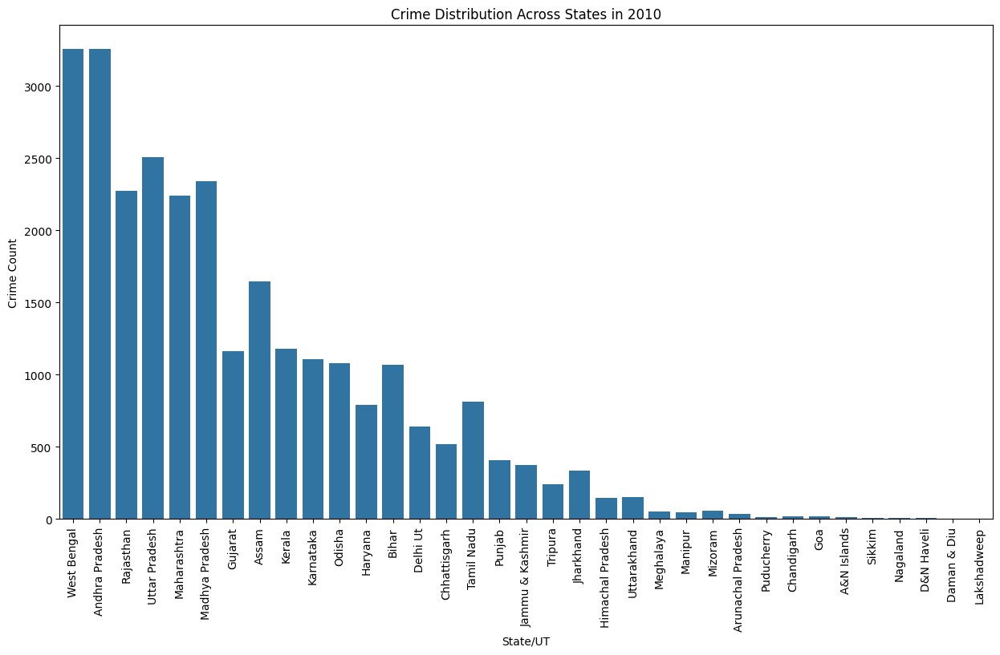

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


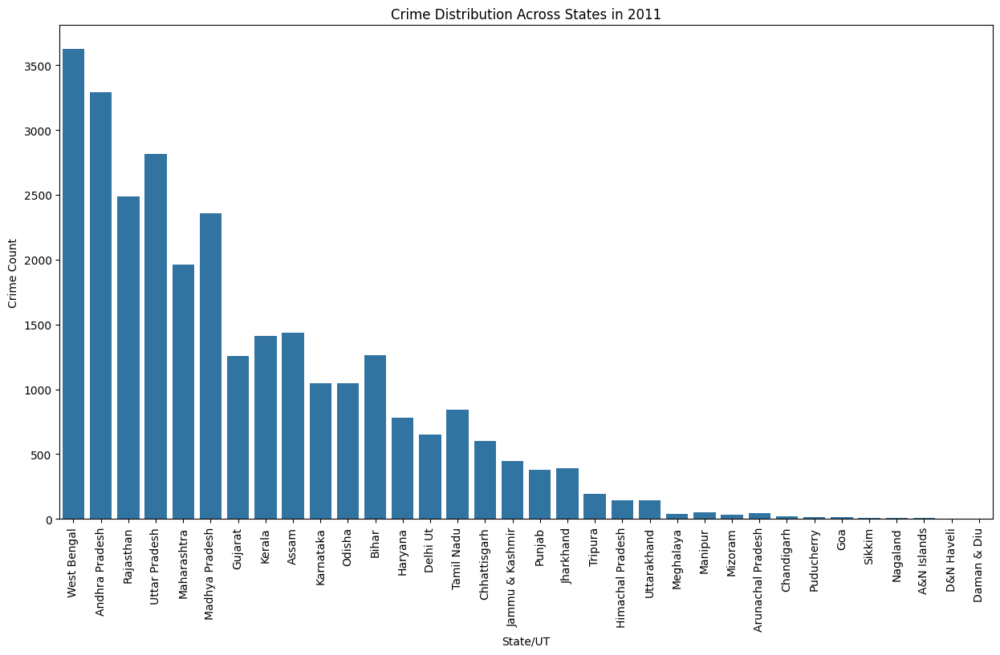

<ipython-input-48-885e36cfc17d>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)


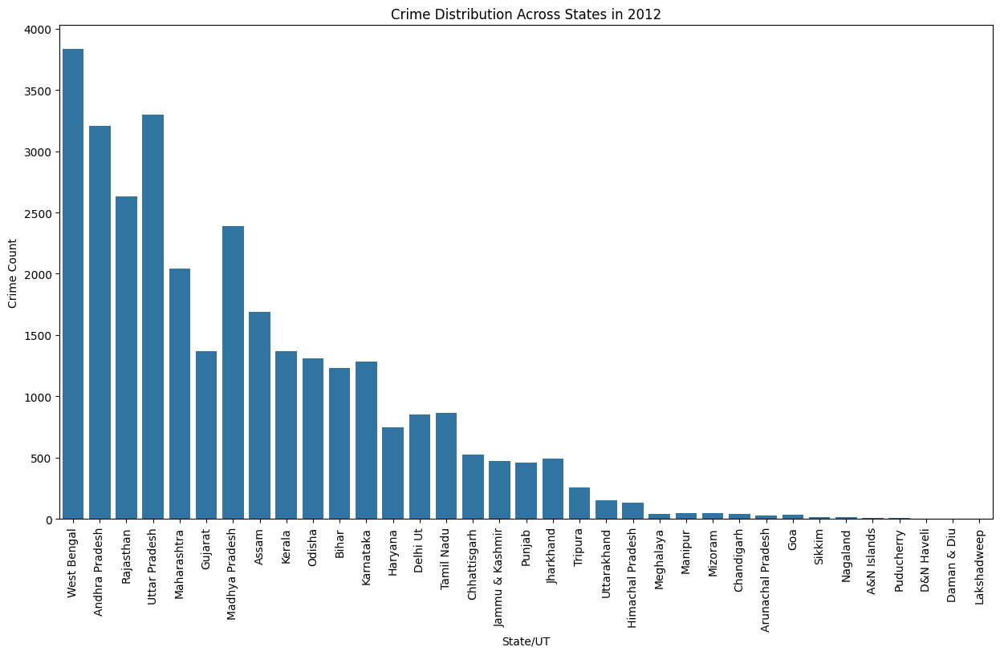

In [48]:
# Crime distribution across states for each year (barplot)
for year in years:
    plt.figure(figsize=(15, 8))
    yearly_data = df[df[year] > 0].sort_values(by=year, ascending=False)
    sns.barplot(x='STATE/UT', y=year, data=yearly_data, ci=None)
    plt.title(f'Crime Distribution Across States in {year}')
    plt.xticks(rotation=90)
    plt.xlabel('State/UT')
    plt.ylabel('Crime Count')
    plt.show()

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


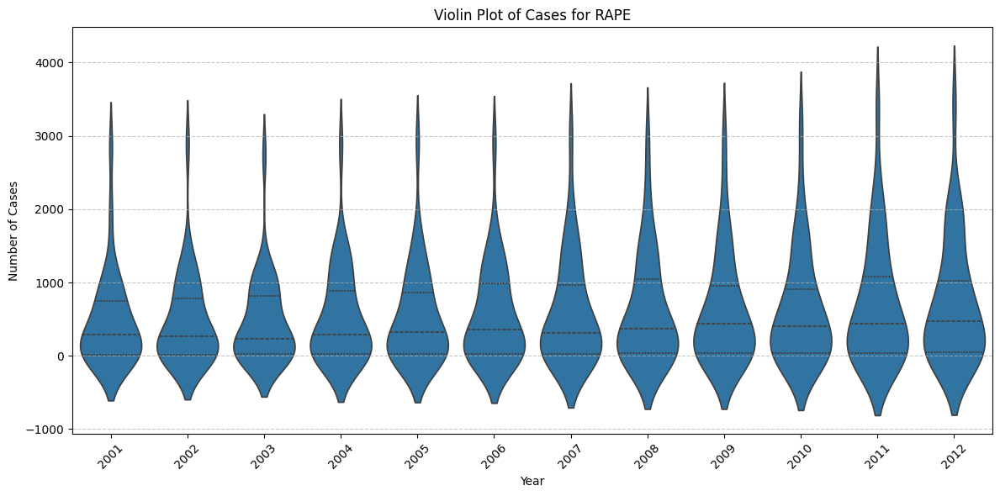

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


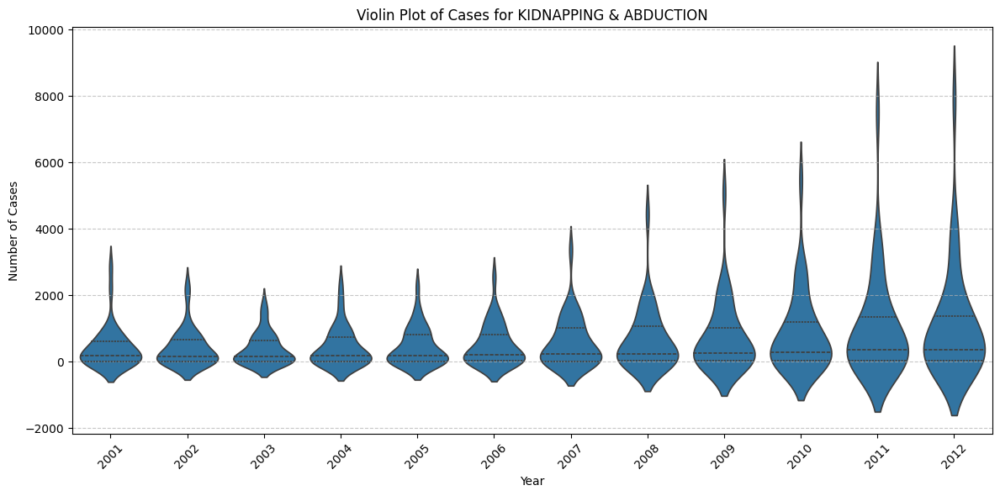

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


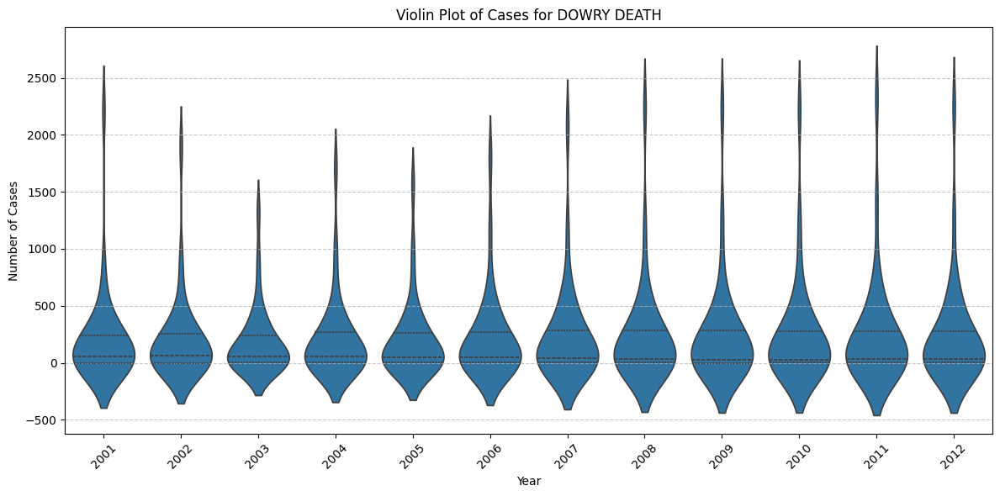

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


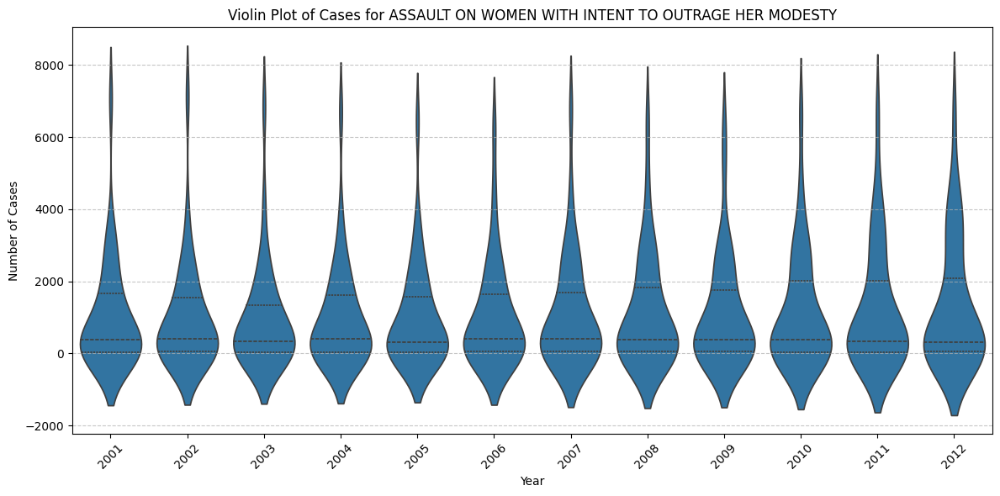

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


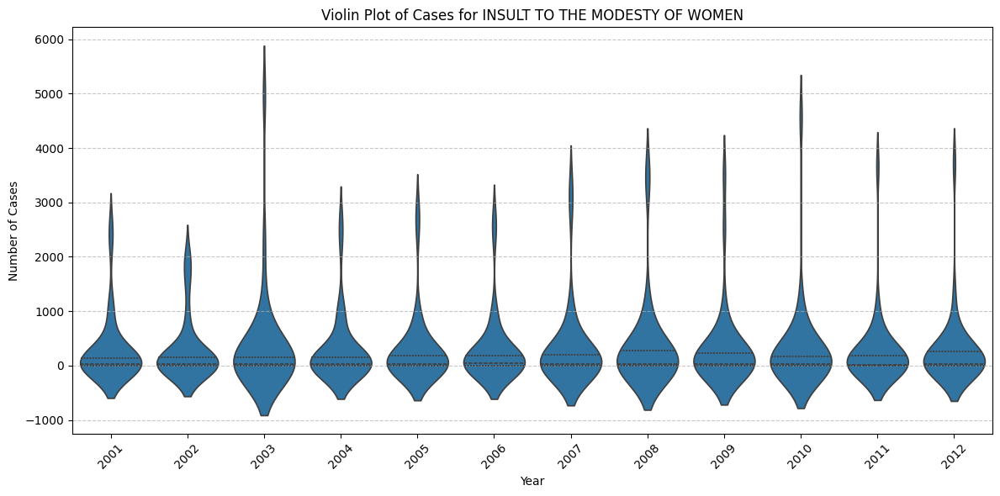

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


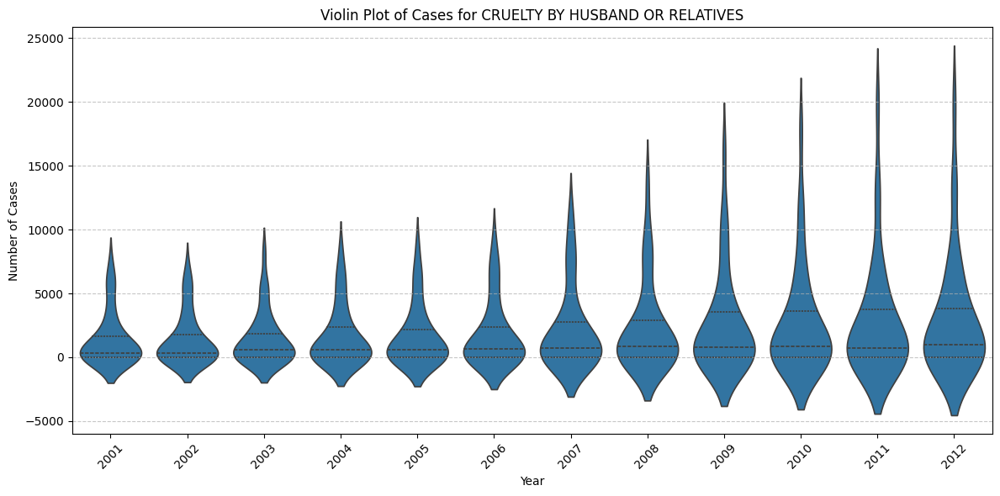

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


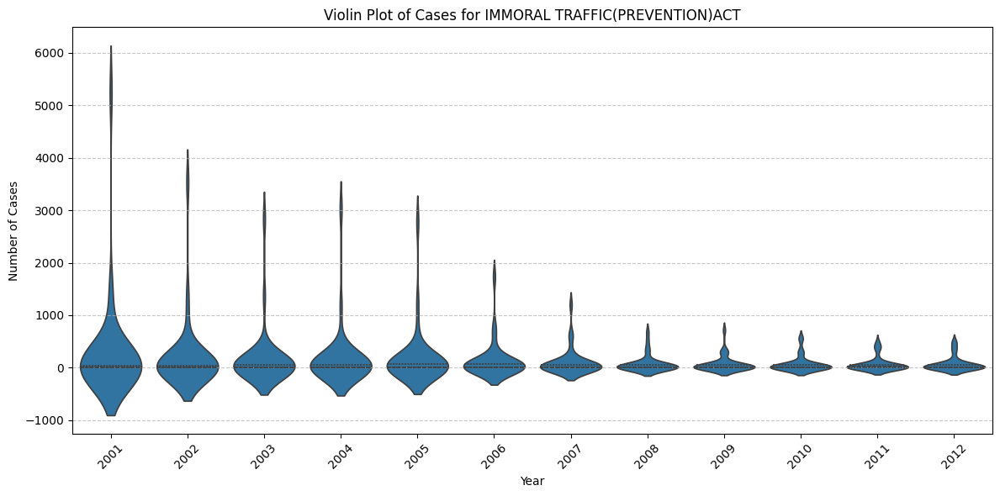

<ipython-input-49-fae402f6c83b>:14: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')


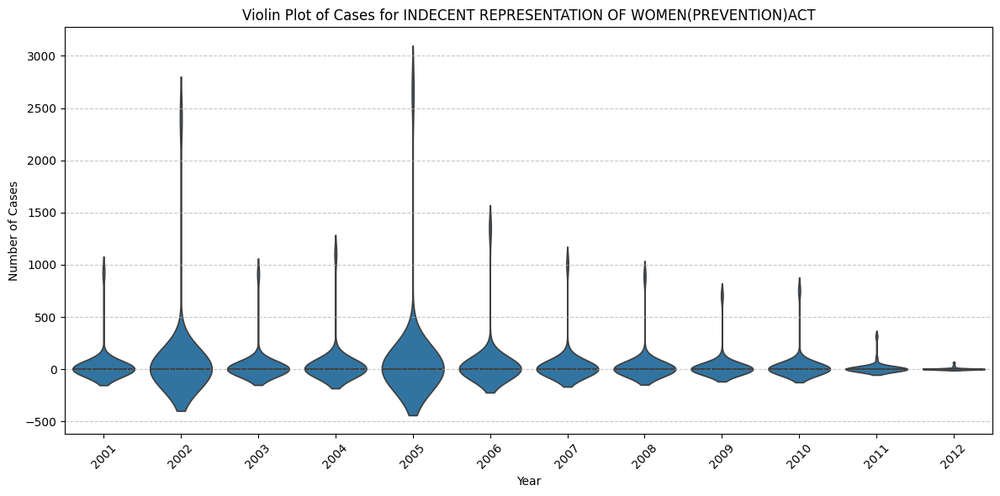

In [49]:
# Melt the dataframe to prepare for Seaborn's violin plot
melted_df = df.melt(id_vars=['STATE/UT', 'CRIME HEAD'],
                    value_vars=[str(year) for year in range(2001, 2013)],
                    var_name='Year',
                    value_name='Cases')

# Draw violin plots for each crime head
for crime_head in crime_heads:
    # Filter data for the current crime head
    crime_data = melted_df[melted_df['CRIME HEAD'] == crime_head]

    # Create a violin plot
    plt.figure(figsize=(12, 6))
    sns.violinplot(data=crime_data, x='Year', y='Cases', scale='width', inner='quartile')
    plt.title(f"Violin Plot of Cases for {crime_head}")
    plt.xlabel("Year")
    plt.ylabel("Number of Cases")
    plt.xticks(rotation=45)
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


# 7. Bivariate Analysis

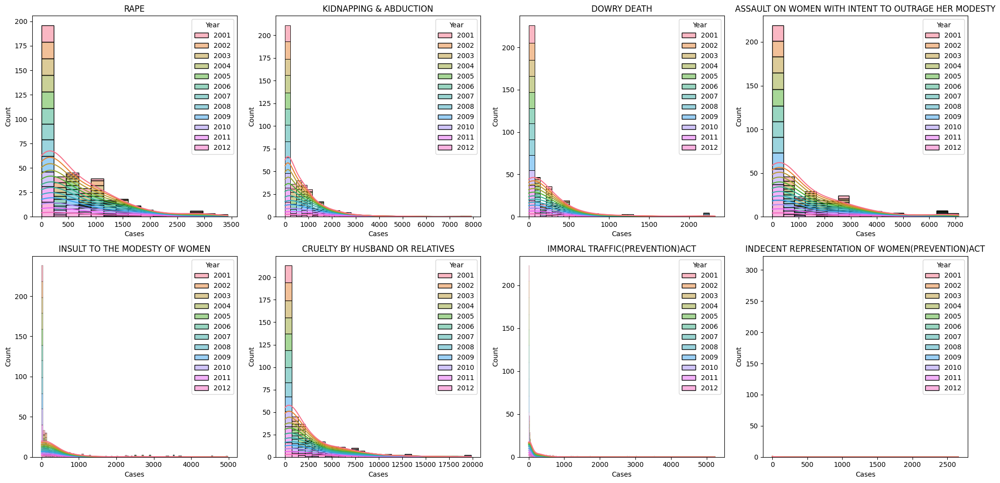

In [50]:
# Ensure year columns are numeric
year_columns = df.columns[2:]  # Assuming year data starts from the 3rd column onward
df[year_columns] = df[year_columns].apply(pd.to_numeric, errors='coerce')

# Determine the number of rows and columns for subplots
crime_heads = df['CRIME HEAD'].unique()
num_rows = (len(crime_heads) + 3) // 4  # 4 subplots per row
num_cols = 4

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))

# Iterate through crime heads and create plots
for i, crime_head in enumerate(crime_heads):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    # Filter data for the current crime head and aggregate year-wise data
    crime_data = df[df['CRIME HEAD'] == crime_head]

    # Melt data for visualization
    melted_data = crime_data.melt(id_vars=['STATE/UT', 'CRIME HEAD'],
                                  value_vars=year_columns,
                                  var_name='Year',
                                  value_name='Cases')

    # Plot the distribution
    sns.histplot(data=melted_data, x='Cases', kde=True, hue='Year', multiple="stack", ax=ax)
    ax.set_ylabel('Count')
    ax.set_title(crime_head)

# Remove unused subplots
for i in range(len(crime_heads), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

# Adjust layout for better readability
plt.tight_layout()
plt.show()

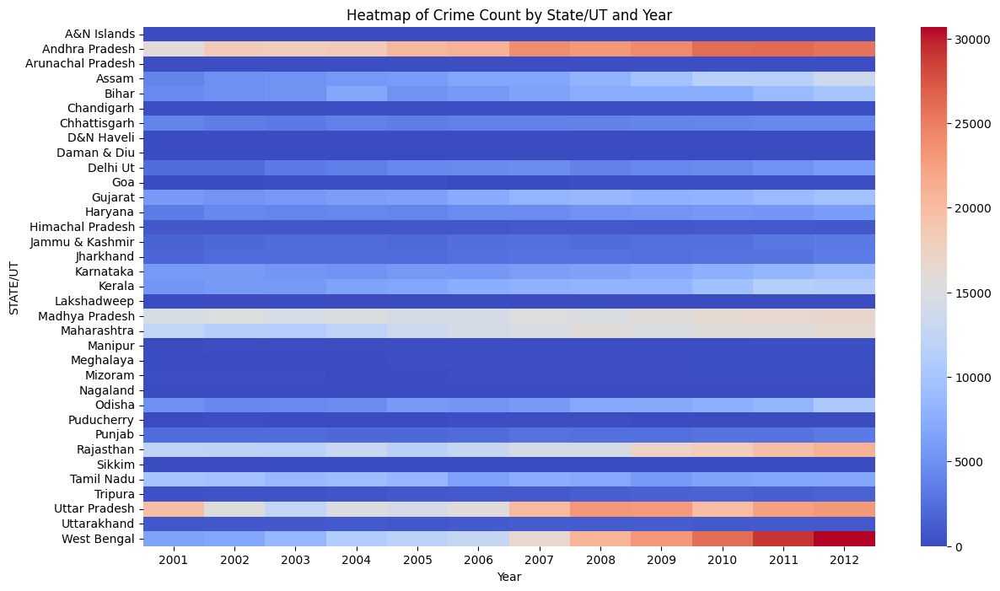

In [51]:
df_melted = df.melt(id_vars=['STATE/UT', 'CRIME HEAD'], value_vars=year_columns,
                    var_name='Year', value_name='Crime Count')

pivot_state_year = df_melted.pivot_table(index='STATE/UT', columns='Year', values='Crime Count', aggfunc='sum')
plt.figure(figsize=(14, 8))
sns.heatmap(pivot_state_year, cmap='coolwarm', annot=False, cbar=True)
plt.title('Heatmap of Crime Count by State/UT and Year')
plt.show()


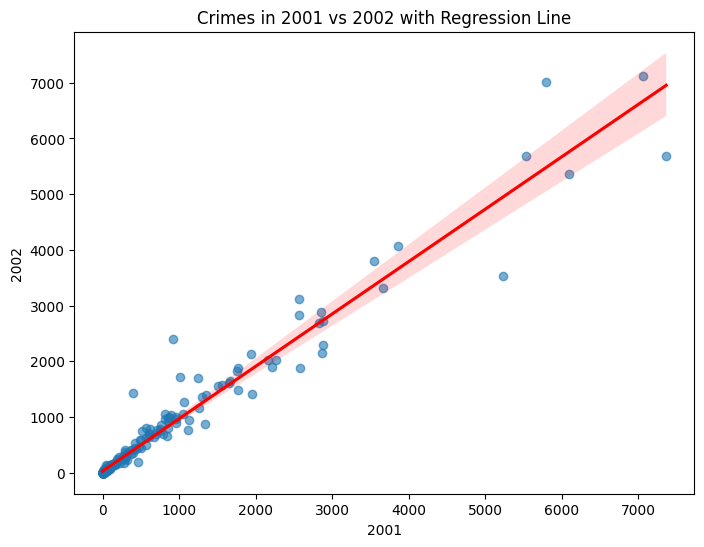

In [52]:
plt.figure(figsize=(8, 6))
sns.regplot(data=df, x='2001', y='2002', scatter_kws={'alpha': 0.6}, line_kws={'color': 'red'})
plt.title('Crimes in 2001 vs 2002 with Regression Line')
plt.xlabel('2001')
plt.ylabel('2002')
plt.show()


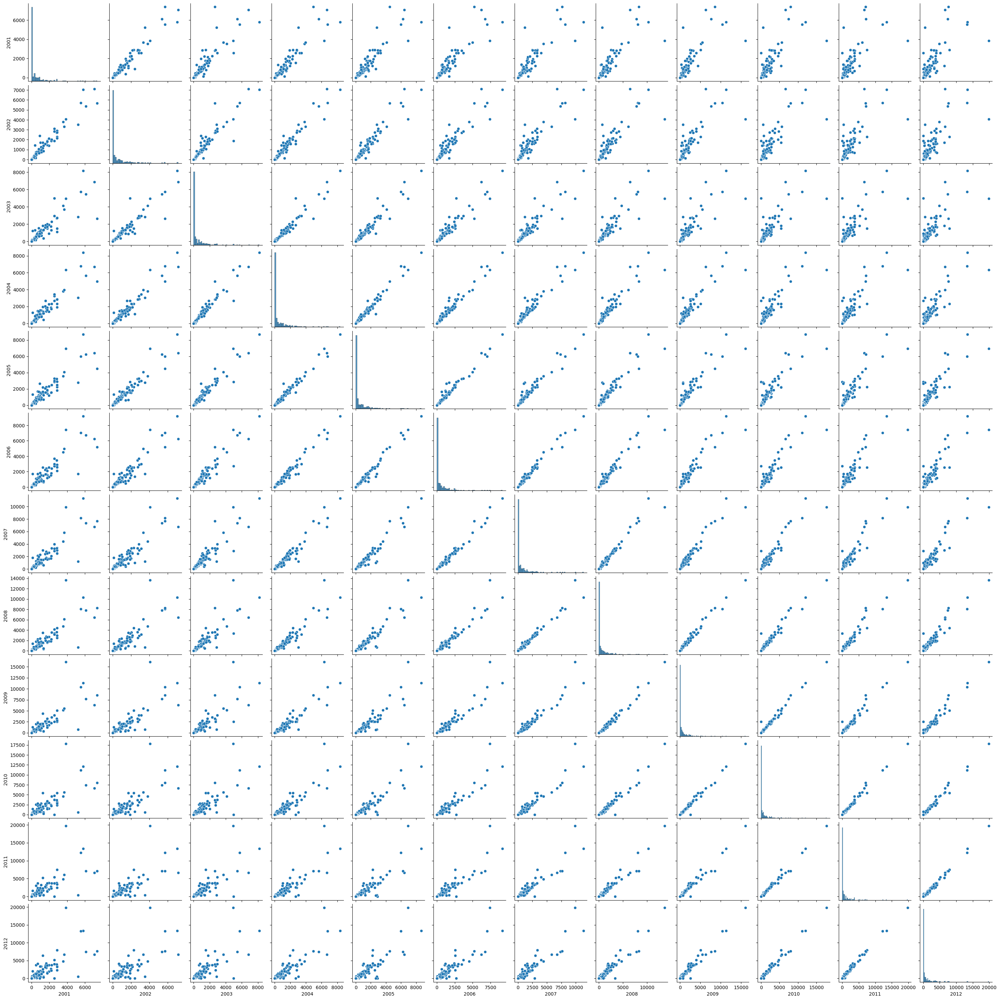

In [53]:
sns.pairplot(df[year_columns])
plt.show()


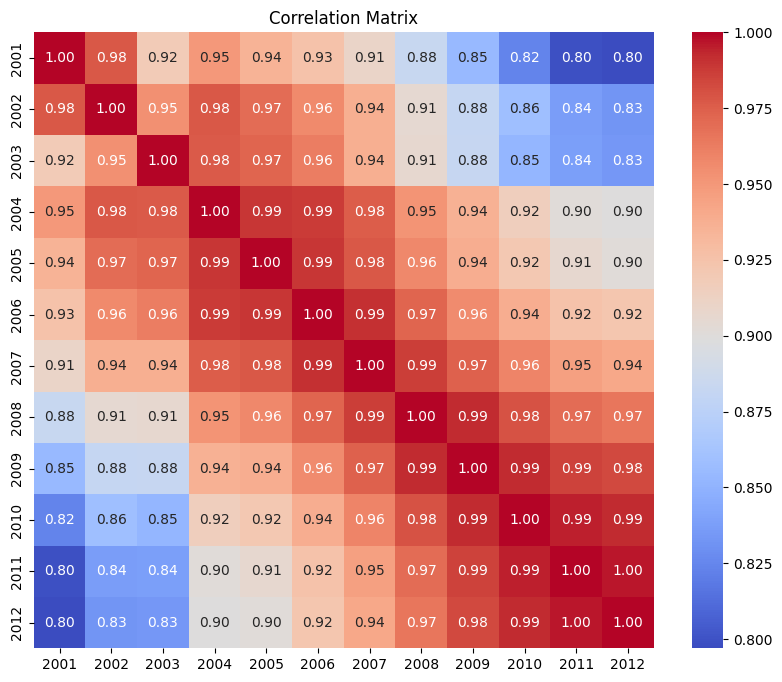

In [54]:
corr_matrix = df[year_columns].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


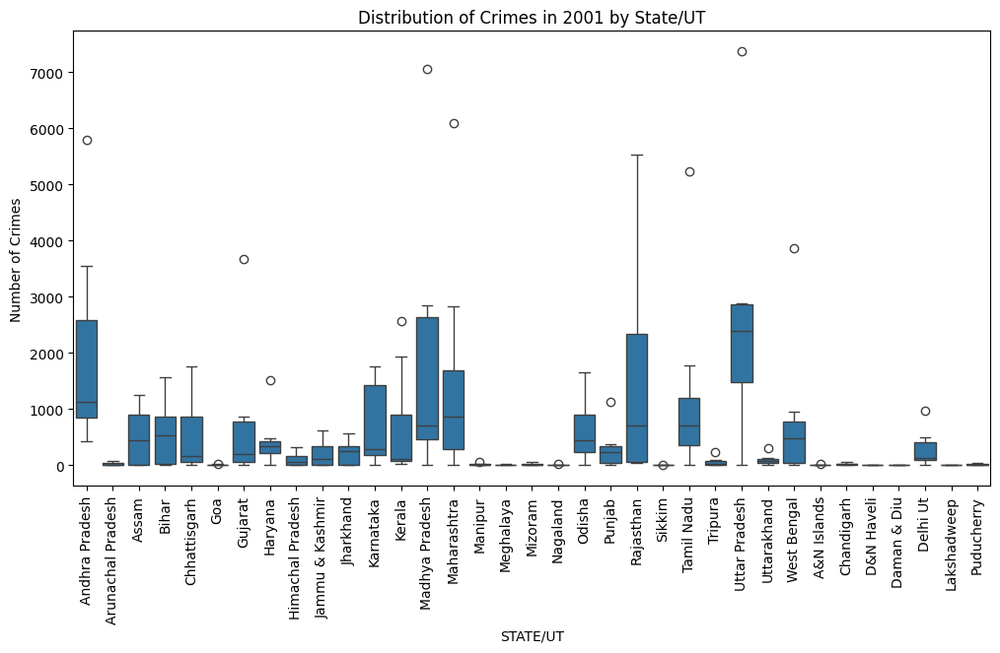

In [55]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='STATE/UT', y='2001')
plt.title('Distribution of Crimes in 2001 by State/UT')
plt.xticks(rotation=90)
plt.ylabel('Number of Crimes')
plt.show()


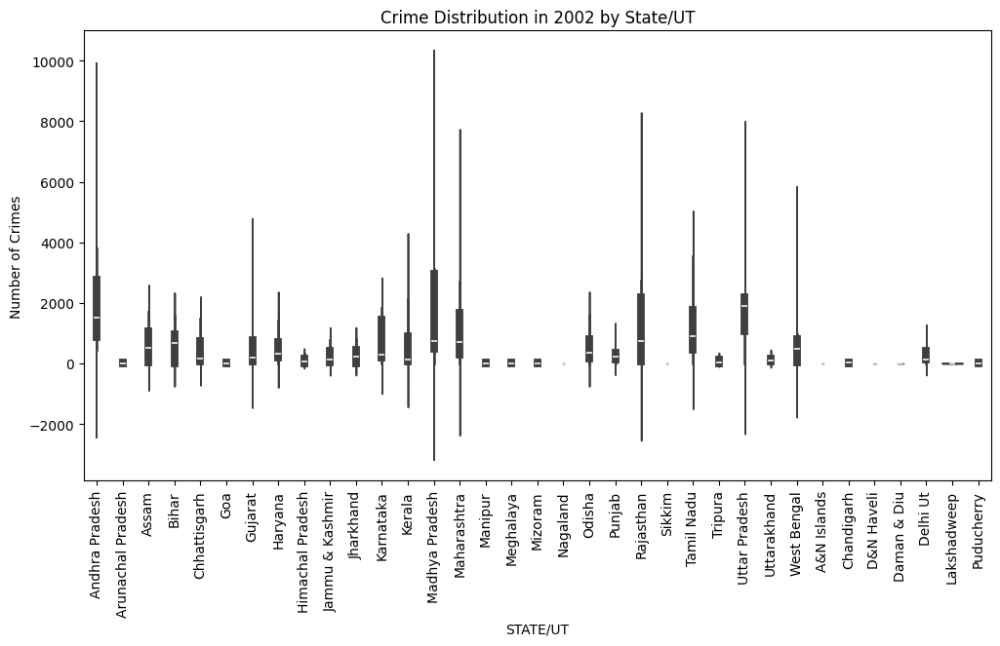

In [56]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='STATE/UT', y='2002')
plt.title('Crime Distribution in 2002 by State/UT')
plt.xticks(rotation=90)
plt.ylabel('Number of Crimes')
plt.show()


<ipython-input-57-3c2ecb66f979>:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_melted, x='STATE/UT', y='Crimes', hue='Year', ci=None)


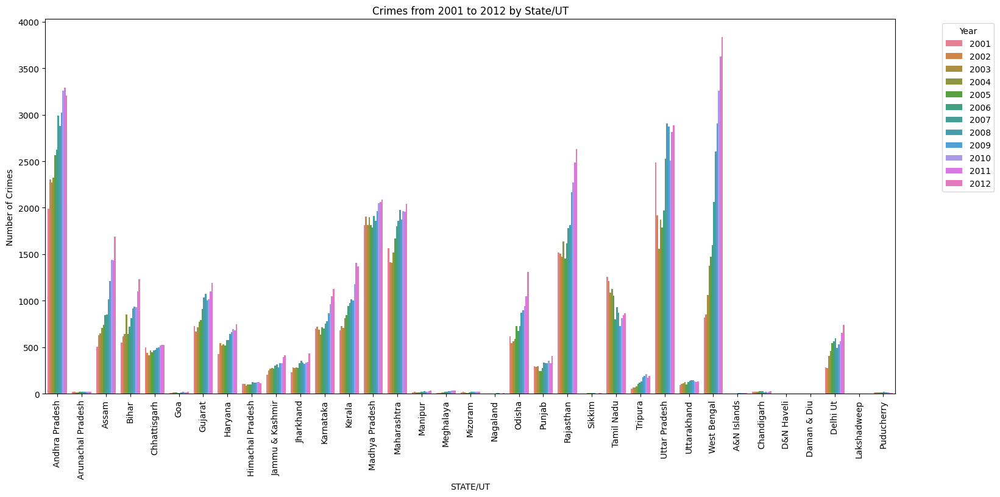

In [57]:
# Melt the dataframe for all years
df_melted = df.melt(
    id_vars=['STATE/UT'],
    value_vars=['2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012'],
    var_name='Year',
    value_name='Crimes'
)

# Plot a bar plot for all years
plt.figure(figsize=(18, 8))
sns.barplot(data=df_melted, x='STATE/UT', y='Crimes', hue='Year', ci=None)
plt.title('Crimes from 2001 to 2012 by State/UT')
plt.xticks(rotation=90)
plt.ylabel('Number of Crimes')
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')  # Place legend outside plot
plt.show()


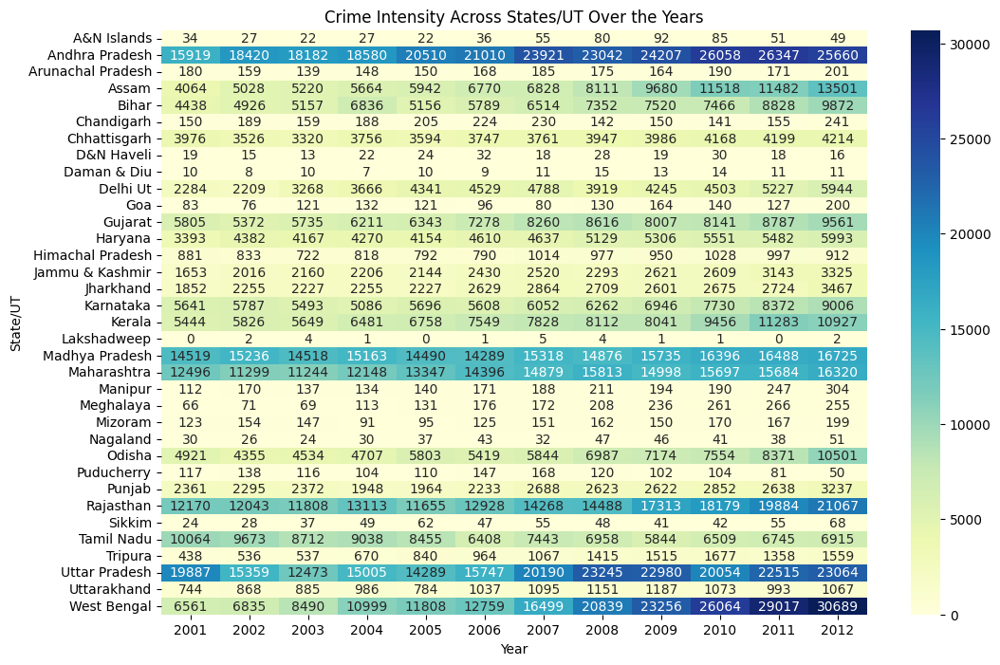

In [58]:
heatmap_data = df.pivot_table(index='STATE/UT', values=year_columns, aggfunc='sum')

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='.0f')
plt.title('Crime Intensity Across States/UT Over the Years')
plt.xlabel('Year')
plt.ylabel('State/UT')
plt.show()


# 8. Multivariate Analysis

In [59]:
categorical_cols = df.select_dtypes(include=['object']).columns

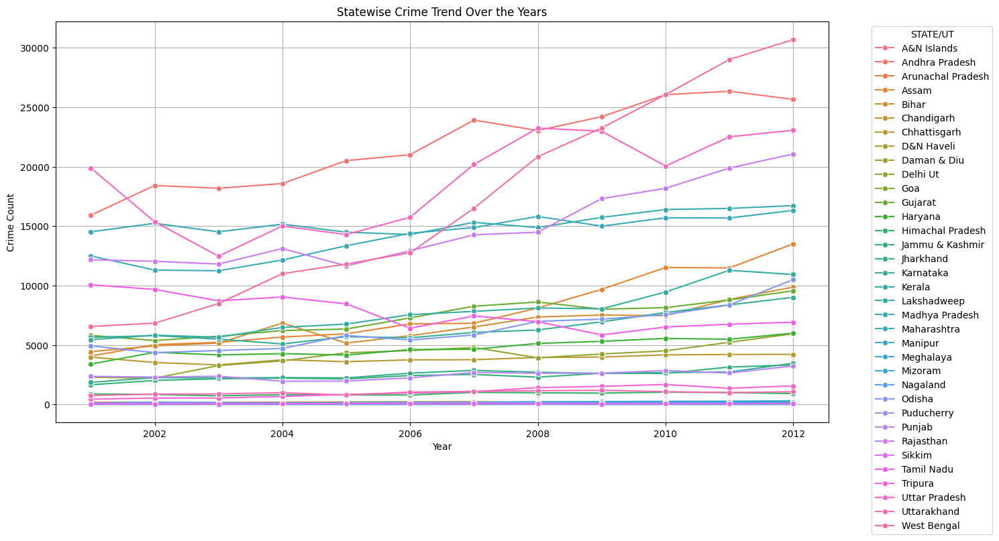

In [60]:
# Total crime count per state over the years
state_crime_trend = df_years.groupby(['Year', 'STATE/UT'])['Crime Count'].sum().reset_index()

plt.figure(figsize=(15, 8))
sns.lineplot(data=state_crime_trend, x='Year', y='Crime Count', hue='STATE/UT', marker='o')

# Add title and labels
plt.title('Statewise Crime Trend Over the Years')
plt.xlabel('Year')
plt.ylabel('Crime Count')

# Customize the legend
plt.legend(title='STATE/UT', bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust position if needed

plt.grid(True)
plt.tight_layout()
plt.show()


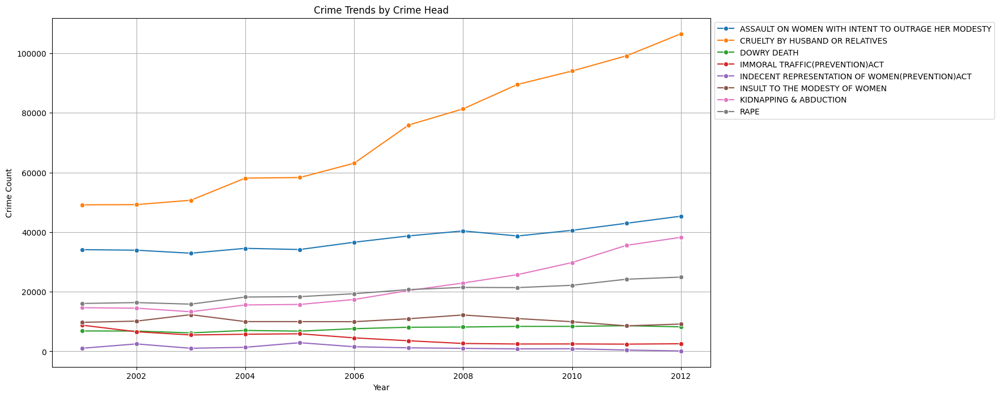

In [61]:
# Total crime count for each CRIME HEAD over the years
crime_head_trend = df_years.groupby(['Year', 'CRIME HEAD'])['Crime Count'].sum().reset_index()
plt.figure(figsize=(15, 8))
sns.lineplot(data=crime_head_trend, x='Year', y='Crime Count', hue='CRIME HEAD', marker='o')
plt.title('Crime Trends by Crime Head')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


<Figure size 1200x800 with 0 Axes>

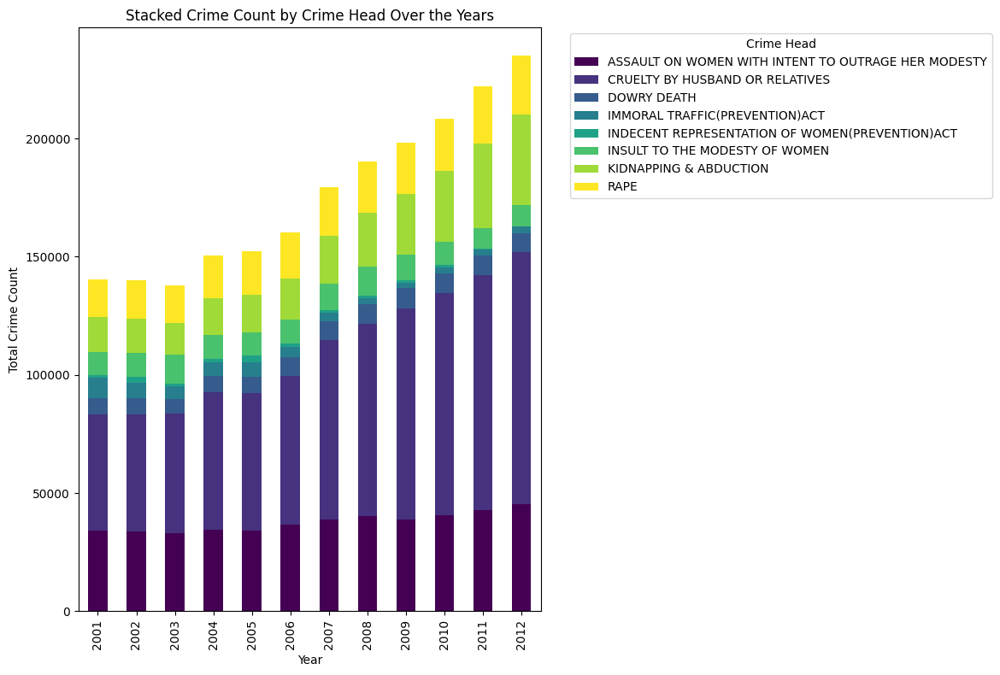

In [62]:
# Assuming your dataset has columns: 'STATE/UT', 'CRIME HEAD', '2001' to '2012'
# Step 1: Reshape the data for plotting
years = [str(year) for year in range(2001, 2013)]
df_melted = df.melt(id_vars=['STATE/UT', 'CRIME HEAD'], value_vars=years,
                    var_name='Year', value_name='Crime Count')

# Step 2: Group by Year and CRIME HEAD, summing the crime counts
crime_trend = df_melted.groupby(['Year', 'CRIME HEAD'])['Crime Count'].sum().unstack()

# Step 3: Plot the stacked bar chart
plt.figure(figsize=(12, 8))  # Set figure size
crime_trend.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='viridis')  # Stacked bar chart

# Set axis labels and title
plt.xlabel('Year')
plt.ylabel('Total Crime Count')
plt.title('Stacked Crime Count by Crime Head Over the Years')

# Customize the legend
plt.legend(title="Crime Head", bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust legend position

plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()


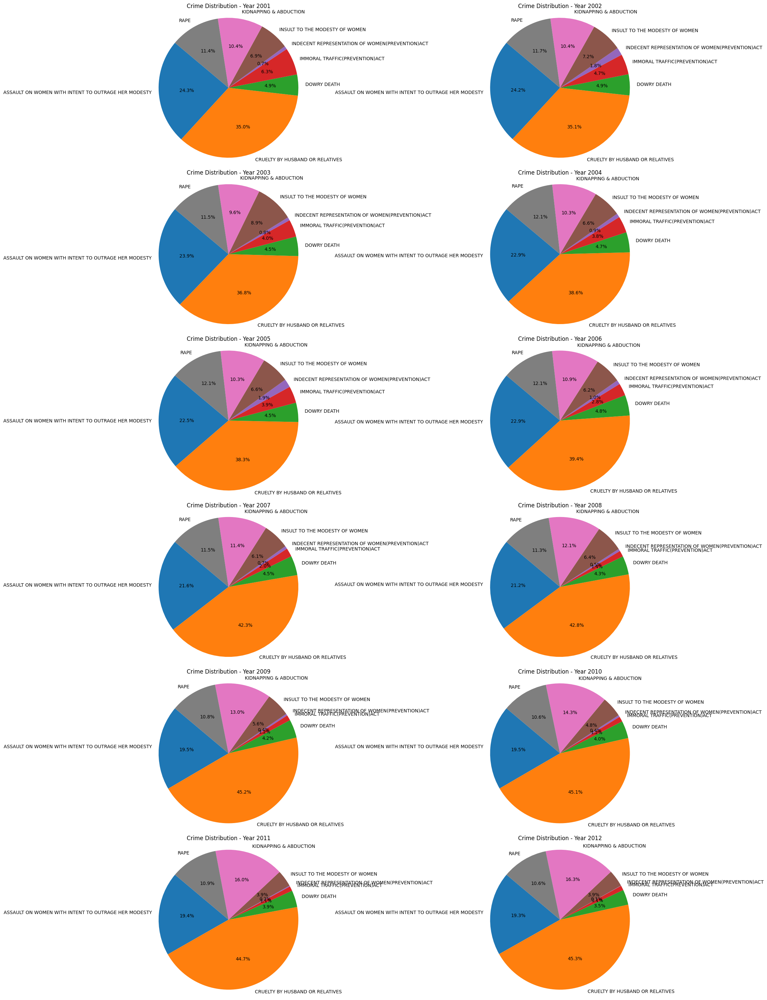

In [63]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming your dataset has columns: 'STATE/UT', 'CRIME HEAD', '2001' to '2012'
# Step 1: Reshape the data for plotting
years = [str(year) for year in range(2001, 2013)]
df_melted = df.melt(id_vars=['STATE/UT', 'CRIME HEAD'], value_vars=years,
                    var_name='Year', value_name='Crime Count')

# Step 2: Aggregate data by Year and CRIME HEAD
crime_distribution = df_melted.groupby(['Year', 'CRIME HEAD'])['Crime Count'].sum().unstack()

# Step 3: Get unique years
unique_years = crime_distribution.index.unique()

# Step 4: Calculate grid dimensions
num_years = len(unique_years)
num_rows = (num_years + 1) // 2  # 2 subplots per row
num_cols = 2

# Step 5: Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Flatten the axs array if it's not already 1-dimensional
if not isinstance(axs, (list, np.ndarray)):
    axs = np.array([axs])

# Step 6: Plot pie charts for each year
for i, year in enumerate(unique_years):
    year_data = crime_distribution.loc[year].dropna()  # Filter data for the current year
    ax = axs[i // num_cols, i % num_cols]
    ax.pie(year_data, labels=year_data.index, autopct='%1.1f%%', startangle=140)
    ax.set_title(f'Crime Distribution - Year {year}', loc='center')
    ax.axis('equal')  # Equal aspect ratio for circular pie

# Step 7: Hide empty subplots
for j in range(num_years, num_rows * num_cols):
    axs.flatten()[j].axis('off')

# Step 8: Adjust layout
plt.tight_layout()

# Show plot
plt.show()


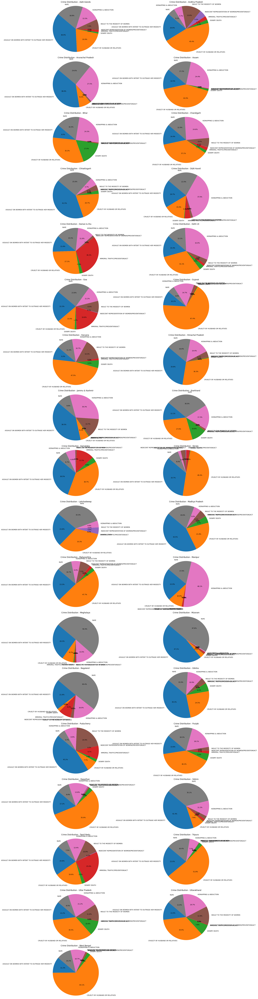

In [64]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming your dataset has columns: 'STATE/UT', 'CRIME HEAD', '2001' to '2012'
# Step 1: Reshape the data for plotting
years = [str(year) for year in range(2001, 2013)]
df_melted = df.melt(id_vars=['STATE/UT', 'CRIME HEAD'], value_vars=years,
                    var_name='Year', value_name='Crime Count')

# Step 2: Aggregate data by STATE/UT and CRIME HEAD
state_distribution = df_melted.groupby(['STATE/UT', 'CRIME HEAD'])['Crime Count'].sum().unstack()

# Step 3: Get unique states/UTs
unique_states = state_distribution.index.unique()

# Step 4: Calculate grid dimensions
num_states = len(unique_states)
num_rows = (num_states + 1) // 2  # 2 subplots per row
num_cols = 2

# Step 5: Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))

# Flatten the axs array if it's not already 1-dimensional
if not isinstance(axs, (list, np.ndarray)):
    axs = np.array([axs])

# Step 6: Plot pie charts for each state/UT
for i, state in enumerate(unique_states):
    state_data = state_distribution.loc[state].dropna()  # Filter data for the current state
    ax = axs[i // num_cols, i % num_cols]
    ax.pie(state_data, labels=state_data.index, autopct='%1.1f%%', startangle=140)
    ax.set_title(f'Crime Distribution - {state}', loc='center')
    ax.axis('equal')  # Equal aspect ratio for circular pie

# Step 7: Hide empty subplots
for j in range(num_states, num_rows * num_cols):
    axs.flatten()[j].axis('off')

# Step 8: Adjust layout
plt.tight_layout()

# Show plot
plt.show()


Unique States/UTs: ['Andhra Pradesh' 'Arunachal Pradesh' 'Assam' 'Bihar' 'Chhattisgarh' 'Goa'
 'Gujarat' 'Haryana' 'Himachal Pradesh' 'Jammu & Kashmir' 'Jharkhand'
 'Karnataka' 'Kerala' 'Madhya Pradesh' 'Maharashtra' 'Manipur' 'Meghalaya'
 'Mizoram' 'Nagaland' 'Odisha' 'Punjab' 'Rajasthan' 'Sikkim' 'Tamil Nadu'
 'Tripura' 'Uttar Pradesh' 'Uttarakhand' 'West Bengal' 'A&N Islands'
 'Chandigarh' 'D&N Haveli' 'Daman & Diu' 'Delhi Ut' 'Lakshadweep'
 'Puducherry']
Unique Crime Heads: ['RAPE' 'KIDNAPPING & ABDUCTION' 'DOWRY DEATH'
 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY'
 'INSULT TO THE MODESTY OF WOMEN' 'CRUELTY BY HUSBAND OR RELATIVES'
 'IMMORAL TRAFFIC(PREVENTION)ACT'
 'INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT']


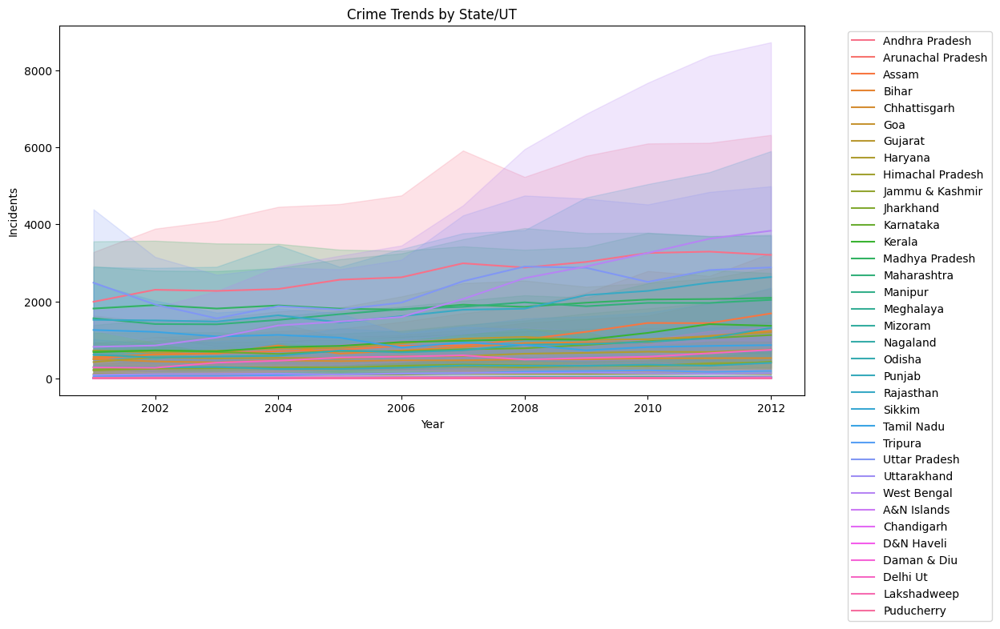

In [65]:

# Ensure years are numeric
for year in range(2001, 2013):
    df[str(year)] = pd.to_numeric(df[str(year)], errors='coerce')

value_to_remove = "TOTAL CRIMES AGAINST WOMEN"
# Remove rows where any column has the specific value
df = df[~df.isin([value_to_remove]).any(axis=1)]

value_to_remove = "All India"
# Remove rows where any column has the specific value
df = df[~df.isin([value_to_remove]).any(axis=1)]

df.shape

# Reshape the dataset to a time series format
df_long = df.melt(id_vars=["STATE/UT", "CRIME HEAD"], var_name="Year", value_name="Incidents")
df_long["Year"] = df_long["Year"].astype(int)

# EDA: Unique values
print("Unique States/UTs:", df["STATE/UT"].unique())
print("Unique Crime Heads:", df["CRIME HEAD"].unique())

# Plot crime trends for all states
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_long, x="Year", y="Incidents", hue="STATE/UT")
plt.title("Crime Trends by State/UT")
plt.xlabel("Year")
plt.ylabel("Incidents")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


# 9. Linear Regression

In [66]:

# Normalize the data for each year
df_normalized = df.copy()
df_normalized[year_columns] = (
    df[year_columns] - df[year_columns].mean()
) / df[year_columns].std()

print("Normalized data:")
print(df_normalized.shape)
df_normalized

Normalized data:
(280, 14)


,STATE/UT,CRIME HEAD,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
0,Andhra Pradesh,RAPE,0.334419,0.471951,0.422095,0.414222,0.337352,0.385228,0.292100,0.363676,0.276196,0.333484,0.323518,0.240022
1,Arunachal Pradesh,RAPE,-0.424306,-0.435262,-0.429346,-0.429896,-0.438304,-0.432277,-0.404623,-0.401337,-0.372792,-0.376306,-0.374022,-0.380275
2,Assam,RAPE,0.285528,0.441836,0.560744,0.548553,0.598489,0.542751,0.542293,0.477640,0.530847,0.527259,0.452065,0.419644
3,Bihar,RAPE,0.349811,0.507713,0.458385,0.738349,0.520062,0.533057,0.622737,0.392009,0.127313,0.027437,0.070411,0.041719
4,Chhattisgarh,RAPE,0.414094,0.462540,0.377429,0.373489,0.384753,0.341606,0.232108,0.188006,0.154331,0.144566,0.129702,0.092971
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
282,D&N Haveli,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,-0.454184,-0.471024,-0.458193,-0.466295,-0.468468,-0.462166,-0.437346,-0.427782,-0.406708,-0.401675,-0.394948,-0.402308
283,Daman & Diu,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,-0.454184,-0.471024,-0.458193,-0.466295,-0.468468,-0.462166,-0.437346,-0.427782,-0.406708,-0.401675,-0.394948,-0.402308
284,Delhi Ut,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,-0.453279,-0.471024,-0.458193,-0.466295,-0.467606,-0.461358,-0.437346,-0.427782,-0.406708,-0.401675,-0.394450,-0.402308
285,Lakshadweep,INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT,-0.454184,-0.471024,-0.458193,-0.466295,-0.468468,-0.462166,-0.437346,-0.427782,-0.406708,-0.401135,-0.394948,-0.402308


      Andhra Pradesh - RAPE  Arunachal Pradesh - RAPE  Assam - RAPE  \
2013            1438.909091                 50.939394   1892.121212   
2014            1487.472028                 52.365967   1975.806527   
2015            1536.034965                 53.792541   2059.491841   
2016            1584.597902                 55.219114   2143.177156   
2017            1633.160839                 56.645688   2226.862471   

      Bihar - RAPE  Chhattisgarh - RAPE  Goa - RAPE  Gujarat - RAPE  \
2013   1017.030303          1035.545455   45.984848      476.606061   
2014   1005.240093          1043.090909   48.572261      495.455711   
2015    993.449883          1050.636364   51.159674      514.305361   
2016    981.659674          1058.181818   53.747086      533.155012   
2017    969.869464          1065.727273   56.334499      552.004662   

      Haryana - RAPE  Himachal Pradesh - RAPE  Jammu & Kashmir - RAPE  ...  \
2013      769.666667               182.378788              294.71212

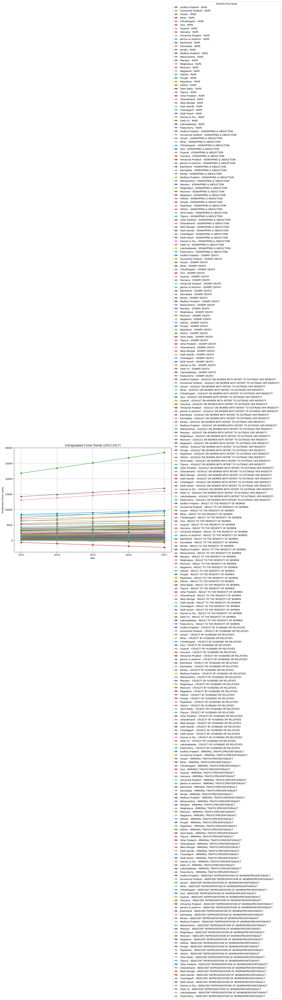

In [67]:

# Predict future crime rates for a specific State/UT and Crime Head
future_years = ['2013', '2014', '2015', '2016', '2017']
extrapolated_df = {}

for index, row in df.iterrows():
    x = np.arange(2001, 2013).reshape(-1, 1)  # Existing years
    y = row[year_columns].values  # Crime data for those years

    # Fit linear regression model
    lr_model = LinearRegression().fit(x, y)

    # Predict for future years
    future_x = np.arange(2013, 2018).reshape(-1, 1)
    future_predictions = lr_model.predict(future_x)

    # Store extrapolated results
    extrapolated_df[f"{row['STATE/UT']} - {row['CRIME HEAD']}"] = future_predictions

# Convert extrapolated data to DataFrame
extrapolated_df = pd.DataFrame(extrapolated_df, index=future_years)
print(extrapolated_df.head())

# Plot extrapolated data
plt.figure(figsize=(12, 8))
for col in extrapolated_df.columns:
    plt.plot(extrapolated_df.index, extrapolated_df[col], marker='o', label=col)

plt.title("Extrapolated Crime Trends (2013-2017)")
plt.xlabel("Year")
plt.ylabel("Predicted Crime Cases")
plt.legend(title="State/Crime Head", loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()


      Andhra Pradesh - RAPE  Arunachal Pradesh - RAPE  Assam - RAPE  \
2013               0.265457                 -0.366618      0.514003   
2014               0.252524                 -0.360217      0.517085   
2015               0.239591                 -0.353815      0.520167   
2016               0.226658                 -0.347414      0.523248   
2017               0.213725                 -0.341012      0.526330   

      Bihar - RAPE  Chhattisgarh - RAPE  Goa - RAPE  Gujarat - RAPE  \
2013      0.054591             0.048418   -0.367727       -0.168123   
2014      0.006720             0.013615   -0.360017       -0.164540   
2015     -0.041151            -0.021187   -0.352308       -0.160956   
2016     -0.089022            -0.055990   -0.344598       -0.157373   
2017     -0.136892            -0.090792   -0.336889       -0.153790   

      Haryana - RAPE  Himachal Pradesh - RAPE  Jammu & Kashmir - RAPE  ...  \
2013       -0.020672                -0.308381               -0.25438

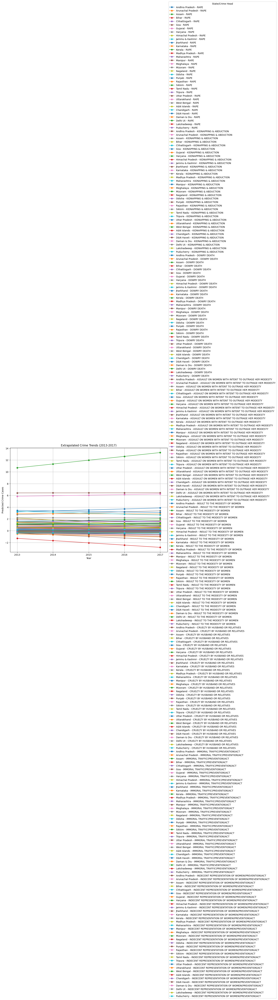

In [68]:


# Predict future crime rates for a specific State/UT and Crime Head
future_years = ['2013', '2014', '2015', '2016', '2017']
extrapolated_df_normalized = {}

for index, row in df_normalized.iterrows():
    x = np.arange(2001, 2013).reshape(-1, 1)  # Existing years
    y = row[year_columns].values  # Crime data for those years

    # Fit linear regression model
    lr_model = LinearRegression().fit(x, y)

    # Predict for future years
    future_x = np.arange(2013, 2018).reshape(-1, 1)
    future_predictions = lr_model.predict(future_x)

    # Store extrapolated results
    extrapolated_df_normalized[f"{row['STATE/UT']} - {row['CRIME HEAD']}"] = future_predictions

# Convert extrapolated data to DataFrame
extrapolated_df_normalized = pd.DataFrame(extrapolated_df_normalized, index=future_years)
print(extrapolated_df_normalized.head())

# Plot extrapolated data
plt.figure(figsize=(12, 8))
for col in extrapolated_df_normalized.columns:
    plt.plot(extrapolated_df_normalized.index, extrapolated_df_normalized[col], marker='o', label=col)

plt.title("Extrapolated Crime Trends (2013-2017)")
plt.xlabel("Year")
plt.ylabel("Predicted Crime Cases")
plt.legend(title="State/Crime Head", loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()


      Andhra Pradesh  Arunachal Pradesh         Assam         Bihar  \
2013    28009.242424         188.893939  13104.242424   9422.409091   
2014    28961.228438         191.928904  13917.613054   9848.241259   
2015    29913.214452         194.963869  14730.983683  10274.073427   
2016    30865.200466         197.998834  15544.354312  10699.905594   
2017    31817.186480         201.033800  16357.724942  11125.737762   

      Chhattisgarh         Goa       Gujarat      Haryana  Himachal Pradesh  \
2013   4232.090909  169.090909   9744.681818  6036.166667       1015.515152   
2014   4290.951049  176.258741  10114.171329  6233.089744       1034.389277   
2015   4349.811189  183.426573  10483.660839  6430.012821       1053.263403   
2016   4408.671329  190.594406  10853.150350  6626.935897       1072.137529   
2017   4467.531469  197.762238  11222.639860  6823.858974       1091.011655   

      Jammu & Kashmir  ...  Uttar Pradesh  Uttarakhand   West Bengal  \
2013      3205.984848  ...

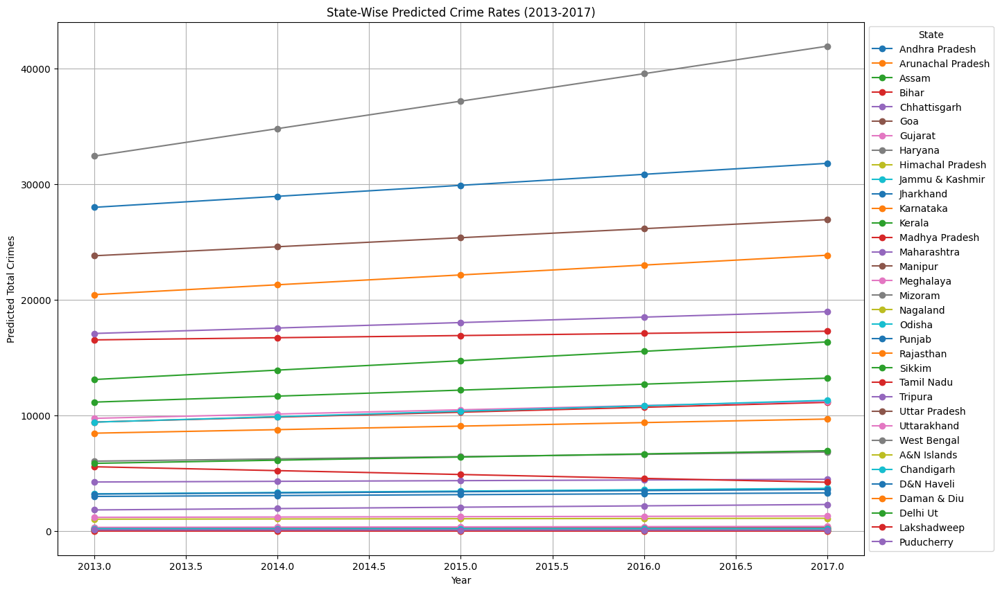

In [69]:

# Define future years to predict
future_years = [2013, 2014, 2015, 2016, 2017]

# Create a dictionary to store predictions
statewise_predictions = {}

# Loop through each state to predict future crime rates
for state in df['STATE/UT'].unique():
    state_data = df[df['STATE/UT'] == state]
    aggregated_crimes = state_data[year_columns].sum(axis=0)  # Aggregate all crime heads

    # Prepare data for linear regression
    x = np.array(range(2001, 2013)).reshape(-1, 1)  # Years 2001-2012
    y = aggregated_crimes.values                    # Aggregated crime rates

    # Fit Linear Regression Model
    lr_model = LinearRegression().fit(x, y)

    # Predict for future years
    future_x = np.array(future_years).reshape(-1, 1)
    future_predictions = lr_model.predict(future_x)

    # Store results
    statewise_predictions[state] = future_predictions

# Convert predictions to a DataFrame
statewise_predictions_df = pd.DataFrame(statewise_predictions, index=future_years)
print(statewise_predictions_df)

# Plot future predictions for each state
plt.figure(figsize=(15, 10))
for state in statewise_predictions_df.columns:
    plt.plot(statewise_predictions_df.index, statewise_predictions_df[state], marker='o', label=state)

plt.title("State-Wise Predicted Crime Rates (2013-2017)")
plt.xlabel("Year")
plt.ylabel("Predicted Total Crimes")
plt.legend(title="State", loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()


      Andhra Pradesh  Arunachal Pradesh     Assam     Bihar  Chhattisgarh  \
2013        9.858081          -3.038365  3.258995  1.299579     -1.303899   
2014        9.559028          -2.985819  3.497693  1.332360     -1.390127   
2015        9.259975          -2.933273  3.736390  1.365140     -1.476356   
2016        8.960922          -2.880727  3.975087  1.397920     -1.562584   
2017        8.661869          -2.828181  4.213784  1.430701     -1.648812   

           Goa   Gujarat   Haryana  Himachal Pradesh  Jammu & Kashmir  ...  \
2013 -3.041373  1.441247 -0.362620         -2.673792        -1.641521  ...   
2014 -2.983789  1.414535 -0.394154         -2.644315        -1.616535  ...   
2015 -2.926206  1.387822 -0.425688         -2.614839        -1.591549  ...   
2016 -2.868622  1.361109 -0.457222         -2.585362        -1.566564  ...   
2017 -2.811039  1.334396 -0.488755         -2.555885        -1.541578  ...   

      Uttar Pradesh  Uttarakhand  West Bengal  A&N Islands  Chandiga

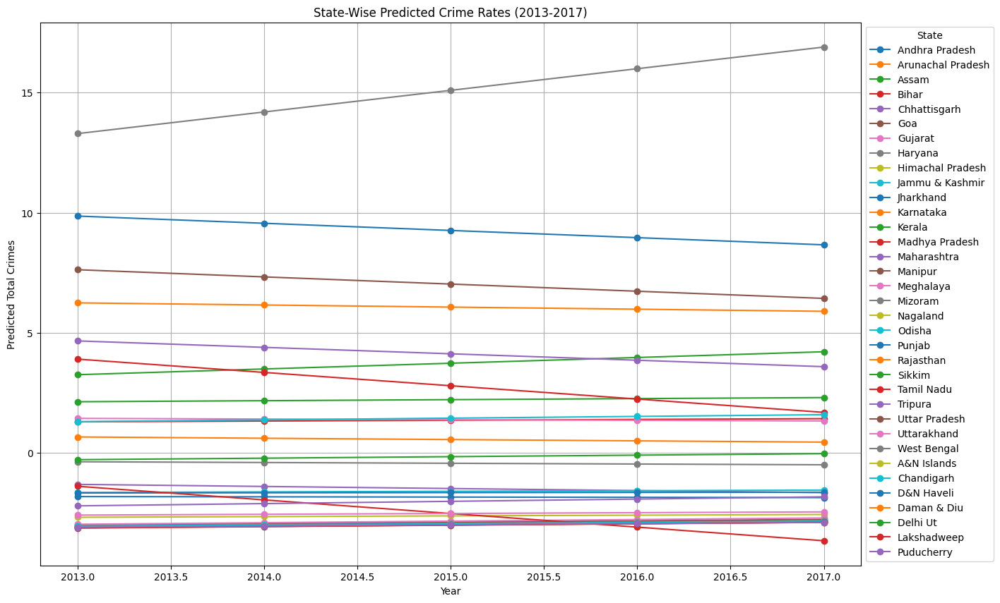

In [70]:

# Define future years to predict
future_years = [2013, 2014, 2015, 2016, 2017]

# Create a dictionary to store predictions
statewise_predictions = {}

# Loop through each state to predict future crime rates
for state in df_normalized['STATE/UT'].unique():
    state_data = df_normalized[df_normalized['STATE/UT'] == state]
    aggregated_crimes = state_data[year_columns].sum(axis=0)  # Aggregate all crime heads

    # Prepare data for linear regression
    x = np.array(range(2001, 2013)).reshape(-1, 1)  # Years 2001-2012
    y = aggregated_crimes.values                    # Aggregated crime rates

    # Fit Linear Regression Model
    lr_model = LinearRegression().fit(x, y)

    # Predict for future years
    future_x = np.array(future_years).reshape(-1, 1)
    future_predictions = lr_model.predict(future_x)

    # Store results
    statewise_predictions[state] = future_predictions

# Convert predictions to a DataFrame
statewise_predictions_df_normalized = pd.DataFrame(statewise_predictions, index=future_years)
print(statewise_predictions_df_normalized)

# Plot future predictions for each state
plt.figure(figsize=(15, 10))
for state in statewise_predictions_df_normalized.columns:
    plt.plot(statewise_predictions_df_normalized.index, statewise_predictions_df_normalized[state], marker='o', label=state)

plt.title("State-Wise Predicted Crime Rates (2013-2017)")
plt.xlabel("Year")
plt.ylabel("Predicted Total Crimes")
plt.legend(title="State", loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()


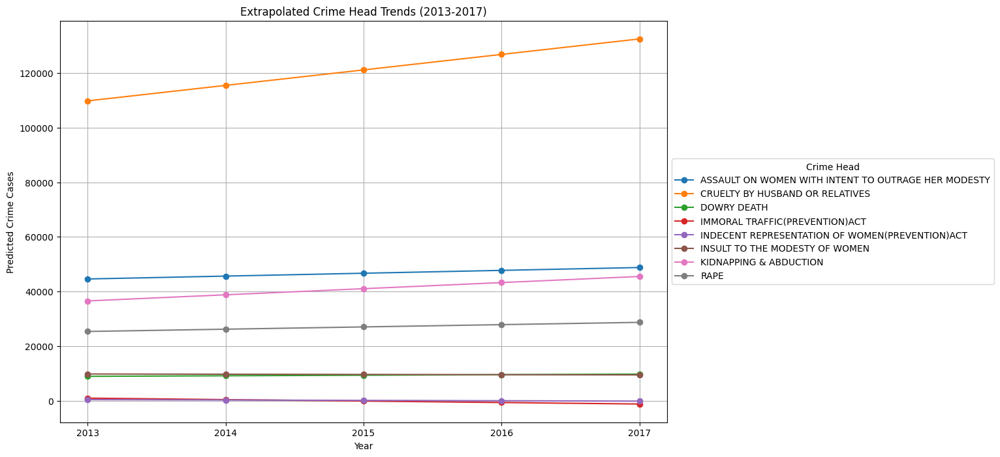

In [71]:

# Convert year columns to numeric
year_columns = [str(year) for year in range(2001, 2013)]
df[year_columns] = df[year_columns].apply(pd.to_numeric)

# Aggregate data for each Crime Head (sum across all States/UTs)
crime_head_data = df.groupby('CRIME HEAD')[year_columns].sum()

# Prepare for future prediction
future_years = ['2013', '2014', '2015', '2016', '2017']
crime_head_predictions = {}
residuals_lr_GVA = {}

# Predict future trends for each Crime Head
for crime_head, row in crime_head_data.iterrows():
    # Drop or interpolate missing data
    row = row.dropna()  # Drop missing values
    # row = row.interpolate(method='linear', axis=0).fillna(method='bfill').fillna(method='ffill')  # Alternative

    x = np.arange(2001, 2001 + len(row)).reshape(-1, 1)  # Adjust x to match available data
    y = row.values  # Total crime cases for each year

    # Check if lengths match
    if len(x) != len(y):
        print(f"Skipping {crime_head} due to length mismatch")
        continue

    # Fit linear regression model
    lr_model = LinearRegression().fit(x, y)

    # Predict for future years
    future_x = np.arange(2001 + len(row), 2001 + len(row) + 5).reshape(-1, 1)
    future_predictions = lr_model.predict(future_x)

    # Store predictions in a dictionary
    crime_head_predictions[crime_head] = future_predictions

    # Calculate residuals for historical data
    fitted_values = lr_model.predict(x)
    residuals_lr_GVA[crime_head] = y - fitted_values

# Convert predictions to DataFrame
predicted_crime_head_df = pd.DataFrame(crime_head_predictions, index=future_years)

# Save predictions to a CSV file if needed
predicted_crime_head_df.to_csv('crime_head_predictions.csv')

# Plot future trends for each Crime Head
plt.figure(figsize=(12, 8))
for crime_head in predicted_crime_head_df.columns:
    plt.plot(predicted_crime_head_df.index, predicted_crime_head_df[crime_head], marker='o', label=crime_head)

plt.title("Extrapolated Crime Head Trends (2013-2017)")
plt.xlabel("Year")
plt.ylabel("Predicted Crime Cases")
plt.legend(title="Crime Head", loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()


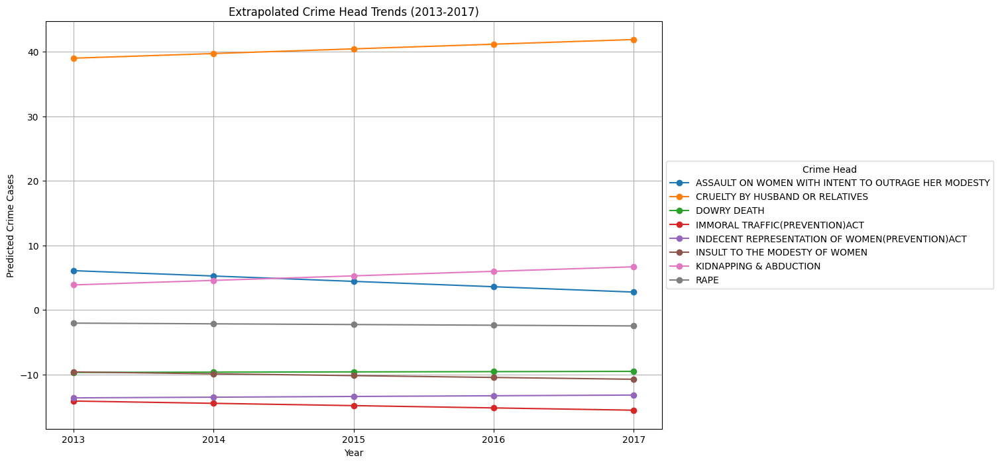

RMSE values:
ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY: 0.7439
CRUELTY BY HUSBAND OR RELATIVES: 1.2684
DOWRY DEATH: 0.3011
IMMORAL TRAFFIC(PREVENTION)ACT: 0.8192
INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT: 0.4061
INSULT TO THE MODESTY OF WOMEN: 0.8250
KIDNAPPING & ABDUCTION: 1.0334
RAPE: 0.4155


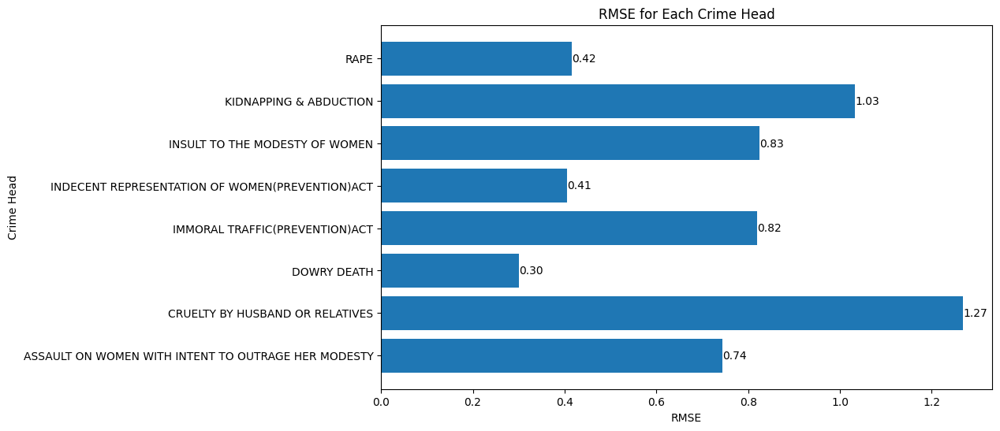

R-squared score for Each Crime Head:
ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY: 0.9367
CRUELTY BY HUSBAND OR RELATIVES: 0.7945
DOWRY DEATH: 0.1760
IMMORAL TRAFFIC(PREVENTION)ACT: 0.6908
INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT: 0.4655
INSULT TO THE MODESTY OF WOMEN: 0.5819
KIDNAPPING & ABDUCTION: 0.8459
RAPE: 0.4467


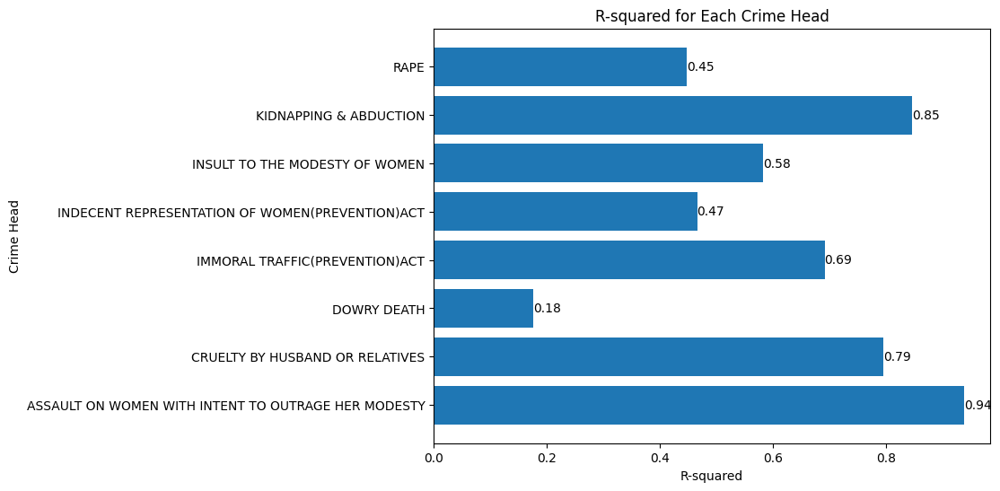

In [72]:
# Convert year columns to numeric
year_columns = [str(year) for year in range(2001, 2013)]
df[year_columns] = df[year_columns].apply(pd.to_numeric)

# Normalize the data for each year
df_normalized = df.copy()
df_normalized[year_columns] = (df[year_columns] - df[year_columns].mean()) / df[year_columns].std()

# Aggregate data for each Crime Head (sum across all States/UTs)
crime_head_data = df_normalized.groupby('CRIME HEAD')[year_columns].sum()

# Prepare for future prediction (for years 2013-2017)
future_years = ['2013', '2014', '2015', '2016', '2017']
crime_head_predictions = {}

# Predict future trends for each Crime Head using Linear Regression
for crime_head, row in crime_head_data.iterrows():
    # Handle missing values (drop any if needed)
    row = row.dropna()

    # Prepare input and output for regression
    x = np.arange(2001, 2001 + len(row)).reshape(-1, 1)  # x: years from 2001 to 2012
    y = row.values  # Total crime cases for each year

    # Fit linear regression model
    lr_model = LinearRegression().fit(x, y)

    # Predict for future years (2013-2017)
    future_x = np.arange(2001 + len(row), 2001 + len(row) + 5).reshape(-1, 1)  # Years 2013-2017
    future_predictions = lr_model.predict(future_x)

    # Store predictions in a dictionary
    crime_head_predictions[crime_head] = future_predictions

# Convert predictions to DataFrame
predicted_crime_head_df = pd.DataFrame(crime_head_predictions, index=future_years)

# Plot future trends for each Crime Head
plt.figure(figsize=(12, 8))
for crime_head in predicted_crime_head_df.columns:
    plt.plot(predicted_crime_head_df.index, predicted_crime_head_df[crime_head], marker='o', label=crime_head)

plt.title("Extrapolated Crime Head Trends (2013-2017)")
plt.xlabel("Year")
plt.ylabel("Predicted Crime Cases")
plt.legend(title="Crime Head", loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()

# Calculate residuals for historical data (2001-2012) and print them
residuals_lr_GVA = {}

for crime_head in crime_head_data.index:
    x = np.arange(2001, 2013).reshape(-1, 1)
    y = crime_head_data.loc[crime_head].values

    # Train the linear regression model
    lr_model = LinearRegression().fit(x, y)

    # Make predictions
    fitted_values = lr_model.predict(x)

    # Calculate residuals (actual - predicted)
    residuals = y - fitted_values
    residuals_lr_GVA[crime_head] = residuals

# Calculate RMSE for each Crime Head
rmse_per_crime_head = {crime_head: np.sqrt(np.mean(residuals_lr_GVA[crime_head]**2)) for crime_head in residuals_lr_GVA}

# Print RMSE values for each Crime Head
print("RMSE values:")
for crime_head, rmse_value in rmse_per_crime_head.items():
    print(f"{crime_head}: {rmse_value:.4f}")

# Plot RMSE values
plt.figure(figsize=(10, 6))
bars = plt.barh(list(rmse_per_crime_head.keys()), list(rmse_per_crime_head.values()))
plt.title('RMSE for Each Crime Head')
plt.ylabel('Crime Head')
plt.xlabel('RMSE')

# Adding the RMSE value on the bars
for bar, rmse_value in zip(bars, rmse_per_crime_head.values()):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{rmse_value:.2f}', va='center')

plt.show()

# Calculate R-squared for each Crime Head
r2_scores_crime_head = {}

for crime_head in crime_head_data.index:
    x = np.arange(2001, 2013).reshape(-1, 1)
    y = crime_head_data.loc[crime_head].values

    # Fit the linear regression model
    lr_model = LinearRegression().fit(x, y)

    # Predict GVA values for the known years
    y_pred_known = lr_model.predict(x)

    # Calculate R-squared score
    r2_scores_crime_head[crime_head] = r2_score(y, y_pred_known)

# Display R-squared scores for each Crime Head
print("R-squared score for Each Crime Head:")
for crime_head, r2_score_value in r2_scores_crime_head.items():
    print(f"{crime_head}: {r2_score_value:.4f}")

# Plot R-squared values
plt.figure(figsize=(8, 6))
bars = plt.barh(list(r2_scores_crime_head.keys()), list(r2_scores_crime_head.values()))
plt.title('R-squared for Each Crime Head')
plt.ylabel('Crime Head')
plt.xlabel('R-squared')

# Add annotations with the R-squared values
for bar, r2_score_value in zip(bars, r2_scores_crime_head.values()):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{r2_score_value:.2f}', va='center')

plt.show()


Mean of Residuals for Each Crime Head:
ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY: 0.00
CRUELTY BY HUSBAND OR RELATIVES: 0.00
DOWRY DEATH: -0.00
IMMORAL TRAFFIC(PREVENTION)ACT: -0.00
INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT: 0.00
INSULT TO THE MODESTY OF WOMEN: 0.00
KIDNAPPING & ABDUCTION: 0.00
RAPE: -0.00

Mean of Residuals (%) for Each Crime Head:
ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY: -0.56%
CRUELTY BY HUSBAND OR RELATIVES: -0.16%
DOWRY DEATH: -0.09%
IMMORAL TRAFFIC(PREVENTION)ACT: -0.68%
INDECENT REPRESENTATION OF WOMEN(PREVENTION)ACT: -0.08%
INSULT TO THE MODESTY OF WOMEN: -1.76%
KIDNAPPING & ABDUCTION: 20.11%
RAPE: -18.42%


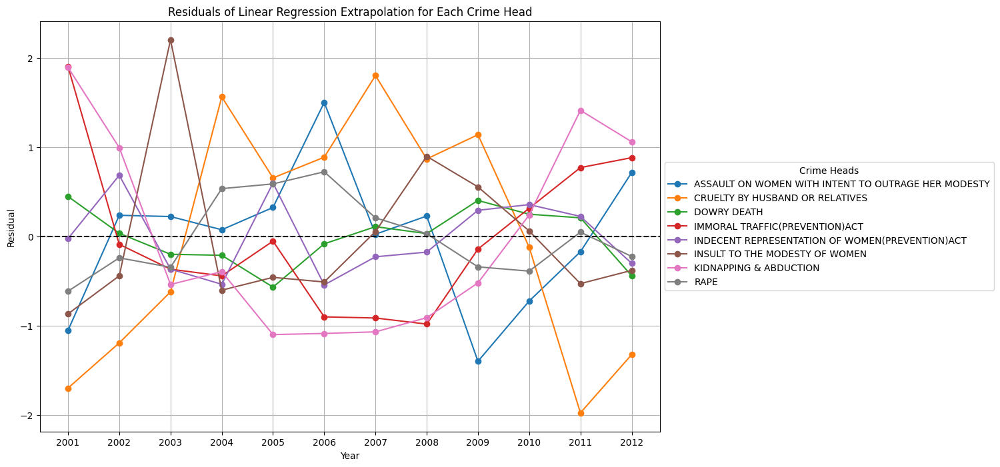

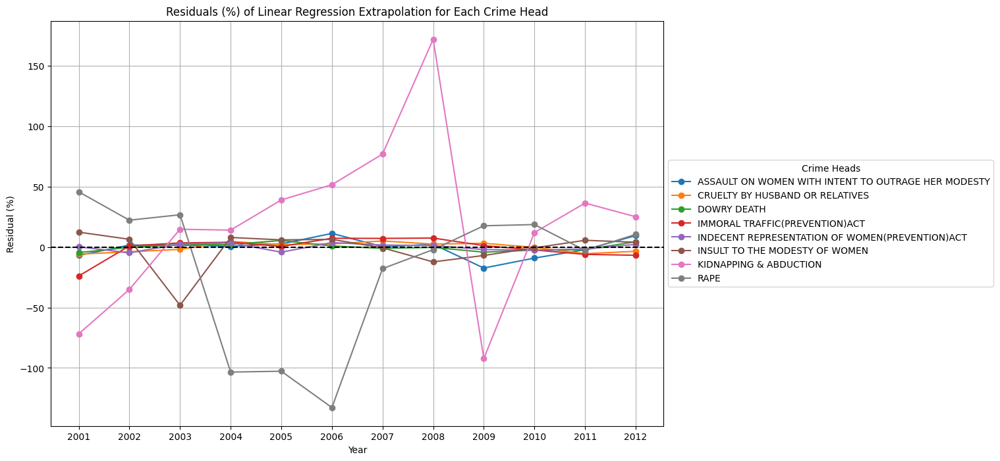

In [73]:
# Calculate residuals for historical data and print them

residuals_lr_GVA = {}

for crime_head in crime_head_data.index:
    x = np.arange(2001, 2013).reshape(-1, 1)
    y = crime_head_data.loc[crime_head].values

    # Train the linear regression model
    lr_model = LinearRegression().fit(x, y)

    # Make predictions
    fitted_values = lr_model.predict(x)

    # Calculate residuals (actual - predicted)
    residuals = y - fitted_values
    residuals_lr_GVA[crime_head] = residuals

# Calculate mean residuals for each Crime Head
mean_residuals = {crime_head: np.mean(residuals_lr_GVA[crime_head]) for crime_head in residuals_lr_GVA}

print("\nMean of Residuals for Each Crime Head:")
for crime_head, mean_residual in mean_residuals.items():
    print(f"{crime_head}: {mean_residual:.2f}")

# Calculate mean of residuals (%) for each Crime Head
residuals_lr_percentage = {}
for crime_head in residuals_lr_GVA:
    residuals_lr_percentage[crime_head] = (residuals_lr_GVA[crime_head] / crime_head_data.loc[crime_head].values) * 100

# Calculate mean residuals (%) for each Crime Head
mean_residuals_percentage = {crime_head: np.mean(residuals_lr_percentage[crime_head]) for crime_head in residuals_lr_percentage}

print("\nMean of Residuals (%) for Each Crime Head:")
for crime_head, mean_residual_percentage in mean_residuals_percentage.items():
    print(f"{crime_head}: {mean_residual_percentage:.2f}%")

# Plot the residuals
plt.figure(figsize=(12, 8))
for crime_head in residuals_lr_GVA.keys():
    plt.plot(crime_head_data.columns, residuals_lr_GVA[crime_head], marker='o', label=crime_head)

plt.axhline(y=0, color='black', linestyle='--')
plt.title('Residuals of Linear Regression Extrapolation for Each Crime Head')
plt.xlabel('Year')
plt.ylabel('Residual')
plt.legend(title='Crime Heads', loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()

# Plot the residuals as percentage
plt.figure(figsize=(12, 8))
for crime_head in residuals_lr_percentage.keys():
    plt.plot(crime_head_data.columns, residuals_lr_percentage[crime_head], marker='o', label=crime_head)

plt.axhline(y=0, color='black', linestyle='--')
plt.title('Residuals (%) of Linear Regression Extrapolation for Each Crime Head')
plt.xlabel('Year')
plt.ylabel('Residual (%)')
plt.legend(title='Crime Heads', loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()

# 10. Polynomial Extrapolation

Normalized data:
(280, 14)


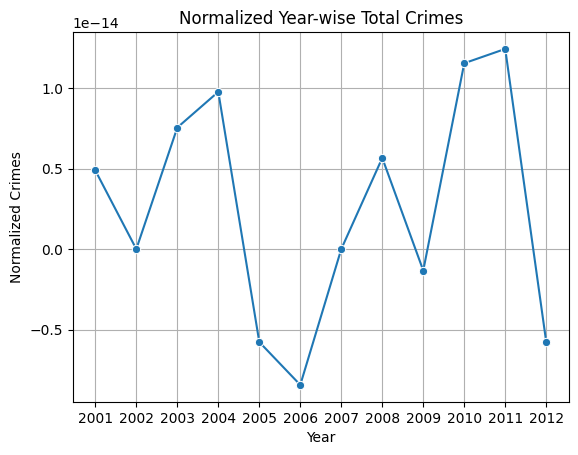

In [74]:

# Normalize the data for each year
df_normalized = df.copy()
df_normalized[year_columns] = (
    df[year_columns] - df[year_columns].mean()
) / df[year_columns].std()

print("Normalized data:")
print(df_normalized.shape)
df_normalized

# Visualize normalized trends
normalized_yearly_crimes = df_normalized[year_columns].sum()
sns.lineplot(data=normalized_yearly_crimes, marker='o')
plt.title("Normalized Year-wise Total Crimes")
plt.xlabel("Year")
plt.ylabel("Normalized Crimes")
plt.grid()
plt.show()

In [75]:
crime_head_data = df.groupby('CRIME HEAD')[year_columns].sum()
crime_head_predictions = {}

# Years for polynomial regression
x_years = np.arange(2001, 2013).reshape(-1, 1)
future_years = np.arange(2013, 2018).reshape(-1, 1)
future_year_labels = [str(year) for year in range(2013, 2018)]


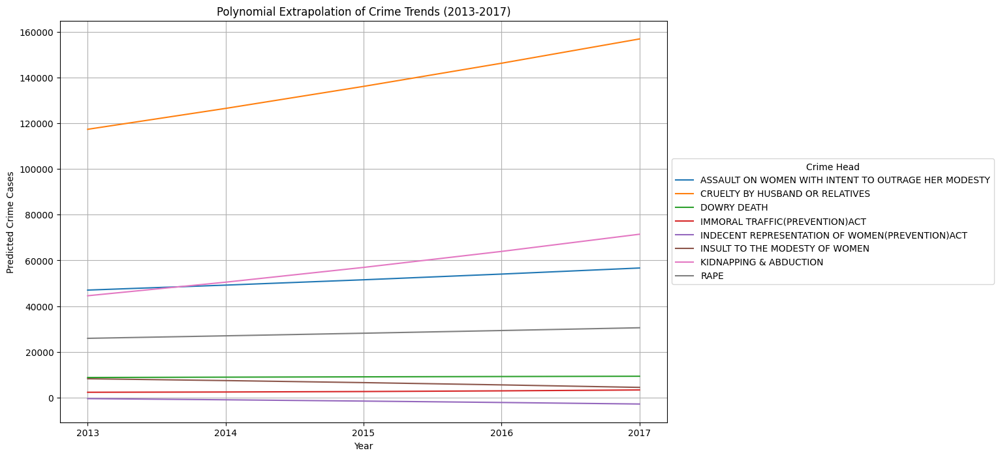

In [76]:

for crime_head, row in crime_head_data.iterrows():
    y_values = row.values  # Crime data from 2001-2012

    # Polynomial regression model
    poly_model = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
    poly_model.fit(x_years, y_values)

    # Predict for future years (2013-2017)
    future_predictions = poly_model.predict(future_years)
    crime_head_predictions[crime_head] = future_predictions

# Convert predictions to DataFrame
predicted_crime_head_df = pd.DataFrame(crime_head_predictions, index=future_year_labels)

# Plot future trends for each Crime Head
plt.figure(figsize=(12, 8))
for crime_head in predicted_crime_head_df.columns:
    sns.lineplot(x=predicted_crime_head_df.index, y=predicted_crime_head_df[crime_head], label=crime_head)

plt.title("Polynomial Extrapolation of Crime Trends (2013-2017)")
plt.xlabel("Year")
plt.ylabel("Predicted Crime Cases")
plt.legend(title="Crime Head", loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()


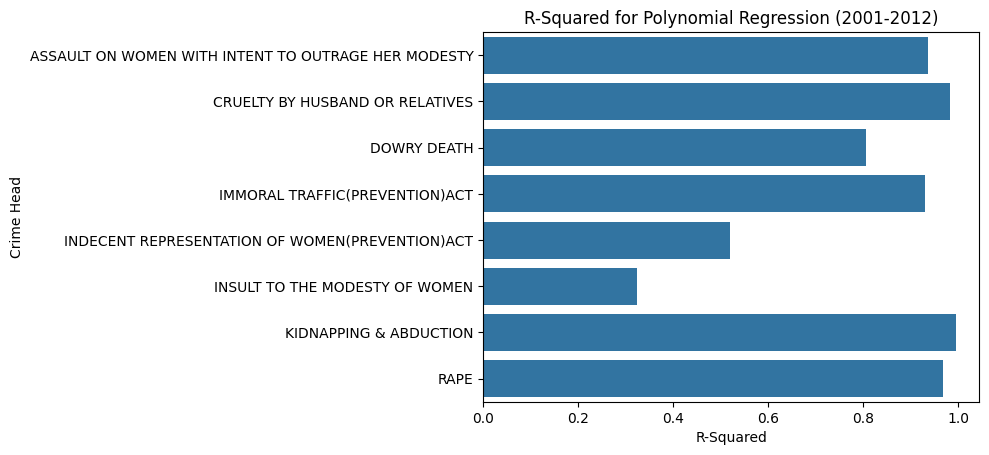

In [77]:
r2_scores_poly = {}

for crime_head, row in crime_head_data.iterrows():
    y_values = row.values
    poly_model = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
    poly_model.fit(x_years, y_values)

    # Predicted values and R2 score
    fitted_values = poly_model.predict(x_years)
    r2_scores_poly[crime_head] = r2_score(y_values, fitted_values)

# Plot R-squared
sns.barplot(x=list(r2_scores_poly.values()), y=list(r2_scores_poly.keys()))
plt.title("R-Squared for Polynomial Regression (2001-2012)")
plt.xlabel("R-Squared")
plt.ylabel("Crime Head")
plt.show()



Descriptive statistics for year-wise data:
              2001         2002         2003         2004         2005  \
count   280.000000   280.000000   280.000000   280.000000   280.000000   
mean    501.639286   500.507143   492.396429   538.042857   543.567857   
std    1104.484136  1062.594819  1074.649132  1153.867801  1160.308825   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       2.000000     2.000000     1.750000     2.000000     2.000000   
50%      37.500000    43.000000    46.500000    44.500000    46.500000   
75%     463.000000   465.250000   489.250000   559.250000   575.750000   
max    7365.000000  7118.000000  8167.000000  8388.000000  8696.000000   

              2006          2007          2008          2009          2010  \
count   280.000000    280.000000    280.000000    280.000000    280.000000   
mean    572.121429    641.528571    679.407143    707.521429    744.167857   
std    1237.914094   1466.866318   1588.208975   1739.6

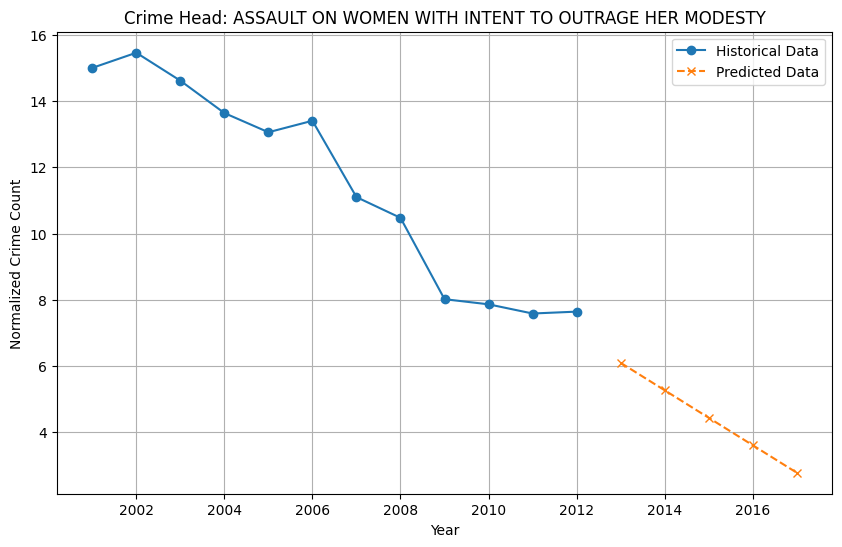

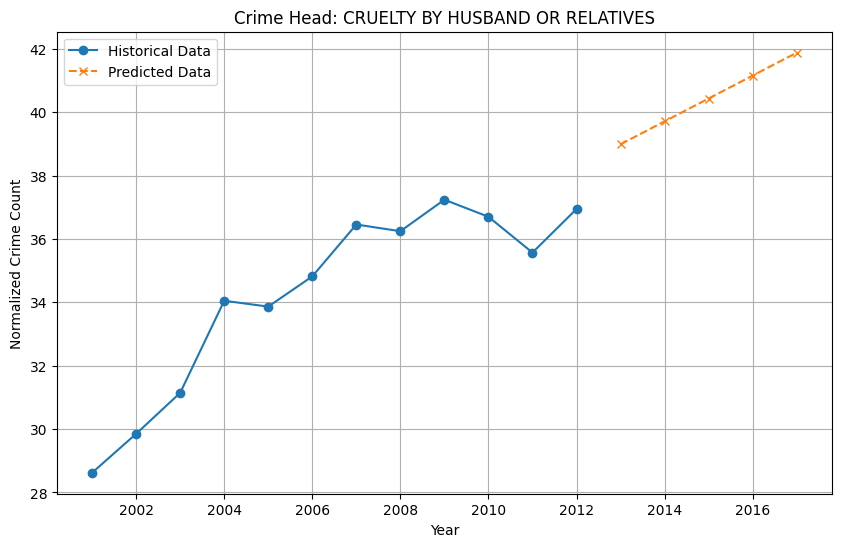

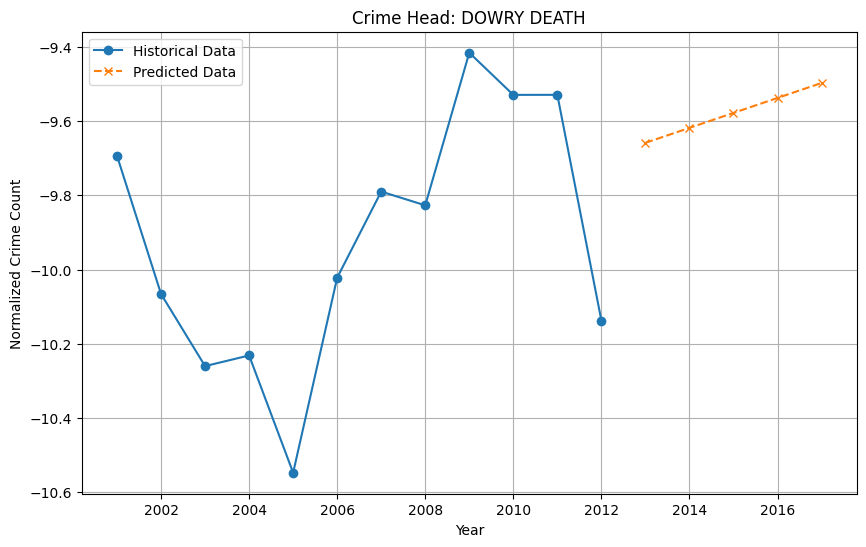

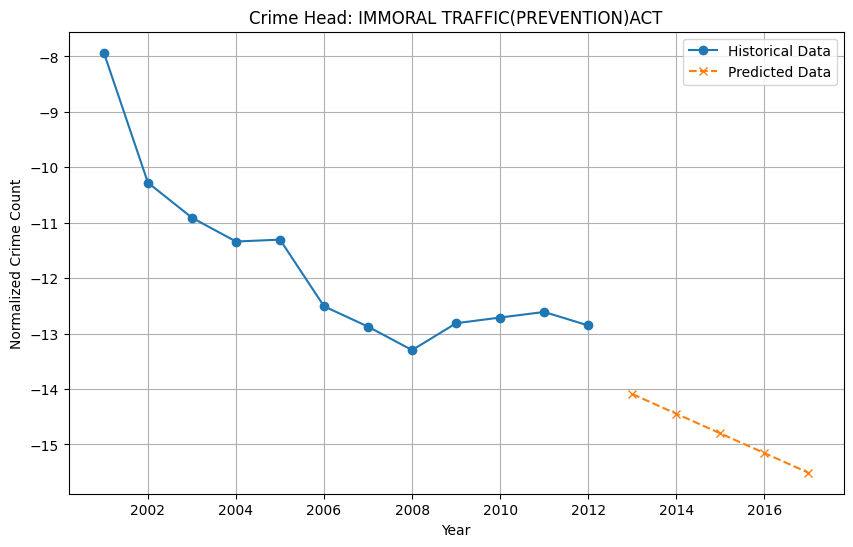

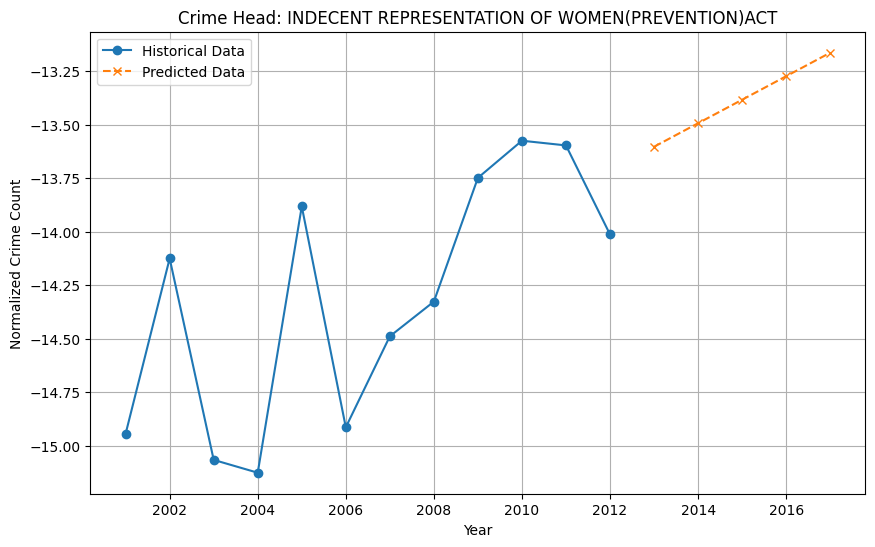

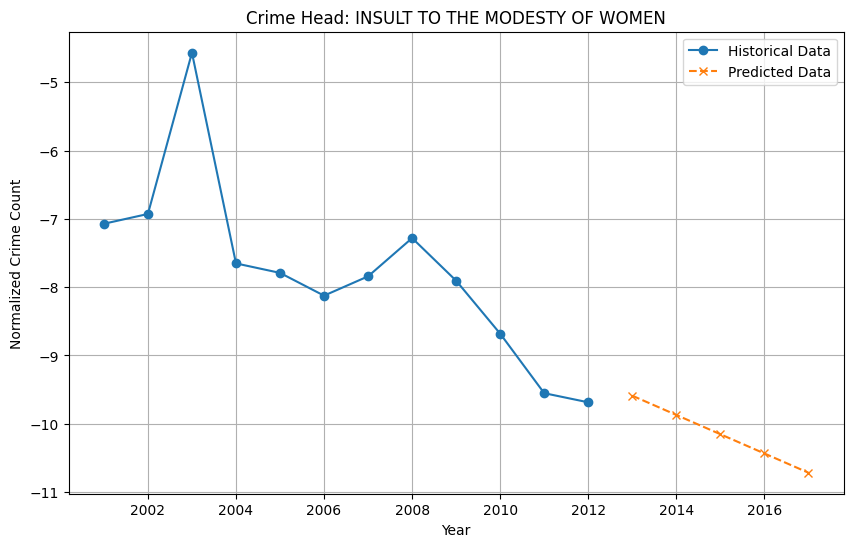

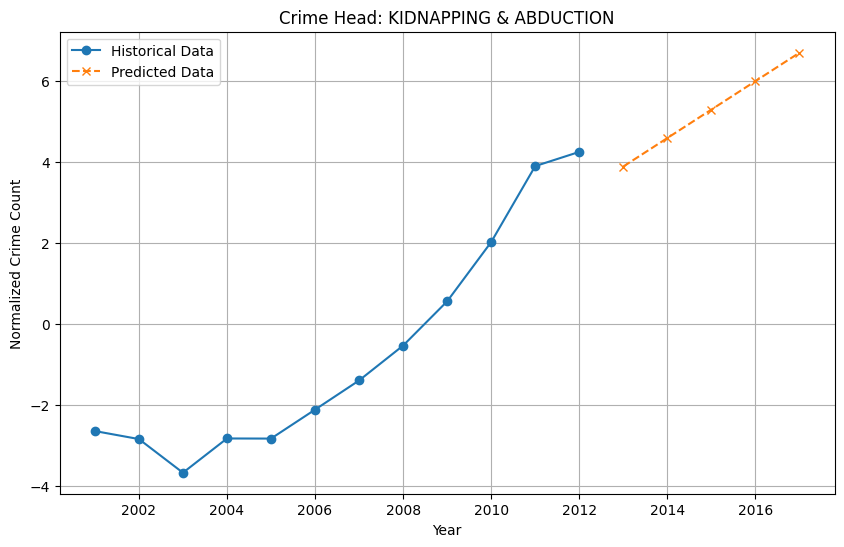

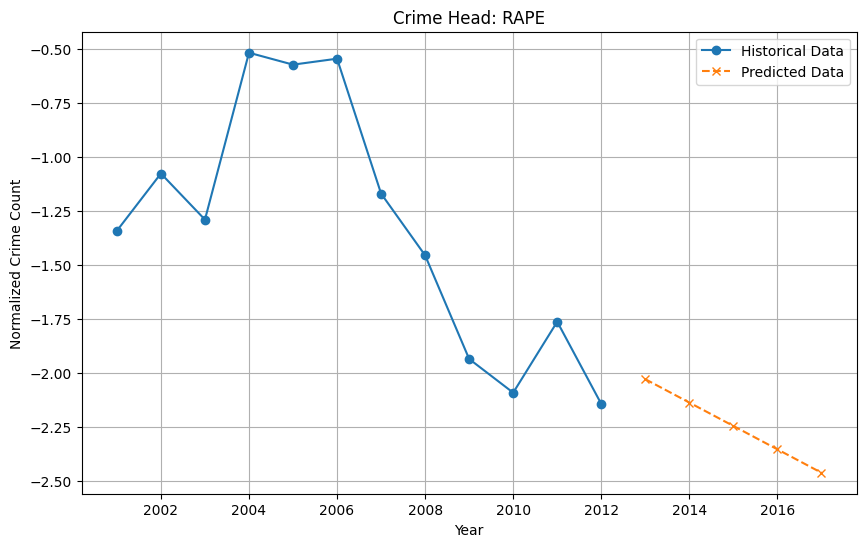

In [78]:
# Descriptive statistics for year-wise data
year_columns = [str(year) for year in range(2001, 2013)]
print("\nDescriptive statistics for year-wise data:")
print(df[year_columns].describe())

df_normalized = df.copy()
df_normalized[year_columns] = (df[year_columns] - df[year_columns].mean()) / df[year_columns].std()

crime_head_data = df_normalized.groupby('CRIME HEAD')[year_columns].sum()

# Future years for prediction
future_years = [2013, 2014, 2015, 2016, 2017]

# Dictionary to store predictions
crime_head_predictions = {}

for crime_head, row in crime_head_data.iterrows():
    # Prepare input and output for regression
    x_years = np.array(range(2001, 2013)).reshape(-1, 1)
    y_values = row.values

    # Linear regression model
    model = LinearRegression()
    model.fit(x_years, y_values)

    # Predict future years
    future_x_years = np.array(future_years).reshape(-1, 1)
    future_predictions = model.predict(future_x_years)

    # Store predictions
    crime_head_predictions[crime_head] = future_predictions

    # Plot historical data and predictions
    plt.figure(figsize=(10, 6))
    plt.plot(range(2001, 2013), y_values, marker='o', label="Historical Data")
    plt.plot(future_years, future_predictions, marker='x', linestyle='--', label="Predicted Data")
    plt.title(f"Crime Head: {crime_head}")
    plt.xlabel("Year")
    plt.ylabel("Normalized Crime Count")
    plt.legend()
    plt.grid()
    plt.show()


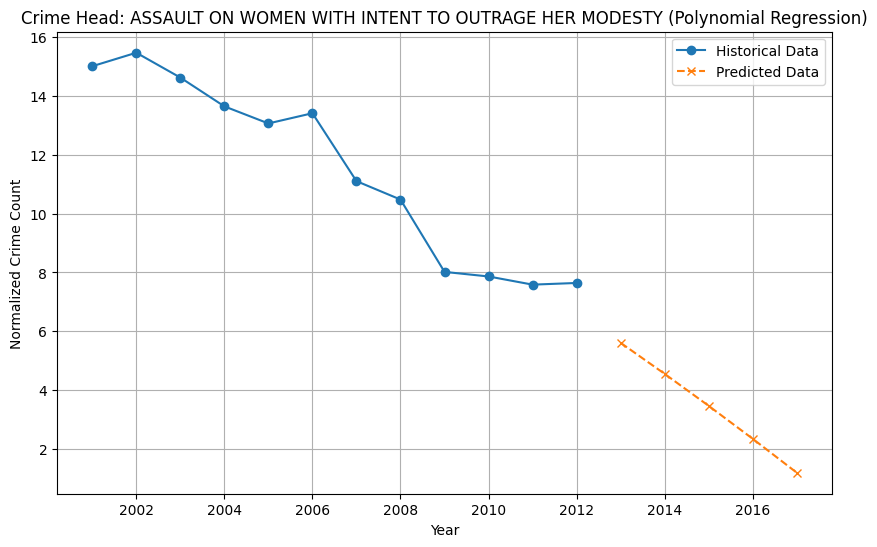

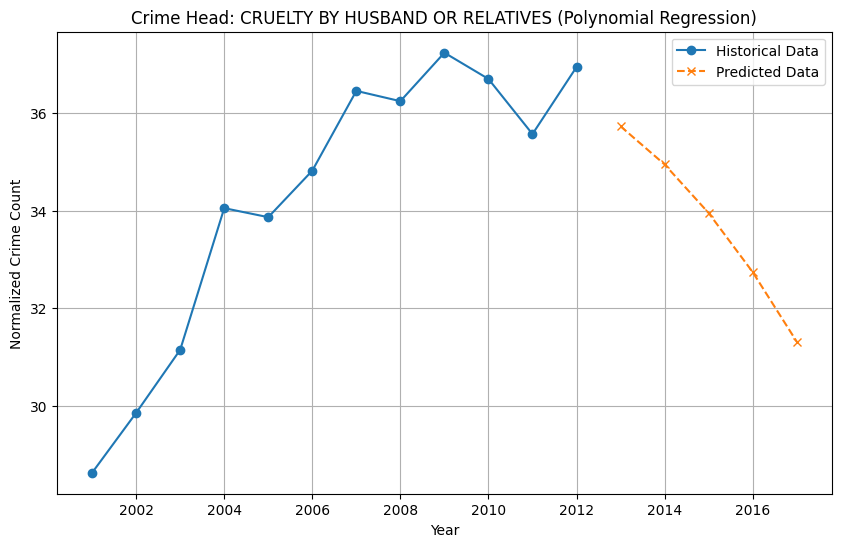

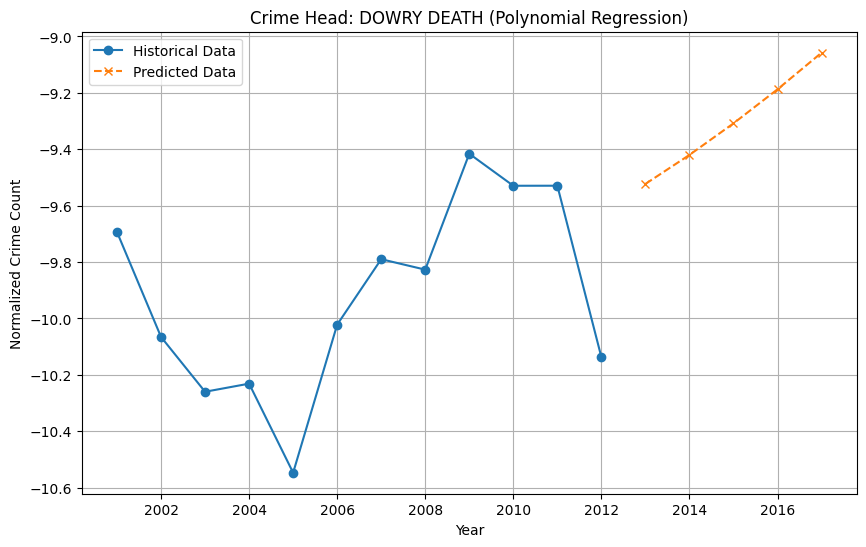

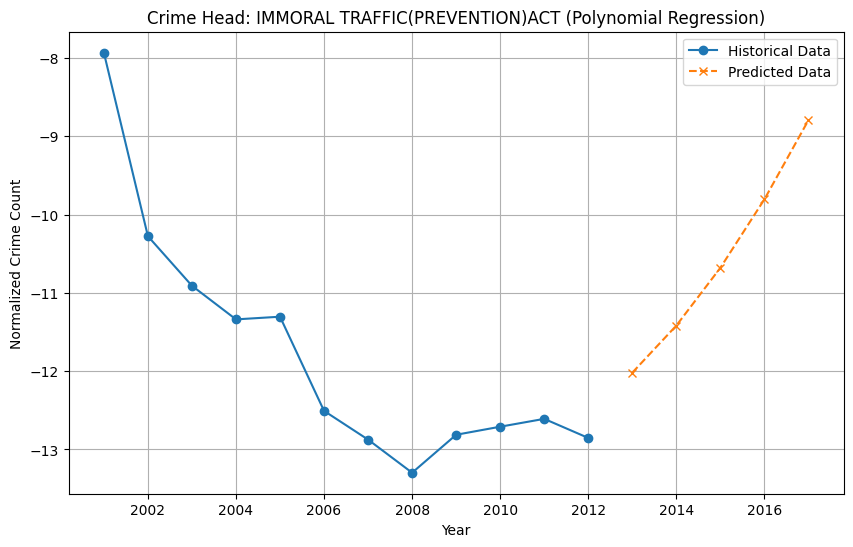

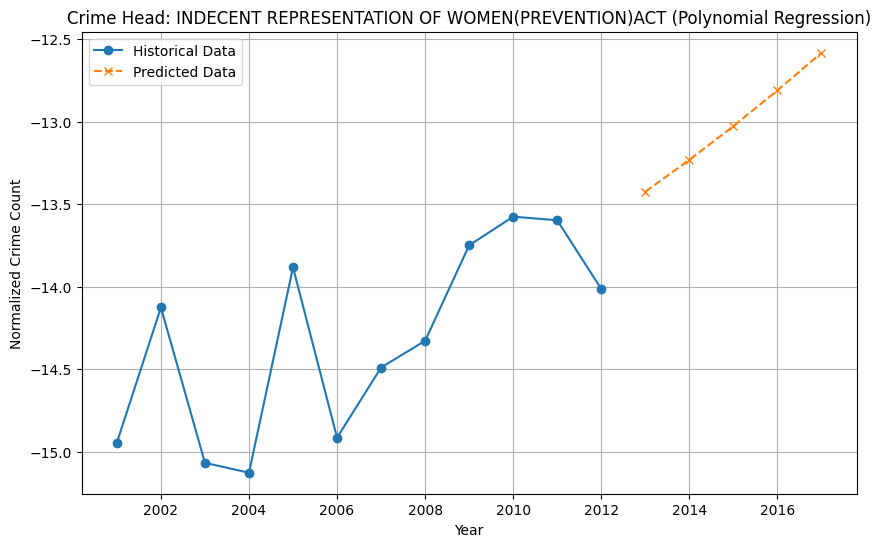

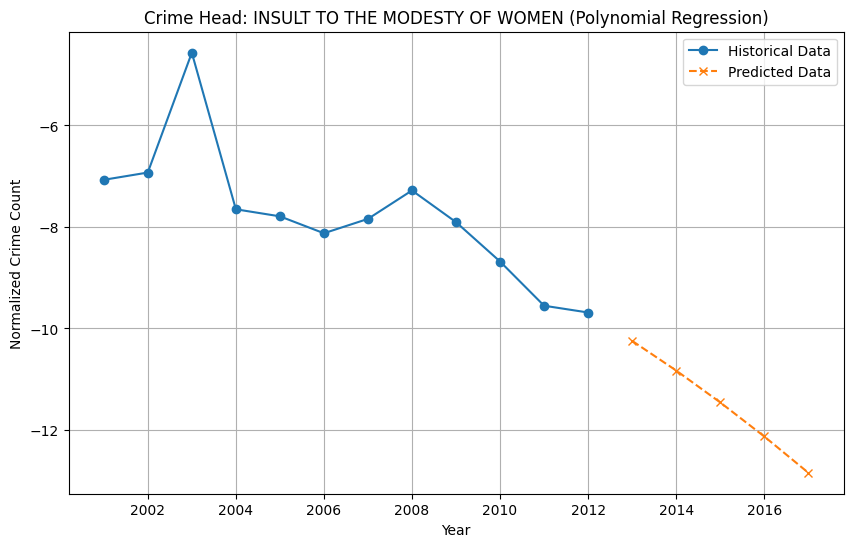

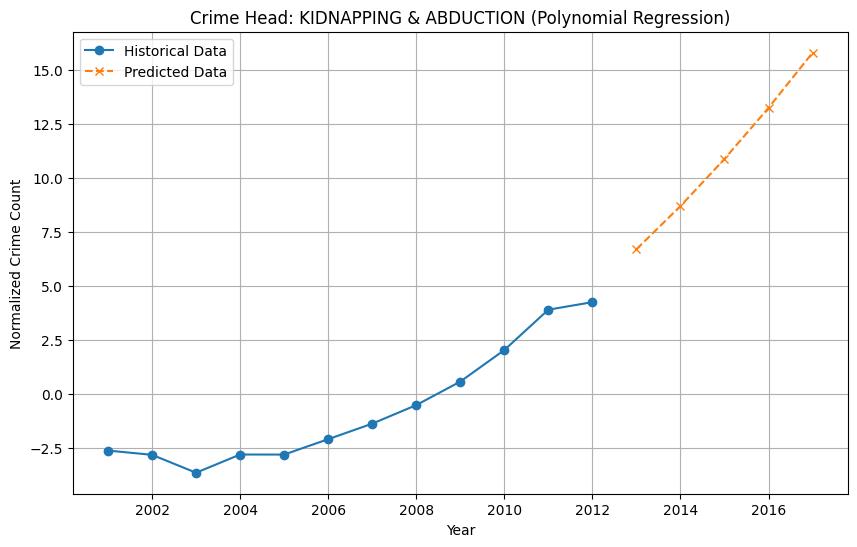

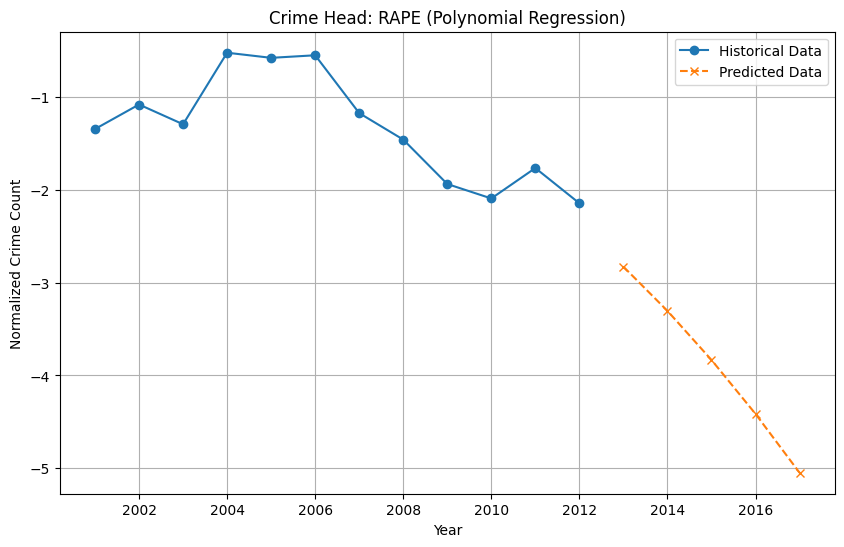

In [79]:
from sklearn.preprocessing import PolynomialFeatures

# Polynomial Regression for each crime head
crime_head_poly_predictions = {}

for crime_head, row in crime_head_data.iterrows():
    # Prepare input and output
    x_years = np.array(range(2001, 2013)).reshape(-1, 1)
    y_values = row.values

    # Polynomial features of degree 2
    poly = PolynomialFeatures(degree=2)
    x_poly = poly.fit_transform(x_years)

    # Polynomial regression model
    model = LinearRegression()
    model.fit(x_poly, y_values)

    # Predict future years
    future_x_poly = poly.transform(np.array(future_years).reshape(-1, 1))
    future_predictions = model.predict(future_x_poly)

    # Store predictions
    crime_head_poly_predictions[crime_head] = future_predictions

    # Plot historical data and predictions
    plt.figure(figsize=(10, 6))
    plt.plot(range(2001, 2013), y_values, marker='o', label="Historical Data")
    plt.plot(future_years, future_predictions, marker='x', linestyle='--', label="Predicted Data")
    plt.title(f"Crime Head: {crime_head} (Polynomial Regression)")
    plt.xlabel("Year")
    plt.ylabel("Normalized Crime Count")
    plt.legend()
    plt.grid()
    plt.show()


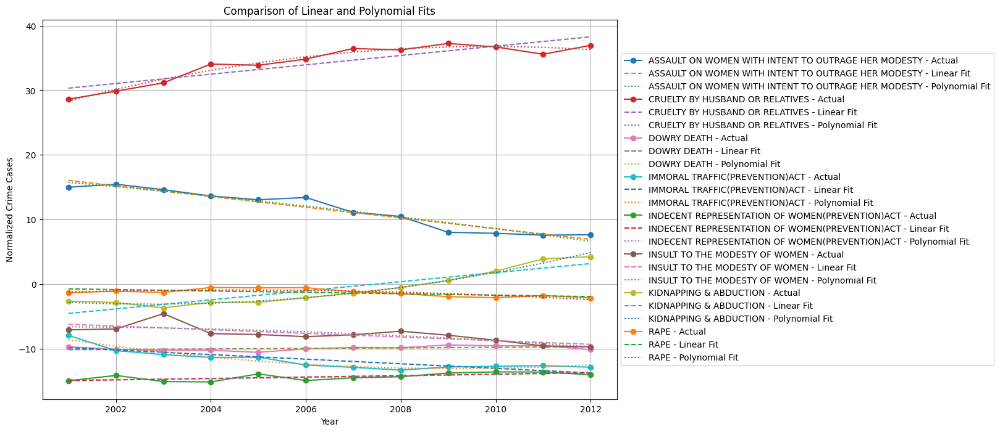

In [80]:
# Overlay predictions from Linear and Polynomial Regression
plt.figure(figsize=(12, 8))
for crime_head, row in crime_head_data.iterrows():
    plt.plot(range(2001, 2013), row.values, label=f"{crime_head} - Actual", marker='o')
    linear_pred = LinearRegression().fit(x_years, row.values).predict(x_years)
    poly_pred = make_pipeline(PolynomialFeatures(2), LinearRegression()).fit(x_years, row.values).predict(x_years)
    plt.plot(range(2001, 2013), linear_pred, linestyle='--', label=f"{crime_head} - Linear Fit")
    plt.plot(range(2001, 2013), poly_pred, linestyle=':', label=f"{crime_head} - Polynomial Fit")

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("Comparison of Linear and Polynomial Fits")
plt.xlabel("Year")
plt.ylabel("Normalized Crime Cases")
plt.grid()
plt.show()


In [81]:
from sklearn.model_selection import TimeSeriesSplit

# Example with TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=3)
for train_index, test_index in tscv.split(x_years):
    x_train, x_test = x_years[train_index], x_years[test_index]
    y_train, y_test = y_values[train_index], y_values[test_index]
    model = LinearRegression().fit(x_train, y_train)
    print("Train R2:", model.score(x_train, y_train))
    print("Test R2:", model.score(x_test, y_test))


Train R2: 0.03377816137113654
Test R2: -742.0293620468027
Train R2: 0.7409669484326462
Test R2: -21.779016471039743
Train R2: 0.0979924597808941
Test R2: -11.40677737986082
